In [420]:
%matplotlib inline
import json
import folium
import pyproj
import math
import pandas as pd
from ggplot import *
from convertbng.util import convert_bng, convert_lonlat
import numpy as np
import numpy

In [4]:
with open('packets.json','r') as f:
    data = json.load(f)

In [3]:
data

[{u'gateways': [{u'addr': u'70b3d54b13830000',
    u'alt': 91,
    u'lat': 51.52291,
    u'lon': -0.13228,
    u'rssi': -103,
    u'time': 1488895867.222774},
   {u'addr': u'70b3d54b12600000',
    u'alt': 47,
    u'lat': 51.5284,
    u'lon': -0.13808,
    u'rssi': -112,
    u'time': 1488895867.222774},
   {u'addr': u'70b3d54b110f0000',
    u'alt': 71,
    u'lat': 51.52876,
    u'lon': -0.12677,
    u'rssi': -100,
    u'time': 1488901053.21164},
   {u'addr': u'70b3d54b12600000',
    u'alt': 56,
    u'lat': 51.52841,
    u'lon': -0.13814,
    u'rssi': -99,
    u'time': 1488901053.211635}],
  u'payload': {u'alt': 60.477,
   u'hour': 14,
   u'i': 25741,
   u'lat': 51.536398,
   u'lon': -0.1352017,
   u'mins': 11,
   u'sats': 4,
   u'secs': 6}},
 {u'gateways': [{u'addr': u'70b3d54b12600000',
    u'alt': 53,
    u'lat': 51.52839,
    u'lon': -0.13811,
    u'rssi': -108,
    u'time': 1488895705.22184},
   {u'addr': u'70b3d54b110f0000',
    u'alt': 73,
    u'lat': 51.52878,
    u'lon': -0.1267

In [23]:
print "Number of packets: %d" % len(data)

Number of packets: 648


In [207]:
for packet in data:
    packet['gateways'] = [gw for gw in packet['gateways'] if gw['addr'] != '70b3d54b133f0000']

In [208]:
gateway_nums = {1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0}
for packet in data:
    gateway_nums[len(packet['gateways'])] += 1

print "Number of packets received by n gateways: "
print gateway_nums

Number of packets received by n gateways: 
{1: 310, 2: 168, 3: 111, 4: 46, 5: 13, 6: 0}


In [215]:
# Duplicates!?!?!?!

for i, packet in enumerate(data):
    nums = {}
    for gw in packet['gateways']:
        if gw['addr'] not in nums:
            nums[gw['addr']] = 0
        nums[gw['addr']] += 1
    
    for key,vals in nums.iteritems():
        if vals > 1:
            print i
            print packet
            print ""
            break

0
{u'payload': {u'sats': 4, u'hour': 14, u'i': 25741, u'lon': -0.1352017, u'secs': 6, u'lat': 51.536398, u'alt': 60.477, u'mins': 11}, u'gateways': [{u'addr': u'70b3d54b13830000', u'lon': -0.13228, u'time': 1488895867.222774, u'lat': 51.52291, u'rssi': -103, u'alt': 91}, {u'addr': u'70b3d54b12600000', u'lon': -0.13808, u'time': 1488895867.222774, u'lat': 51.5284, u'rssi': -112, u'alt': 47}, {u'addr': u'70b3d54b110f0000', u'lon': -0.12677, u'time': 1488901053.21164, u'lat': 51.52876, u'rssi': -100, u'alt': 71}, {u'addr': u'70b3d54b12600000', u'lon': -0.13814, u'time': 1488901053.211635, u'lat': 51.52841, u'rssi': -99, u'alt': 56}]}

2
{u'payload': {u'sats': 4, u'hour': 14, u'i': 25736, u'lon': -0.1351298, u'secs': 0, u'lat': 51.5369309, u'alt': 57.09, u'mins': 8}, u'gateways': [{u'addr': u'70b3d54b12600000', u'lon': -0.13811, u'time': 1488895681.22441, u'lat': 51.52839, u'rssi': -114, u'alt': 53}, {u'addr': u'70b3d54b110f0000', u'lon': -0.12678, u'time': 1488901003.211259, u'lat': 51.52

In [209]:
gateways = {}
for packet in data:
    for gw in packet['gateways']:
        gateways[gw['addr']]= {
                'lat': gw['lat'],
                'lon': gw['lon'],
                'alt': gw['alt']
                }
        
print "Number of unique gateways: %d" % len(gateways)


Number of unique gateways: 8


In [210]:
map_1 = folium.Map(location=[51.523668, -0.117931], tiles='Stamen Toner', zoom_start=13)

for addr,gw in gateways.iteritems():
    folium.Marker([gw['lat'], gw['lon']],
                  popup=addr,
                  icon=folium.Icon(color='blue',icon='wifi',prefix='fa')
                  ).add_to(map_1)

#folium.Circle([gateways['70b3d54b13830000']['lat'], gateways['70b3d54b13830000']['lon']],
#                    radius=300,
#                    color='#0087c1',
#                    fill_color='#0087c1',
#                   ).add_to(map_1)


colours = {1: '#db3a00', 2: '#e07300', 3: '#9ce000', 4: '#4ee000', 5:'#10ff00'}

for packet in data:
    folium.CircleMarker([packet['payload']['lat'], packet['payload']['lon']],
                    radius=1,
                    color=colours[len(packet['gateways'])],
                    fill_color=colours[len(packet['gateways'])],
                   ).add_to(map_1)
    
map_1

## Conversion from ECEF to LLA and vice versa  (3D)

In [28]:
ecef = pyproj.Proj(proj='geocent', ellps='WGS84', datum='WGS84')
lla = pyproj.Proj(proj='latlong', ellps='WGS84', datum='WGS84')

def llaToEcef(lat, lon, alt):
    x, y, z = pyproj.transform(lla, ecef, lon, lat, alt, radians=False)    
    return x, y, z

def EcefToLla(x, y, z):
    lon, lat, alt = pyproj.transform(ecef, lla, x, y, z, radians=False) 
    return lon, lat, alt

def distance3D(x1, y1, z1, x2, y2, z2):
    return math.sqrt((x1-x2)**2 + (y1-y2)**2 + (z1-z2)**2)

def distance2D(x1, y1, x2, y2):
    return math.sqrt((x1-x2)**2 + (y1-y2)**2)

## RSSI vs Distance

In [211]:
rssi_distance = []
for packet in data:
    #x1,y1,z1 = llaToEcef(packet['payload']['lat'], packet['payload']['lon'], packet['payload']['alt'])
    
    x1,y1 = convert_bng(packet['payload']['lon'], packet['payload']['lat'])

    for gw in packet['gateways']:
        #x2,y2,z2 = llaToEcef(gw['lat'], gw['lon'], gw['alt'])
        
        x2,y2 = convert_bng(gw['lon'], gw['lat'])
        
        #d = distance(x1, y1, z1, x2, y2, z2)
        d = math.sqrt((x1[0]-x2[0])**2 + (y1[0]-y2[0])**2)
        rssi_distance.append((gw['addr'],gw['rssi'],d))    

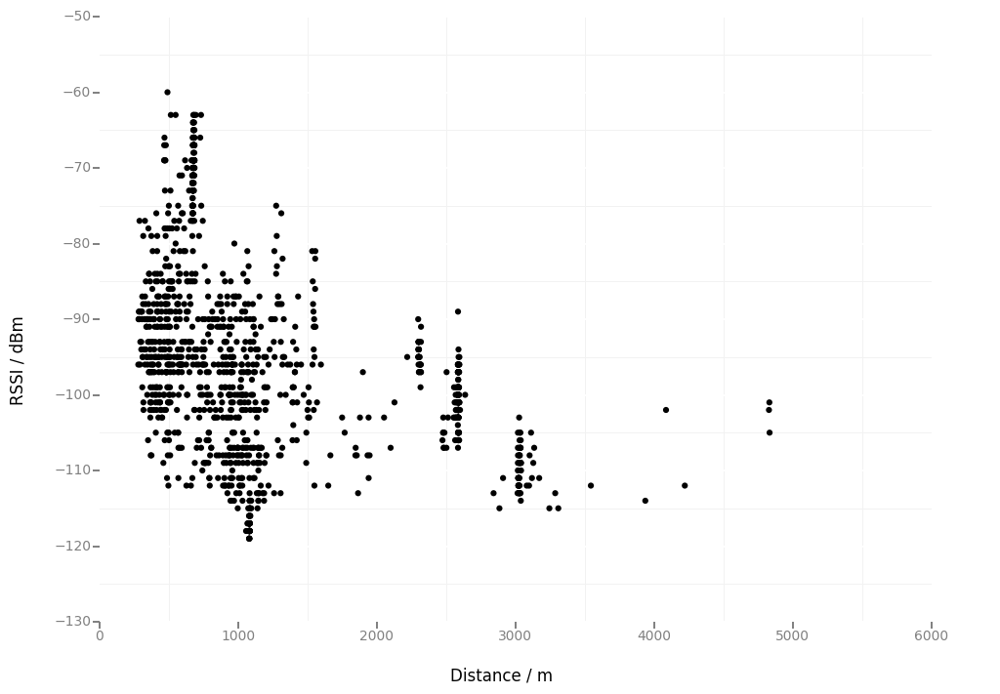

<ggplot: (285887409)>

In [213]:
rssi_distance = pd.DataFrame(rssi_distance, columns=['Gateway', 'RSSI', 'Distance'])
p = ggplot(aes(x='Distance', y='RSSI'), data=rssi_distance) #color='Gateway'
p + geom_point() + xlab("Distance / m") + ylab("RSSI / dBm") + theme_bw()

## TDOA

In [243]:
import numpy as np
import matplotlib as mpl
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
plt.style.use('ggplot')

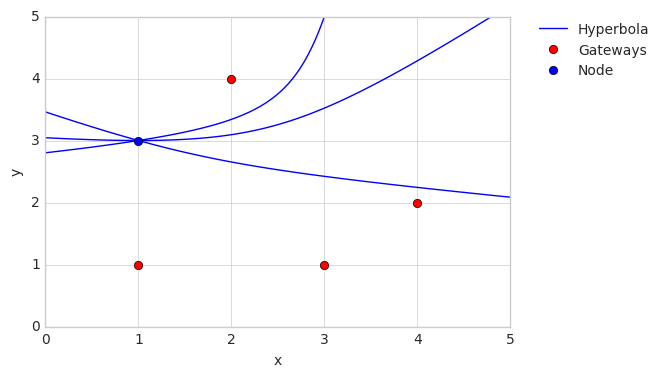

In [531]:
xi = 1
yi = 1
xj = 4
yj = 2

xk = 2
yk = 4

xl = 3
yl = 1

d = 0


x = np.linspace(0, 5, 400)
y = np.linspace(0, 5, 400)
x, y = np.meshgrid(x, y)

plt.style.use('seaborn-whitegrid')

plt.axhline(0, alpha=.1)
plt.axvline(0, alpha=.1)

plt.contour(x, y, ( np.sqrt((x-xi)**2 + (y-yi)**2) - np.sqrt((x-xk)**2 + (y-yk)**2) ), [2-np.sqrt(2)], colors='b' )
plt.contour(x, y, ( np.sqrt((x-xj)**2 + (y-yj)**2) - np.sqrt((x-xk)**2 + (y-yk)**2) ), [np.sqrt(10)-np.sqrt(2)], colors='b')


plt.plot([xi,xj,xk], [yi,yj,yk], 'or')

plt.plot([xl], [yl], 'or')
plt.contour(x, y, ( np.sqrt((x-xl)**2 + (y-yl)**2) - np.sqrt((x-xk)**2 + (y-yk)**2) ), [np.sqrt(8)-np.sqrt(2)], colors='b')

plt.plot(1, 3, 'ob')

blue_line = mlines.Line2D([], [], color='blue', label='Hyperbola')
red_circ = mlines.Line2D(range(1), range(1), label='Gateways', color="none", marker='o', markerfacecolor="red")
blue_circ = mlines.Line2D(range(1), range(1), label='Node', color="none", marker='o', markerfacecolor="blue")

legend = [blue_line, red_circ, blue_circ]
plt.legend(handles=legend, numpoints=1, fontsize=10, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.ylabel('y', fontsize=10)
plt.xlabel('x', fontsize=10)

plt.show()
    



In [306]:
def plotTDOA(D,A=None,B=None):
    x = np.linspace(528000, 532000, 1000)
    y = np.linspace(180000, 184000, 1000)
    x, y = np.meshgrid(x, y)
    
    plt.style.use('seaborn-whitegrid')
    
    for i in range(1,len(D),1):
        plt.contour(x, y, ( np.sqrt((x-D[i,0])**2 + (y-D[i,1])**2) - np.sqrt((x-D[0,0])**2 + (y-D[0,1])**2) ), [D[i,2]], colors='b')

    blue_line = mlines.Line2D([], [], color='blue', label='Hyperbola')
    red_circ = mlines.Line2D(range(1), range(1), label='Gateways', color="none", marker='o', markerfacecolor="red")

    legend = [blue_line, red_circ]
    
    plt.plot(D[:,0], D[:,1], 'or')
    if A is not None:
        plt.plot(A[0], A[1], 'ob')
        legend.append(mlines.Line2D(range(1), range(1), label='True Location', color="none", marker='o', markerfacecolor="blue"))
    if B is not None:
        plt.plot(B[0], B[1], 'og')
        legend.append(mlines.Line2D(range(1), range(1), label='Estimated Location', color="none", marker='o', markerfacecolor="green"))
    
    plt.legend(handles=legend, numpoints=1, loc=1, fontsize=10)
    
    plt.ylabel('y / metres', fontsize=10)
    plt.xlabel('x / metres', fontsize=10)
        
    plt.show()

In [31]:
import scipy

In [32]:
C=299792458.0

def deltaD(TOAi, TOAj):
    TDOA = TOAi - TOAj
    print TDOA
    return C*TDOA
    

In [33]:
deltaD(1,1.000001)

-9.99999999918e-07


-299.7924579753371

In [234]:
def TDOAs_2D(gateways):
    tmp = []
    for gw in gateways:
        x,y = convert_bng(gw['lon'], gw['lat'])
        tmp.append(x+y+[gw['time']])
    
    D = scipy.array(tmp)
    D = D[D[:,2].argsort()]
    D = D[-3:,:]

    for i in reversed(range(len(D[:,2]))):
        D[i,2] -= D[0,2]
        D[i,2] *= C
    return scipy.matrix(D)

3
[[ 530787.952       180896.81             0.        ]
 [ 529198.826       181926.615          857.71310234]
 [ 529664.249       182104.268         1215.09356165]]


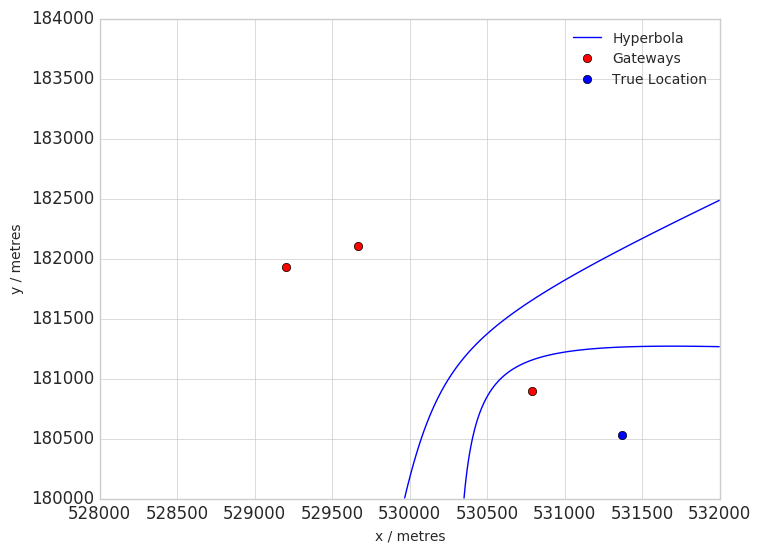

In [307]:
i = 632
D = TDOAs_2D(data[i]['gateways'])
print len(D)
print D
A = convert_bng(data[i]['payload']['lon'], data[i]['payload']['lat'])
plotTDOA(D,A)



In [352]:
def Chan_for3(D):
    P = D[1:3,0:2] - D[0,0:2]
    A = -P.I
    
    R = D[1:3,2]
    R_sq = scipy.matrix(R.A * R.A)
    
    K = scipy.zeros((3,1))
    M = D[:,0:2]
    for n in range(3):
        K[n] = M[n] * M[n].T
    
    B = (R_sq - K[1:4] + K[0]) / 2
    
    # T = E.R0 + F
    E = A*R
    F = A*B
    
    # Find R0
    a = 1 - (E.T * E)
    b = 2 * (M[0] * E - F.T * E)
    c = 2 * (M[0] * F) - F.T * F - K[0]
    
    discr = b*b - 4*a*c
    res = []
    if discr >= 0:
        h = scipy.sqrt(discr)
        for sign in [-1,1]:
            R0 = (sign*h-b)/(2*a)
            if R0 >= 0:
                T = E*R0 + F
                #print T
                res.append((T.A.squeeze(), R0))
        
    return res

In [842]:
k = [2, 2, 0]
j = [4, 2, np.sqrt(10)-np.sqrt(2)]
i = [1, 1, 2-np.sqrt(2)]
test = scipy.matrix([k, j, i])

Chan_for3(test)

[[ 1.]
 [ 3.]]
[[ 1.84832857]
 [ 1.58311176]]


[(array([ 1.,  3.]), matrix([[ 1.41421356]])),
 (array([ 1.84832857,  1.58311176]), matrix([[ 0.44362149]]))]

In [369]:
errors_no_offsets = []
cnt = 0
for i,packet in enumerate(data):
    if len(packet['gateways']) < 3:
        continue
    D = TDOAs_2D(packet['gateways'])
    if D is not False:
        cnt += 1
        
        n = len(D[:,0])
        res = []
        for i in range(1,n):
            for j in range(i,n):
                if i != j:       
                    res.append(Chan_for3(D[(0,i,j),:]))
        
        if res:
            A = convert_bng(packet['payload']['lon'], packet['payload']['lat'])
            #d=[]
            #for row in D:
            #    d.append(distance2D(A[0][0],A[1][0],row[0,0],row[0,1]))
            #for item in d:
            #    print item - d[0]
            
            errs = []
            for pos in res:
                if pos:
                    for bla in pos:
                        print bla[0]
                        errs.append(distance2D(bla[0][0],bla[0][1],A[0][0],A[1][0]))
                    errors_no_offsets.append(min(errs))

            #plotTDOA(D,A)

[ 530121.61725299  182016.64491867]
[ 529526.58404791  184091.4539616 ]
[ 529636.51950523  182801.16644451]
[ 529658.3716694   182538.56435856]
[ 529360.17137181  182705.54239196]
[ 529966.6985692   182747.30061364]
[ 529801.51396341  182634.70270798]
[ 530545.1389901   182036.14061488]
[ 530046.65659282  181938.60529892]
[ 529654.88474941  182540.16848162]
[ 529439.07986408  183015.96528108]
[ 529849.85397111  182430.74595438]
[ 530537.97231344  180811.61055106]
[ 528768.99547807  180045.28030606]
[ 529442.86707131  181560.95352341]
[ 528998.96023791  182066.86235232]
[ 530680.02698836  181732.81954559]
[ 530408.58068229  182132.94599954]


In [236]:
print np.mean(errors_no_offsets)
print np.median(errors_no_offsets)
print np.std(errors_no_offsets)
print len(errors_no_offsets)/170.0
print len(errors_no_offsets)
print cnt

1112.43896209
882.238834696
670.906051284
0.105882352941
18
170


In [370]:
print np.mean(errors_no_offsets)
print np.median(errors_no_offsets)
print np.std(errors_no_offsets)
print len(errors_no_offsets)/170.0
print len(errors_no_offsets)
print cnt

1112.43896209
882.238834696
670.906051284
0.105882352941
18
170


0b3d54b12600000 is about 5000 seconds out of sync.


Frequencies better for indoor? Indoor positioning


# Offsets

Gateway Pair Offsets, Packets with 2+ gateways

In [50]:
pairs = {}
pairslist = []
bigoffsets = {}
bigoffsetpairs = set()

for packet in data:
    if len(packet['gateways']) < 2:
        continue
    
    x,y = convert_bng(packet['payload']['lon'], packet['payload']['lat'])
    
    gateways = {}
    for gw in packet['gateways']:
        gx,gy = convert_bng(gw['lon'], gw['lat'])
        real_distance = distance2D(x[0],y[0],gx[0],gy[0])
        real_timetaken = real_distance/C
        
        if gw['addr'] in gateways:
            if gateways[gw['addr']]['time_rcvd'] < gw['time']:
                continue
                
        gateways[gw['addr']] = {
                'addr': gw['addr'],
                'real_timetaken': real_timetaken,
                'time_rcvd': gw['time']
            }
        
    
    
    for gw1 in gateways.values():
        for gw2 in gateways.values():
            if gw1 is gw2:
                continue
            real_timediff = gw1['real_timetaken'] - gw2['real_timetaken']
            esti_timediff = gw1['time_rcvd'] - gw2['time_rcvd']
            if not gw1['addr'] in pairs:
                pairs[gw1['addr']] = {}
            if not gw2['addr'] in pairs[gw1['addr']]:
                pairs[gw1['addr']][gw2['addr']] = []
            pairs[gw1['addr']][gw2['addr']].append({
                    'addr1': gw1['addr'],
                    'addr2': gw2['addr'],
                    'real_timediff': real_timediff,
                    'esti_timediff': esti_timediff,
                    'offset': real_timediff - esti_timediff
                })
            
            if abs(real_timediff - esti_timediff) > 0.05:
                bigoffsetpairs.add((gw1['addr'], gw2['addr']))
                if gw1['addr'] not in bigoffsets:
                    bigoffsets[gw1['addr']] = 0
                if gw2['addr'] not in bigoffsets:
                    bigoffsets[gw2['addr']] = 0
                bigoffsets[gw1['addr']] += 1
                bigoffsets[gw2['addr']] += 1
            
            pairslist.append({
                    'addr': "%s / %s" % (gw1['addr'], gw2['addr']),
                    'addr1': gw1['addr'],
                    'addr2': gw2['addr'],
                    'real_timediff': real_timediff,
                    'esti_timediff': esti_timediff,
                    'offset': real_timediff - esti_timediff
                })

In [44]:
print bigoffsets

{u'70b3d54b13830000': 96, u'70b3d54b12600000': 146, u'70b3d54b13410000': 306, u'70b3d54b11440000': 122, u'70b3d54b12330000': 2, u'70b3d54b109e0000': 12, u'70b3d54b110f0000': 152}


In [45]:
counts = {}
for item in pairslist:
    if item['addr'] not in counts:
        counts[item['addr']] = {'big': 0, 'total': 0}
    counts[item['addr']]['total'] += 1
    if abs(item['offset']) > 1:
        counts[item['addr']]['big'] += 1
cnts = pd.DataFrame(counts).transpose()
cnts[ cnts['big'] != 0 ]#[ cnts['big'] != cnts['total'] ]


,big,total
70b3d54b109e0000 / 70b3d54b12600000,2,17
70b3d54b110f0000 / 70b3d54b12600000,27,141
70b3d54b110f0000 / 70b3d54b13830000,8,112
70b3d54b12600000 / 70b3d54b109e0000,2,17
70b3d54b12600000 / 70b3d54b110f0000,27,141
70b3d54b12600000 / 70b3d54b13830000,19,124
70b3d54b13830000 / 70b3d54b110f0000,8,112
70b3d54b13830000 / 70b3d54b12600000,19,124


In [ ]:
uniquepairslist = []
for pair in pairslist:
    if pair['addr1']

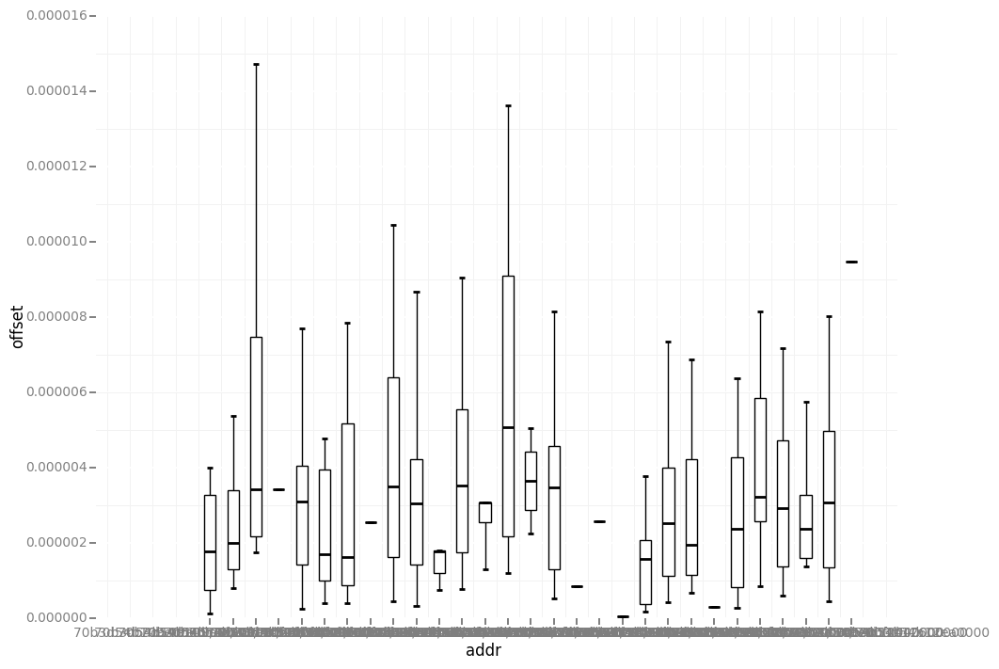

<ggplot: (392323237)>


In [949]:


d = pd.DataFrame(pairslist)
d2 = d[(d['offset'] < 0.05) & (d['offset'] > -0.05)]
p = ggplot(aes(x='addr', y='offset'), data=d2) #color='Gateway'
g = p + geom_boxplot(outliers=False, notch=True) + theme_bw()
print g

In [950]:
print d2['offset'].abs().mean()

3.58480271859e-06


3.58480271859e-06
2.82451824597e-06
2.99540752079e-06


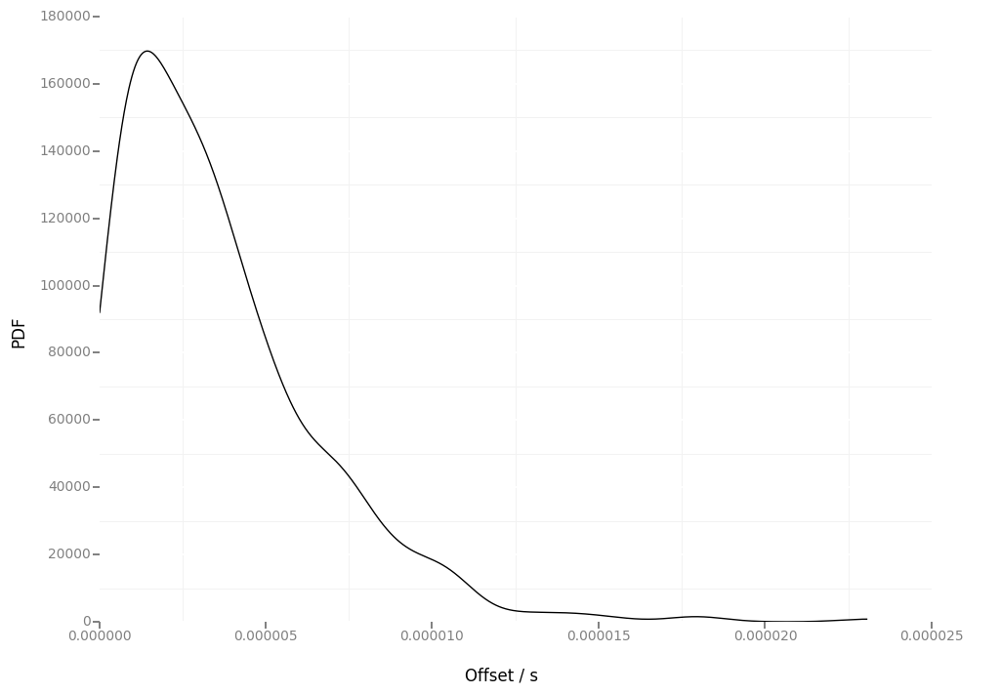

<ggplot: (297196057)>

In [279]:
d = pd.DataFrame(pairslist)
d2 = d[(d['offset'] < 0.05) & (d['offset'] > 0.0)]
print d2['offset'].mean()
print d2['offset'].median()
print d2['offset'].std()
ggplot(aes(x='offset'), data=d2) + stat_density() + xlab("Offset / s") + ylab("PDF") + theme_bw()

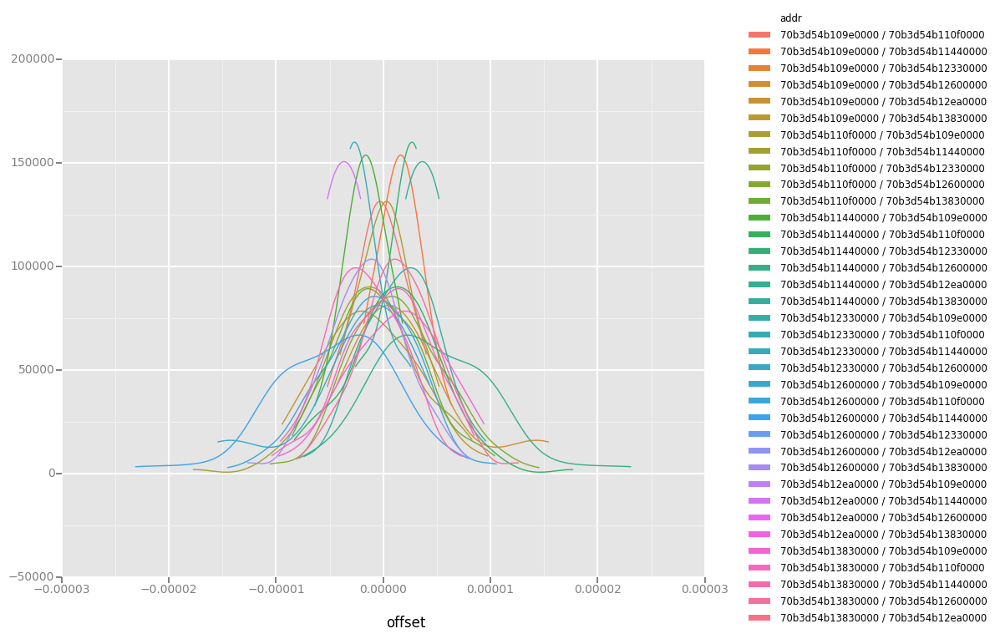

<ggplot: (296889273)>


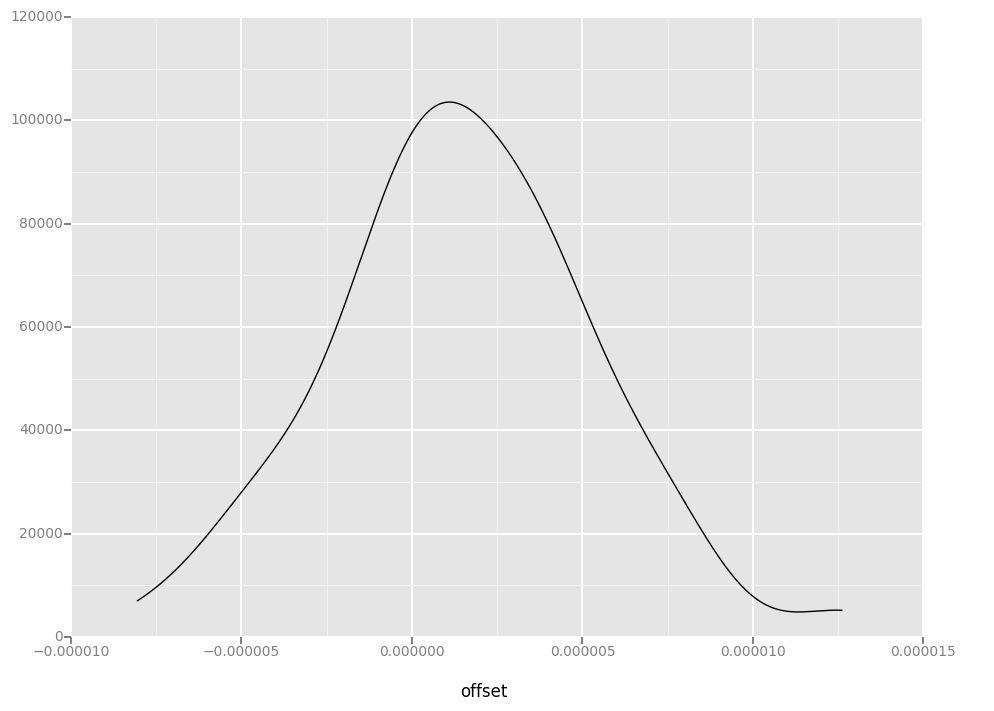

<ggplot: (307361985)>


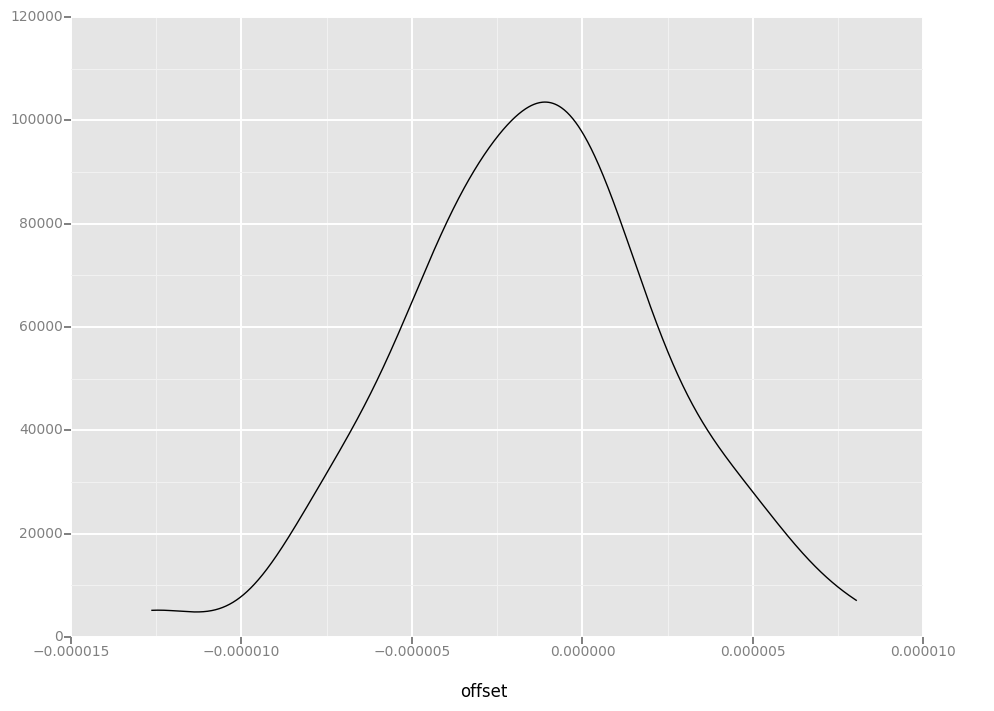

<ggplot: (313538001)>


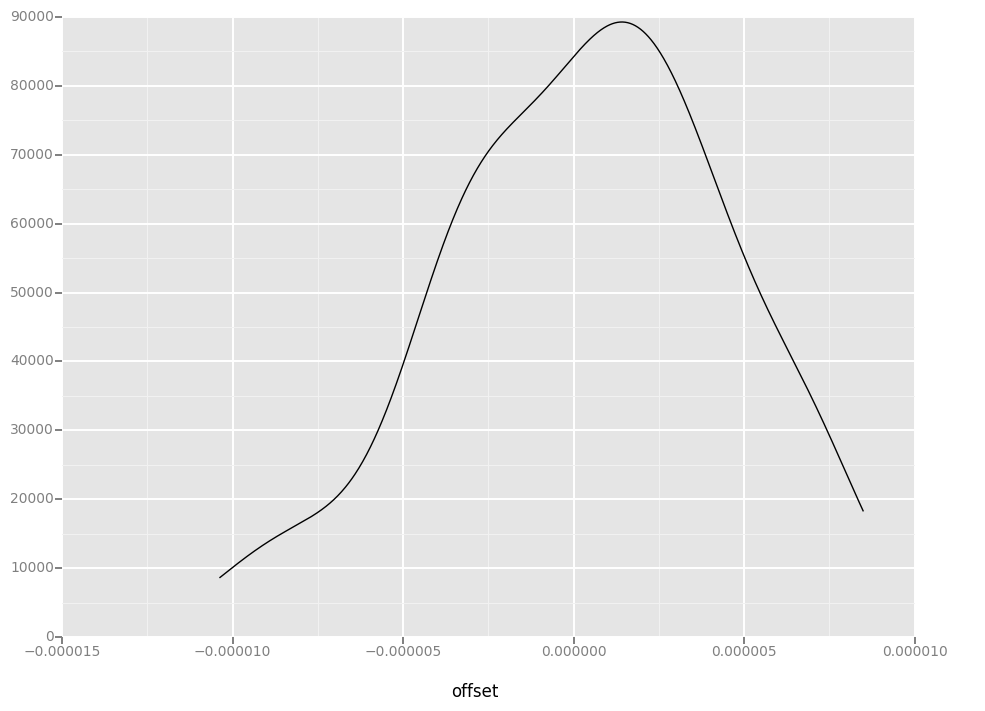

<ggplot: (307301865)>


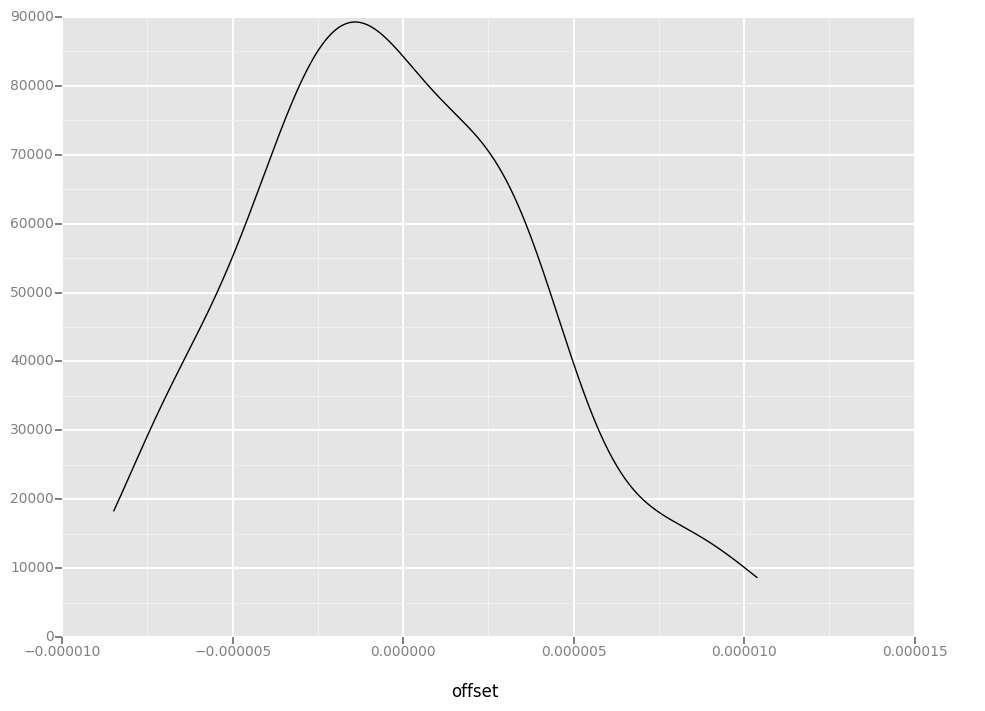

<ggplot: (307307409)>


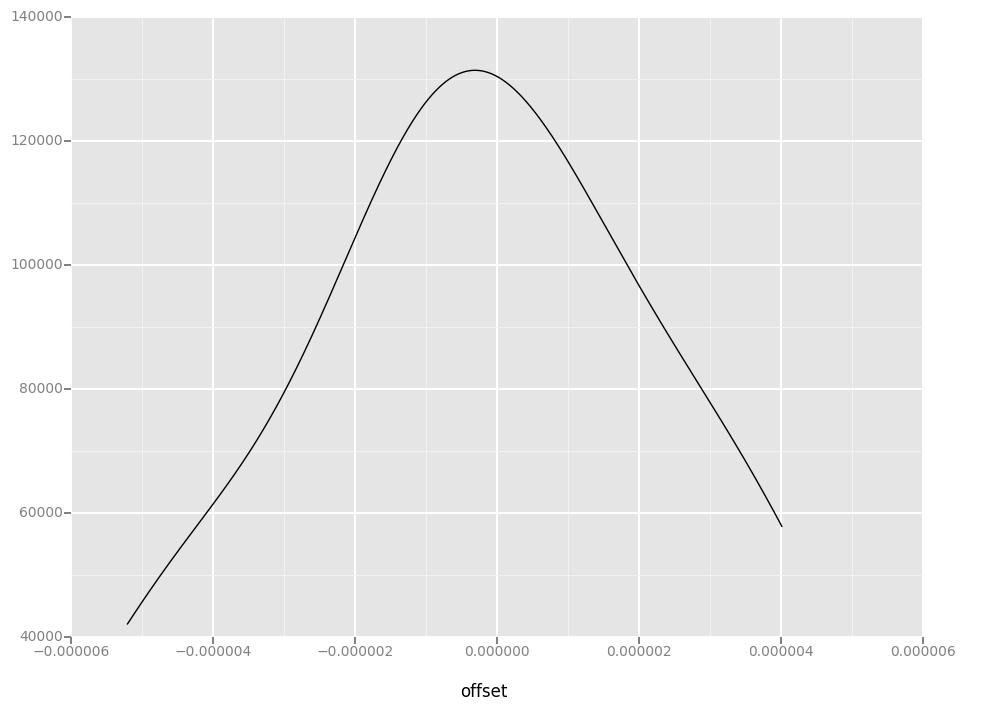

<ggplot: (309334105)>


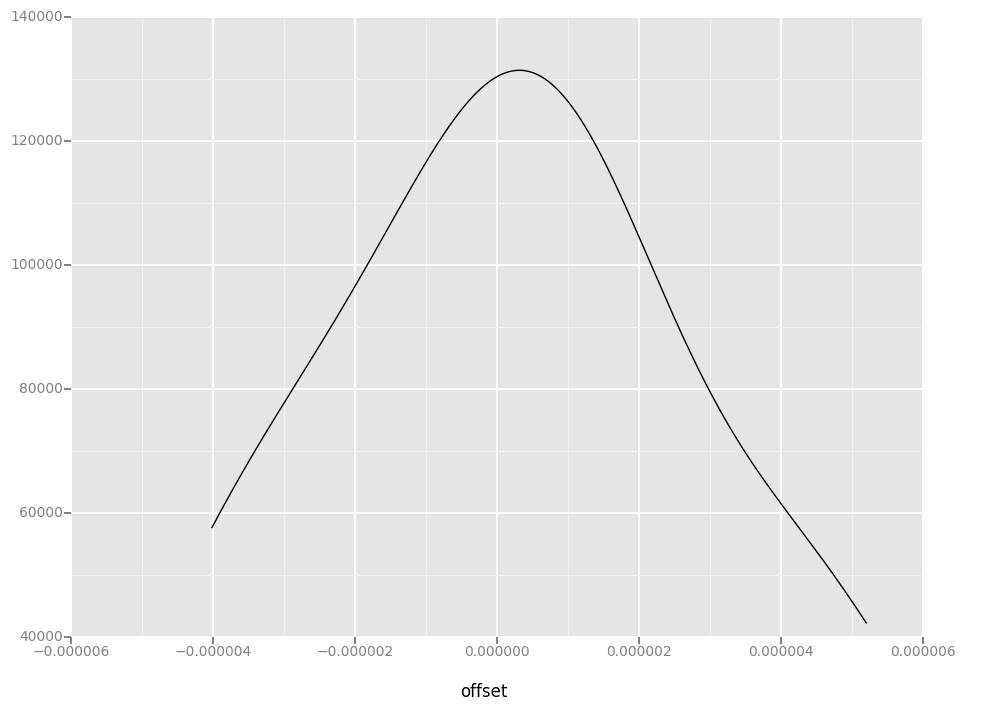

<ggplot: (313000405)>


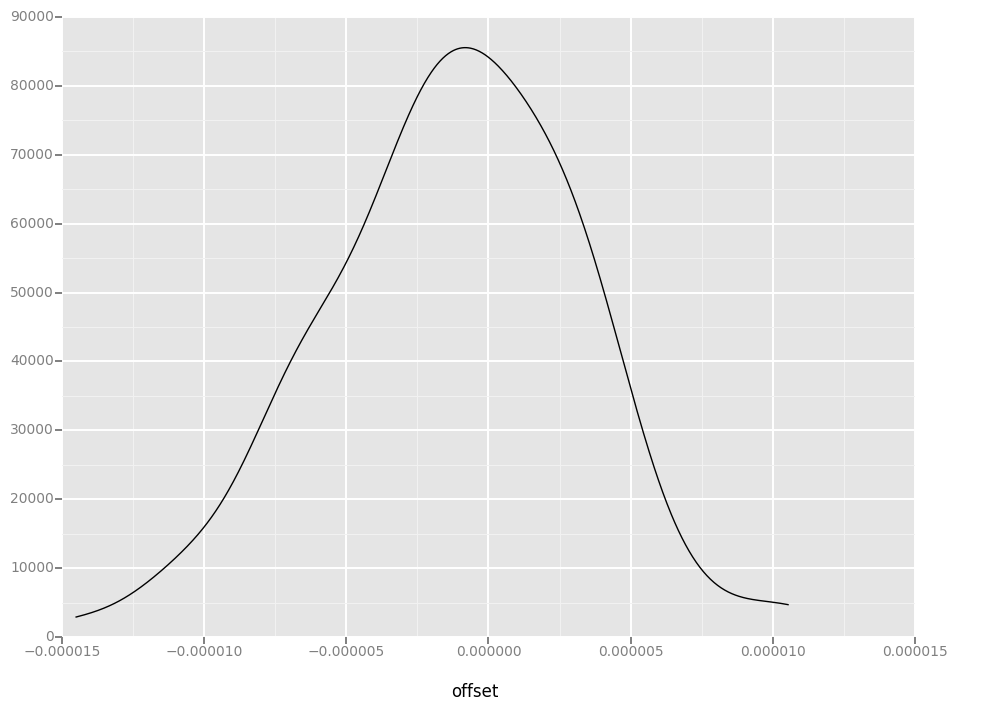

<ggplot: (308657009)>


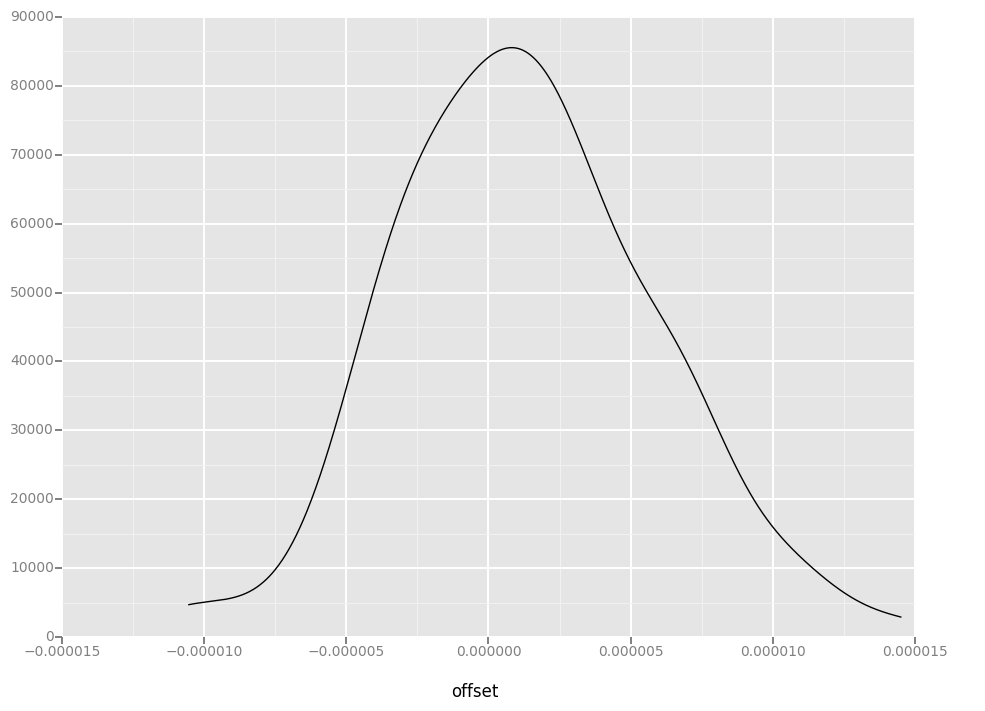

<ggplot: (310540121)>


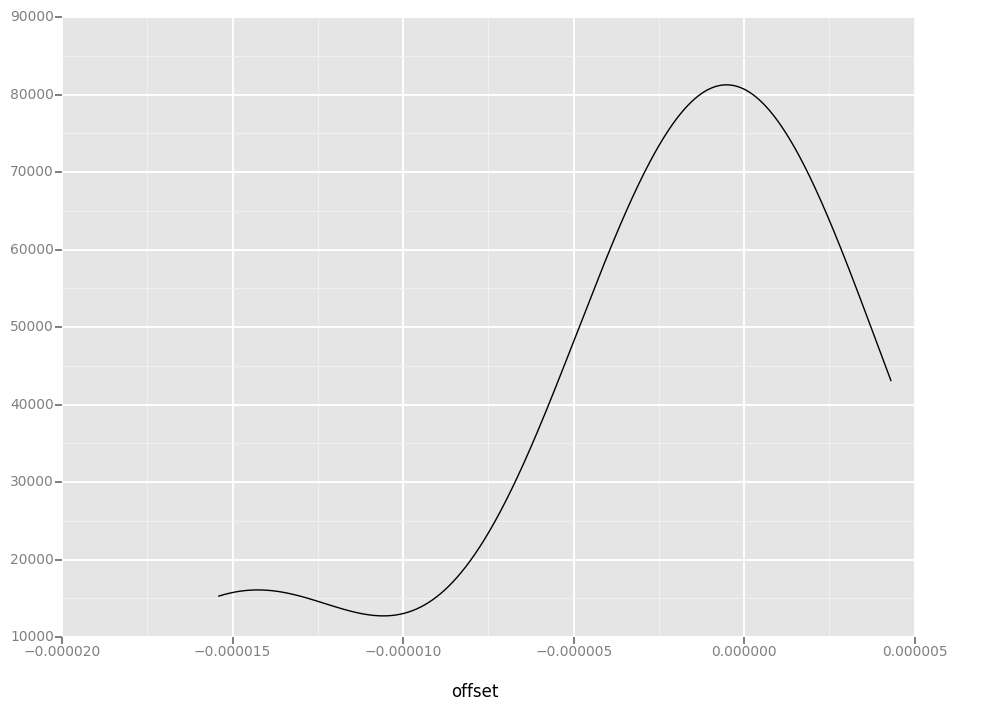

<ggplot: (307176029)>


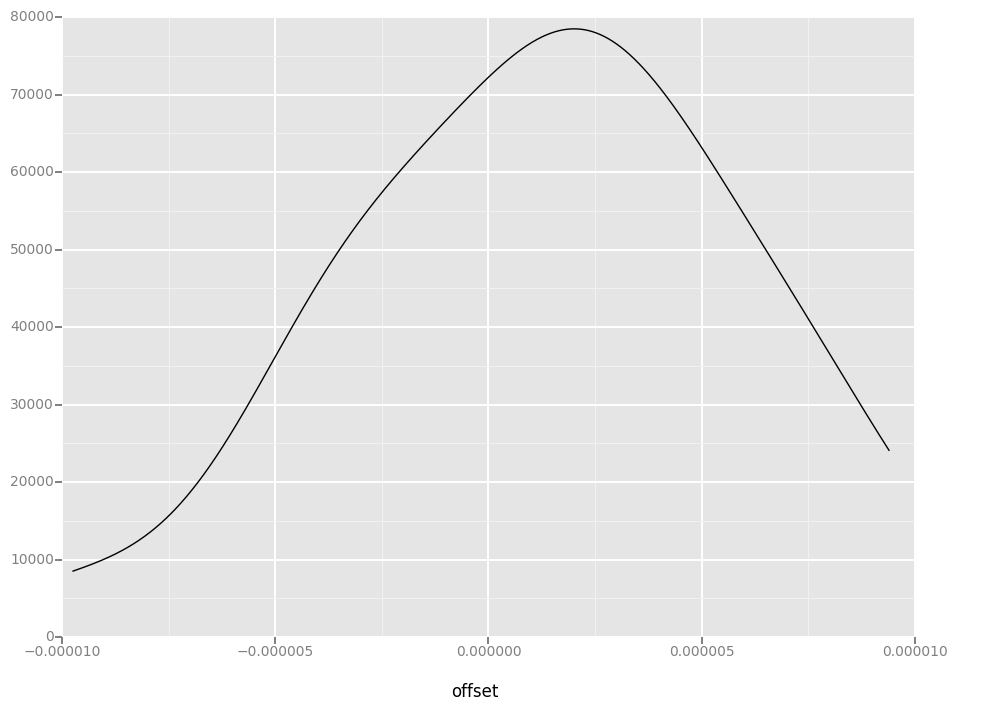

<ggplot: (307337961)>


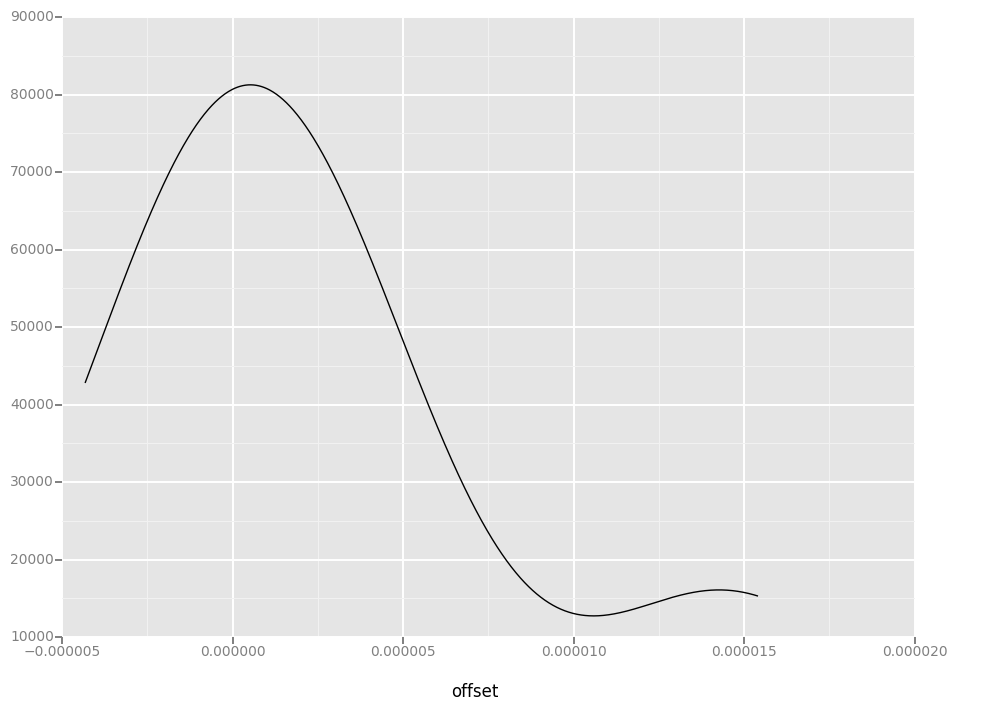

<ggplot: (307337977)>


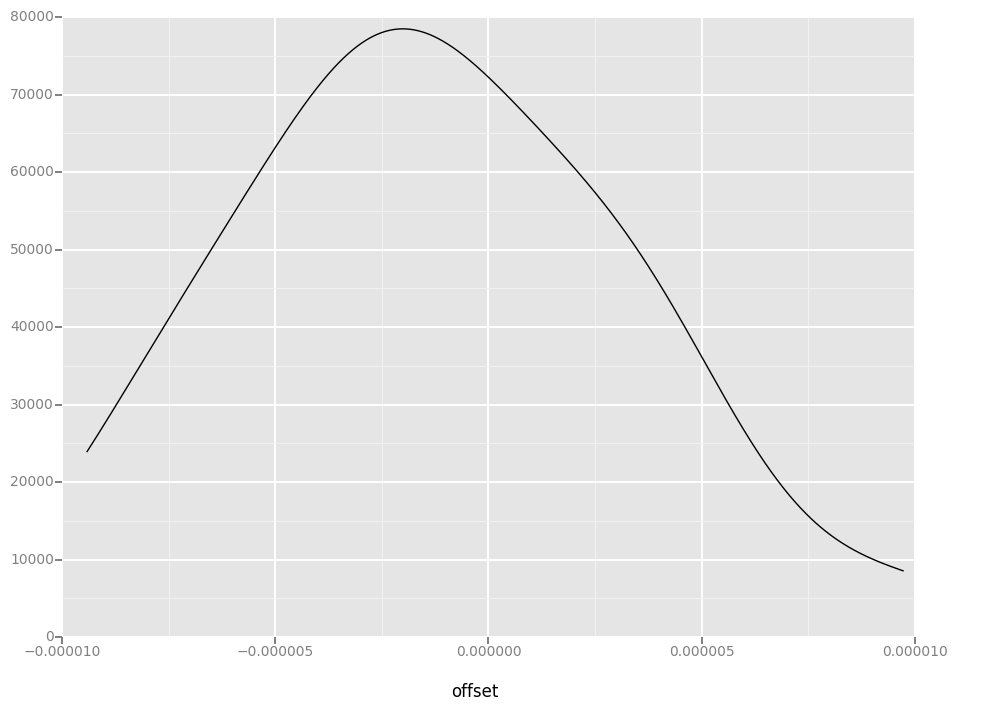

<ggplot: (315444213)>


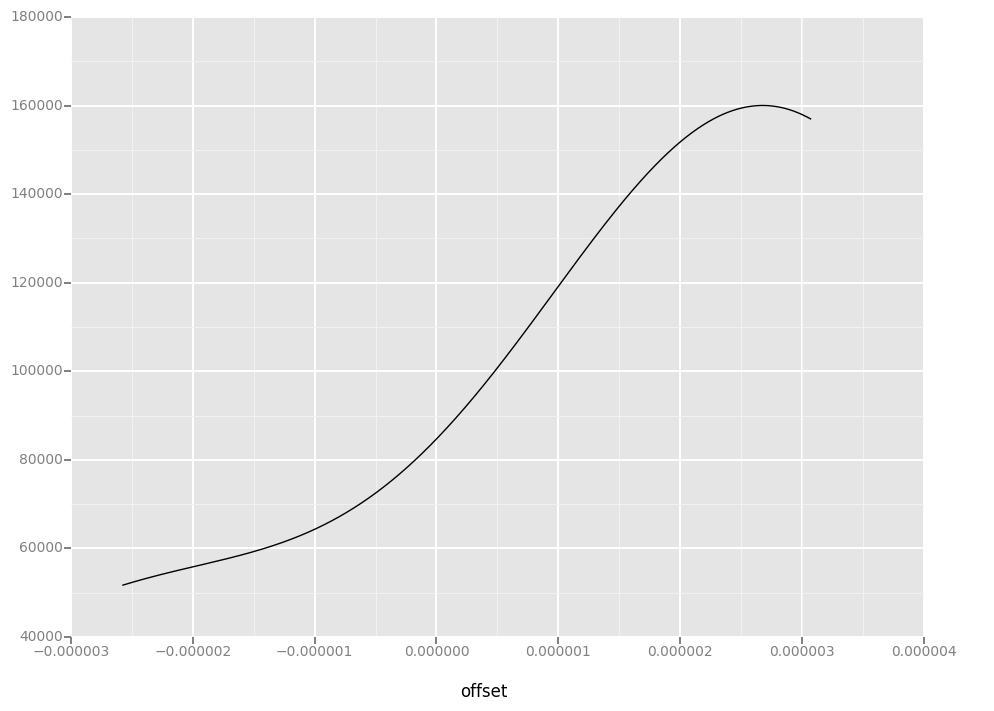

<ggplot: (307120921)>


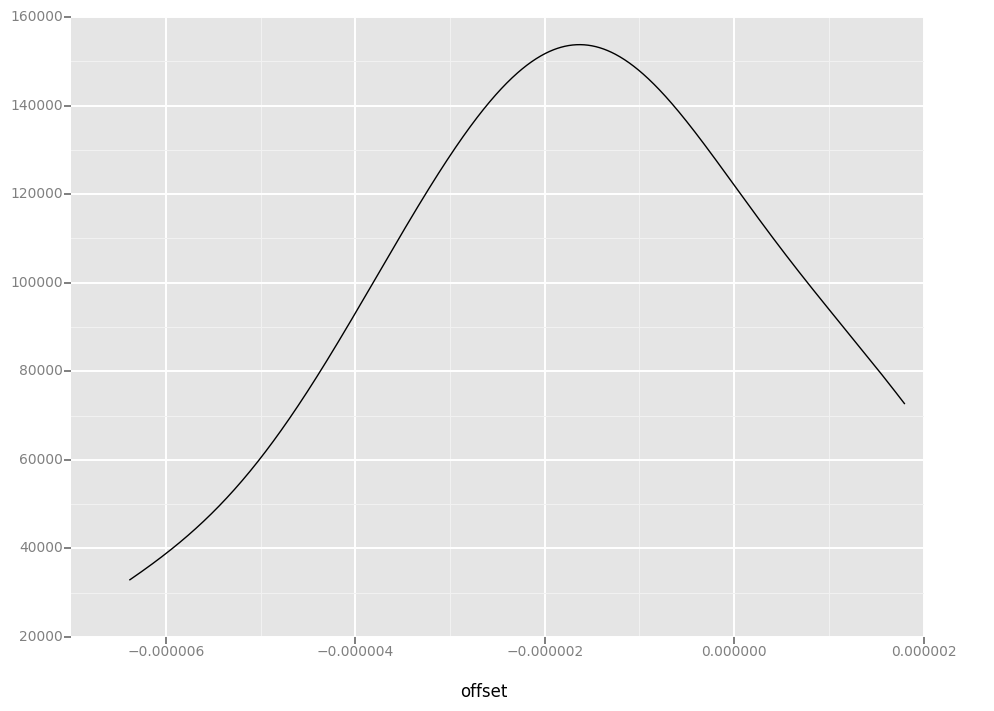

<ggplot: (307080749)>


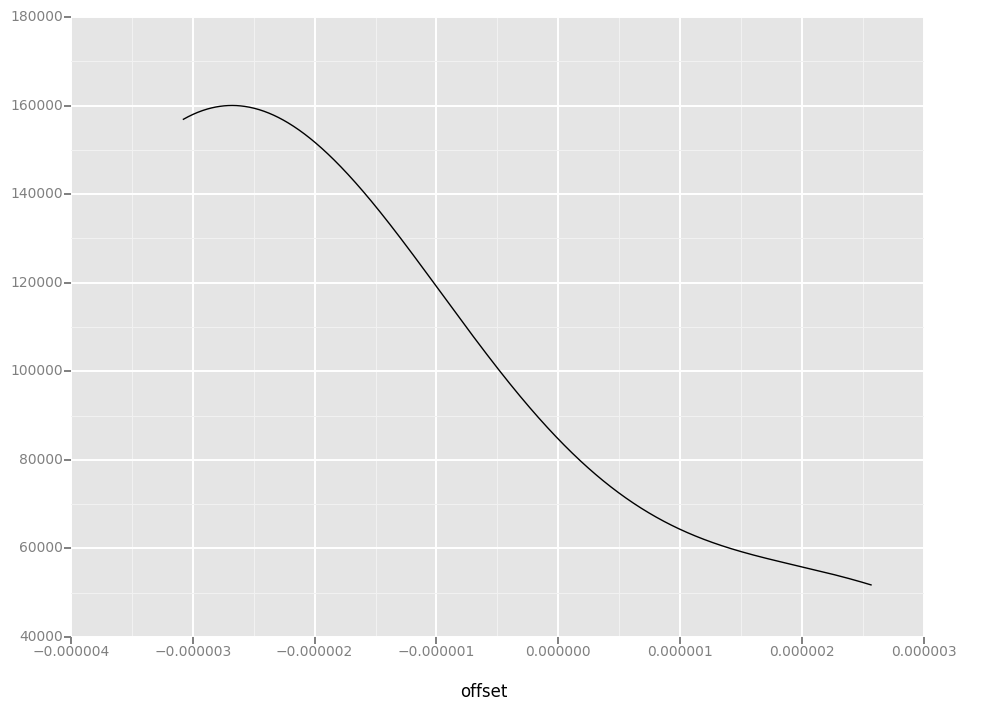

<ggplot: (307022245)>


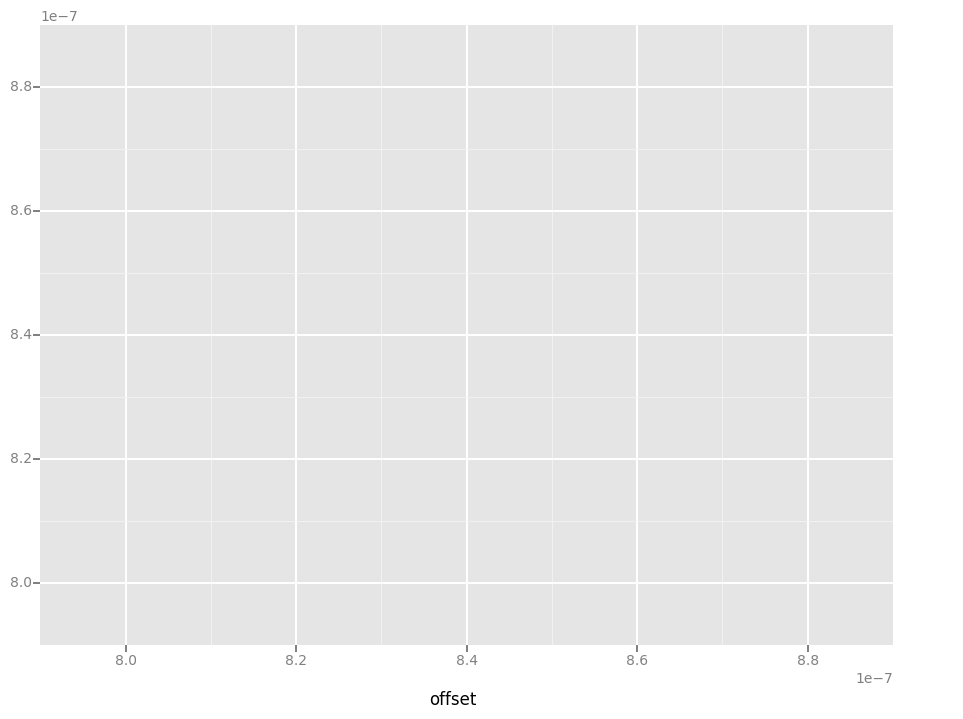

<ggplot: (309227753)>


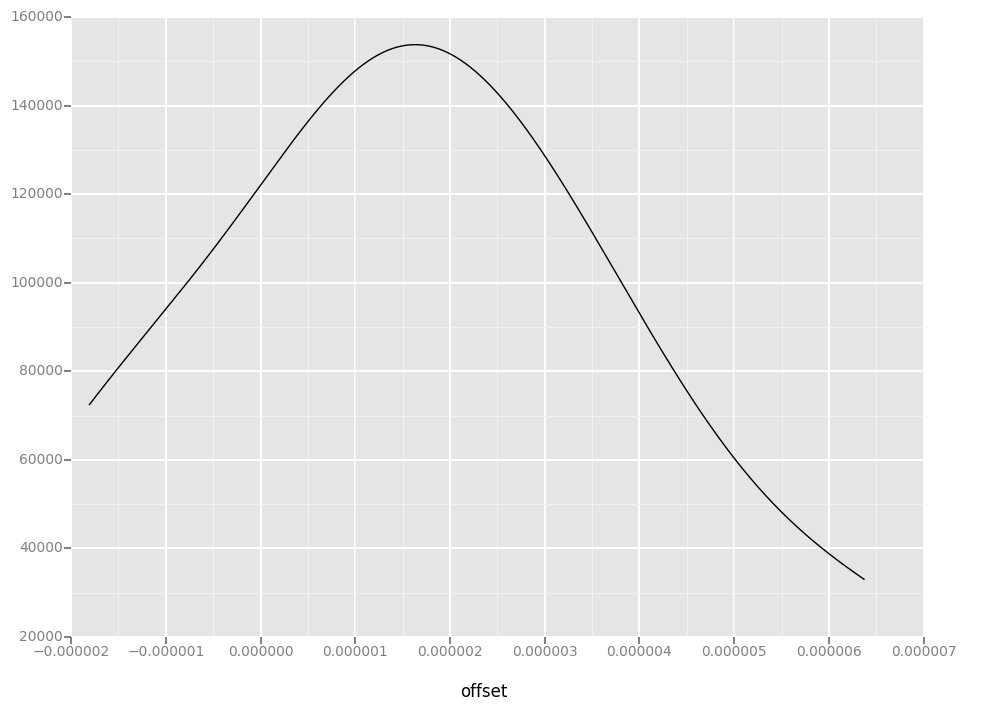

<ggplot: (306877693)>


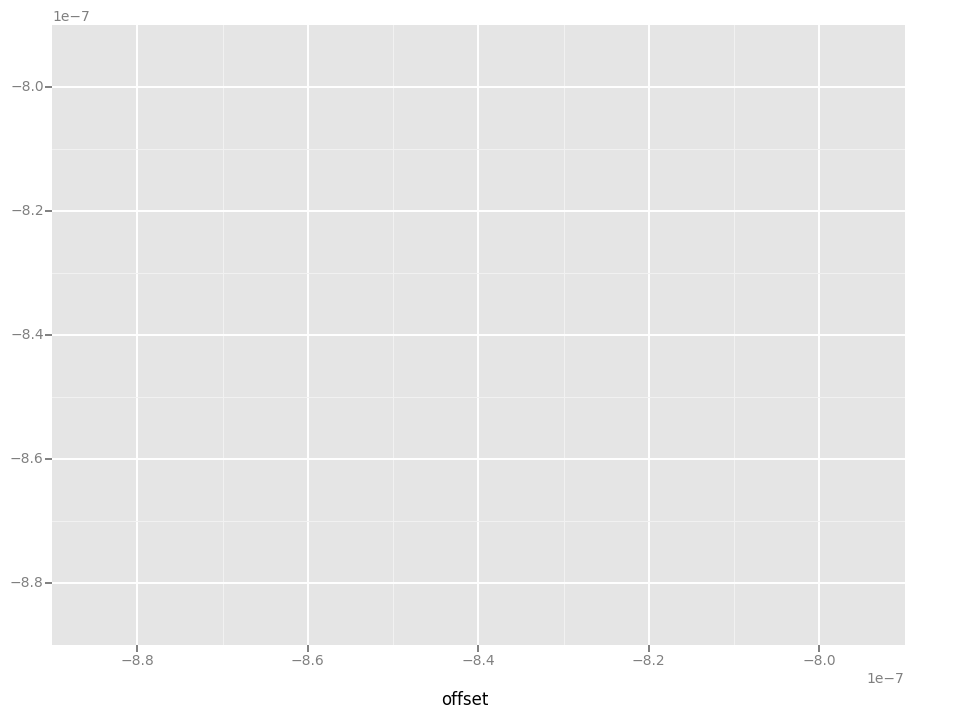

<ggplot: (306231745)>


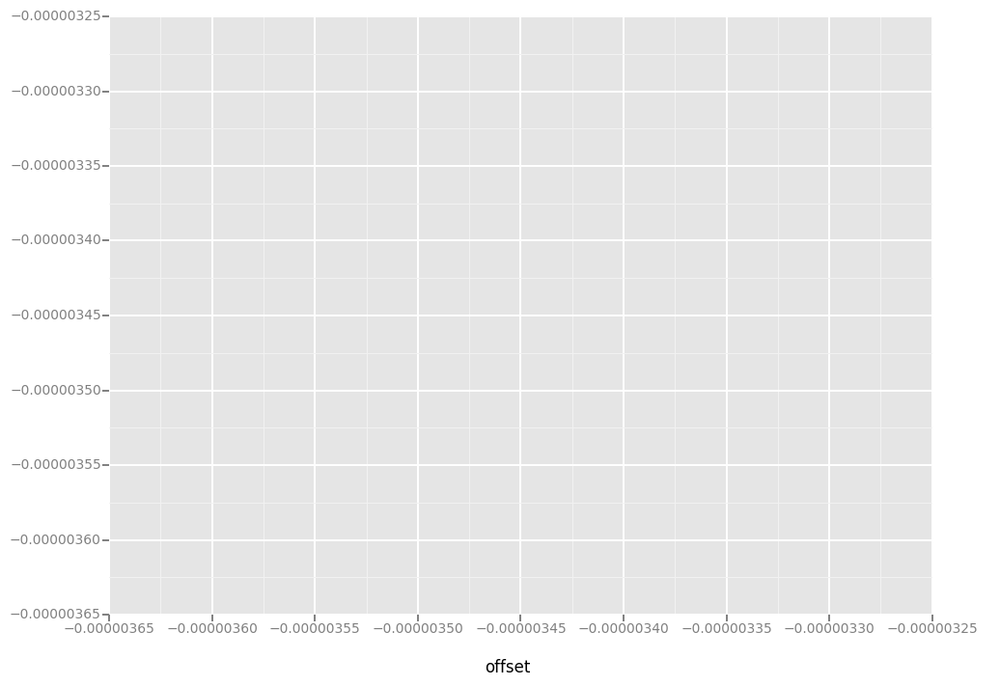

<ggplot: (296980293)>


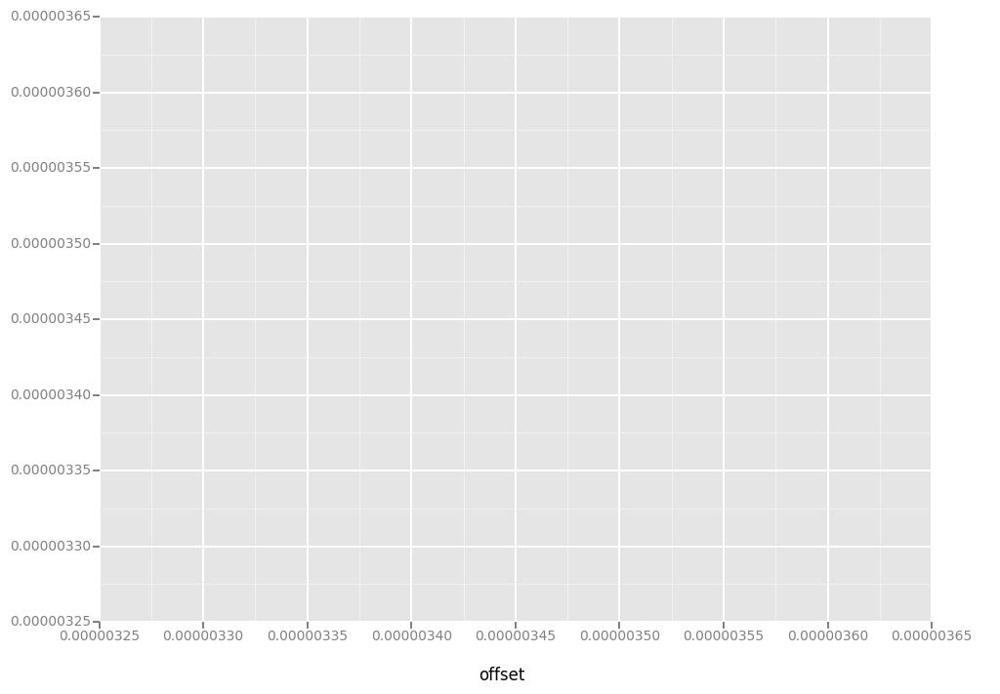

<ggplot: (308701273)>


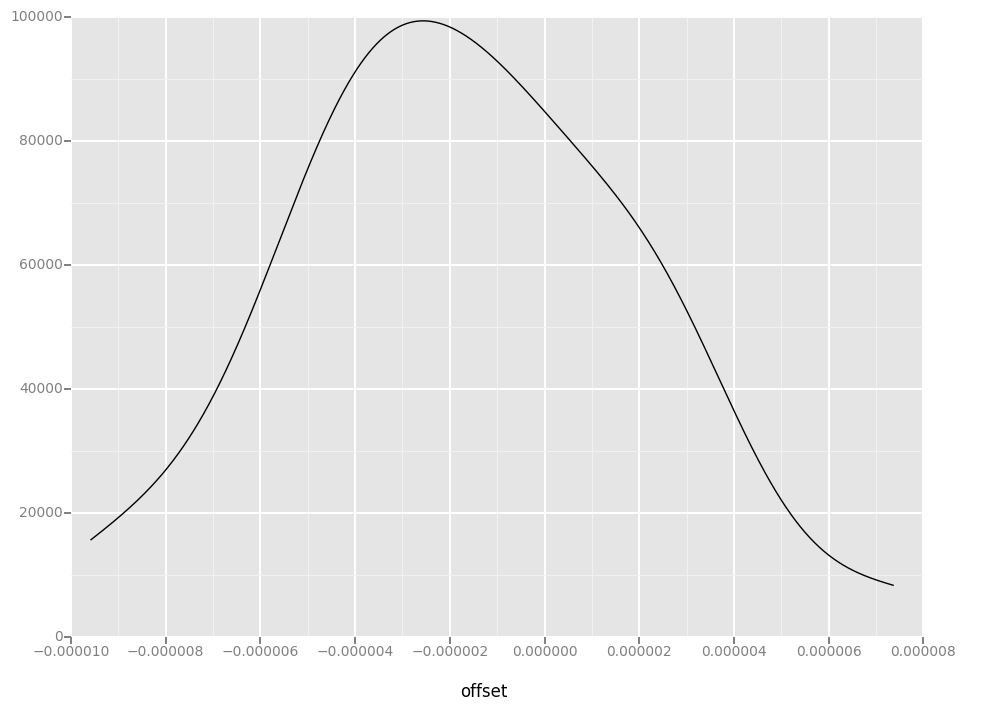

<ggplot: (306882221)>


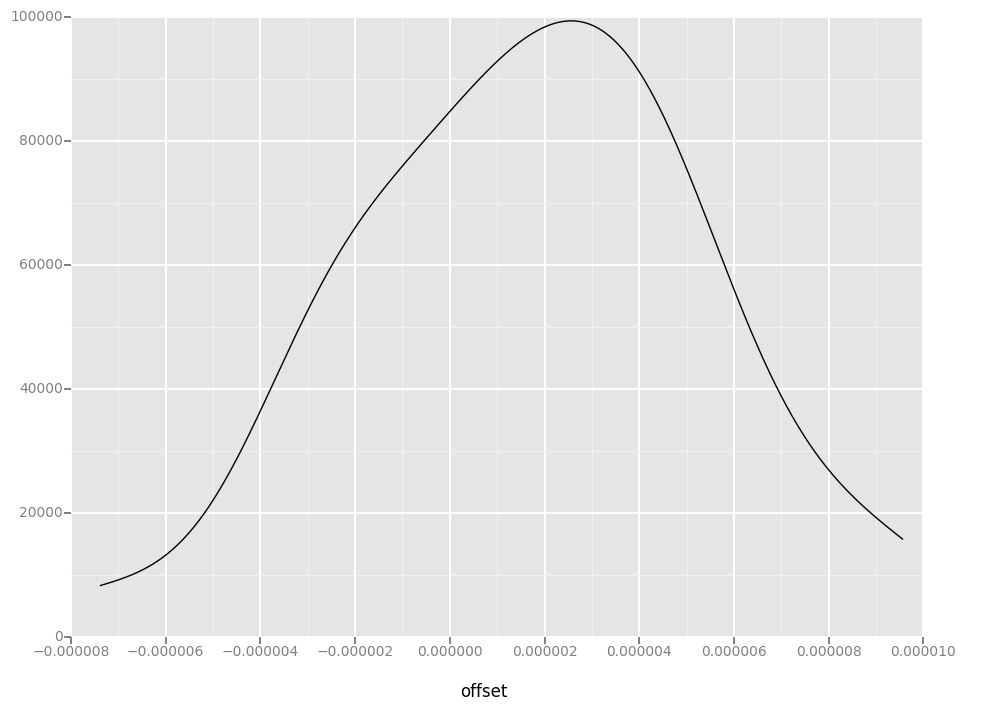

<ggplot: (306400713)>


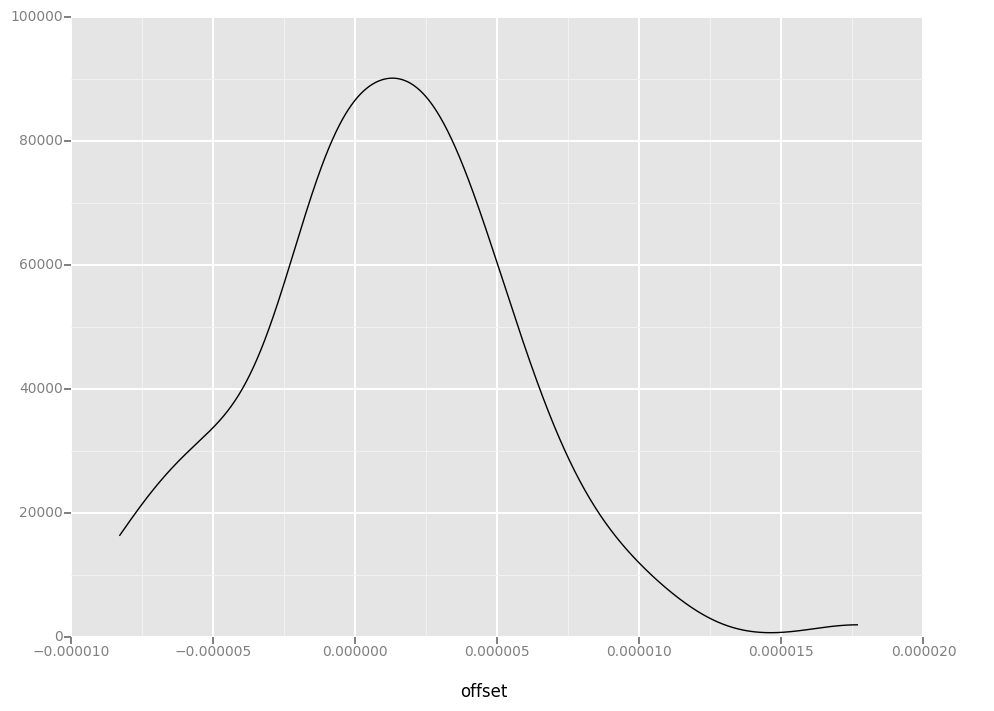

<ggplot: (306400757)>


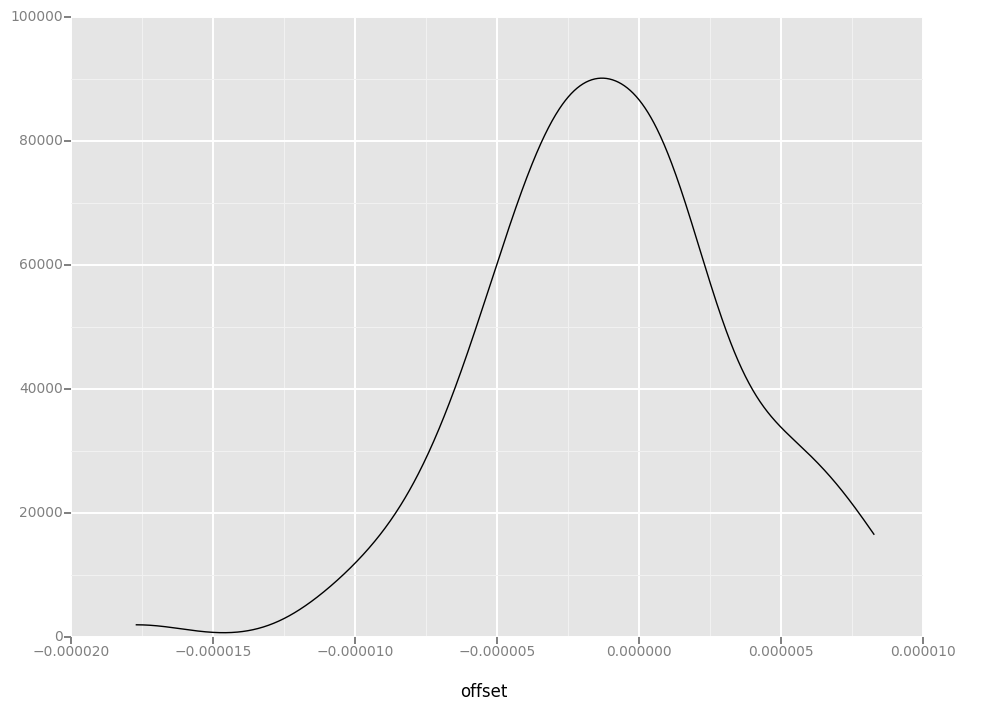

<ggplot: (306209805)>


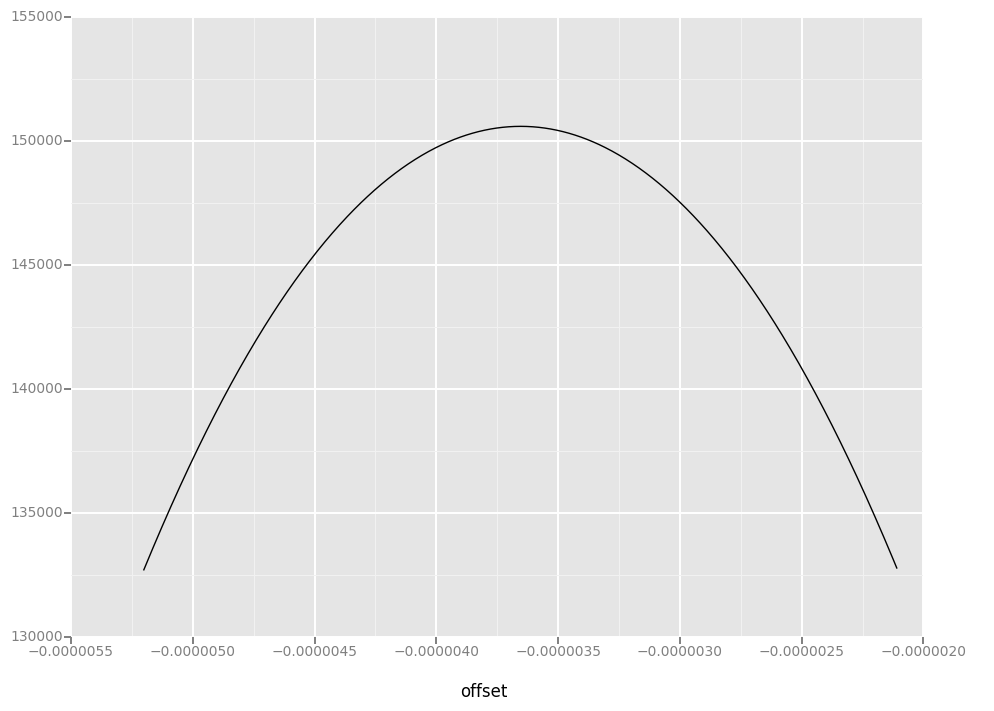

<ggplot: (307790965)>


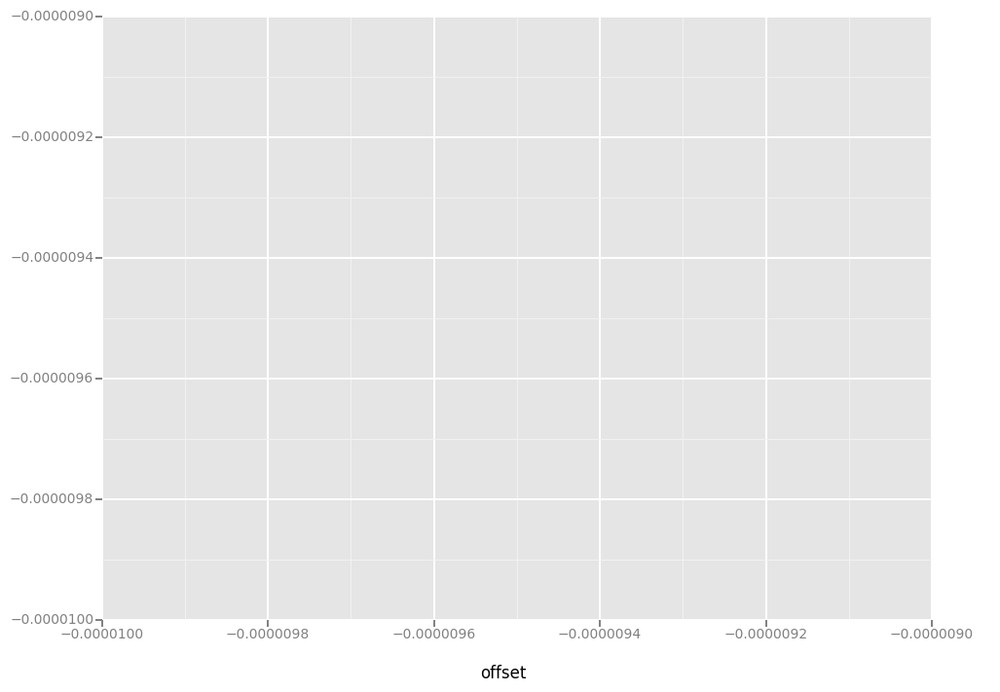

<ggplot: (307790857)>


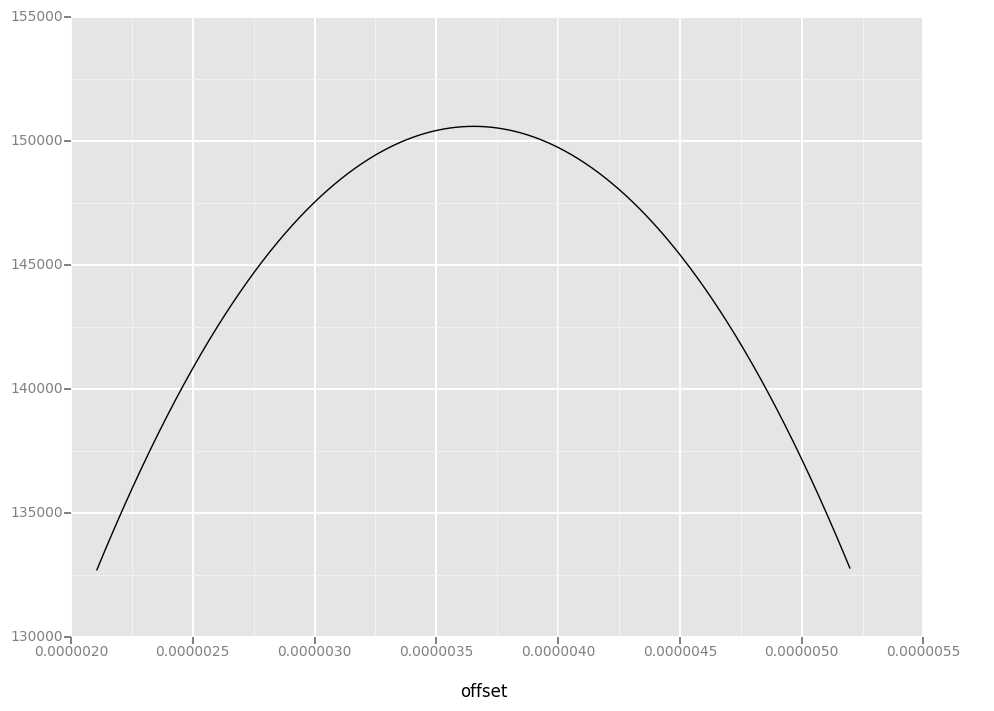

<ggplot: (296991397)>


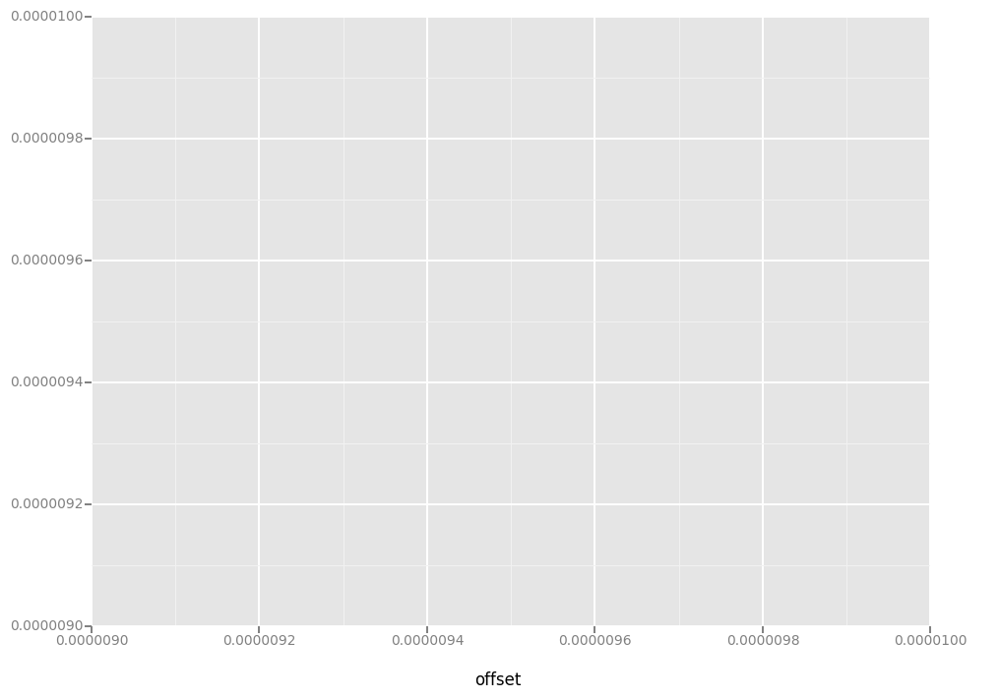

<ggplot: (309585441)>


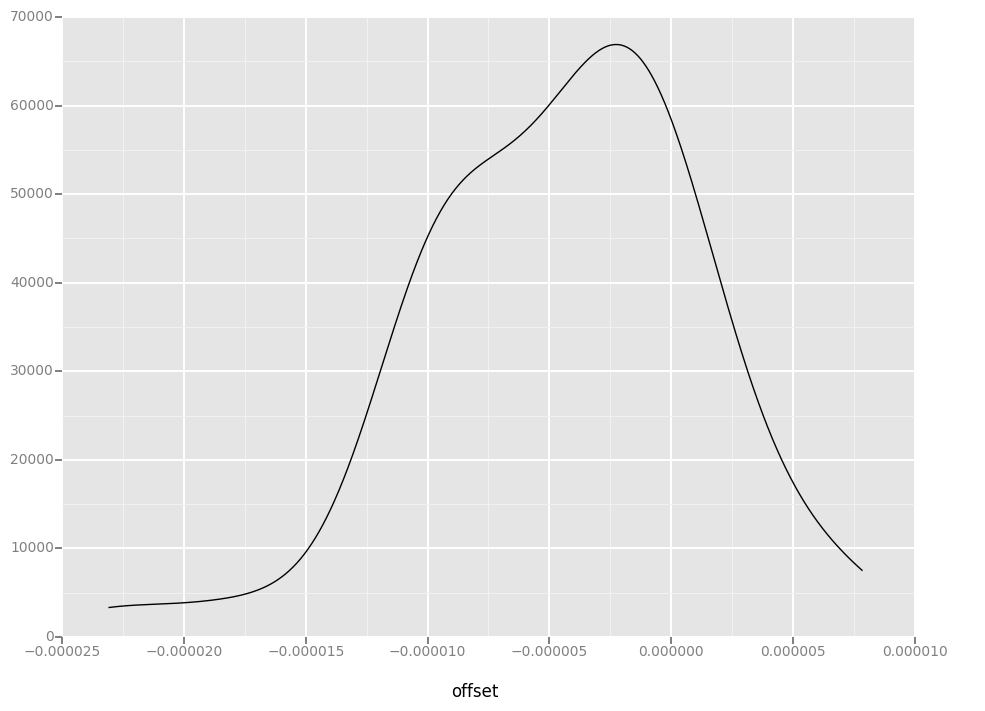

<ggplot: (309585541)>


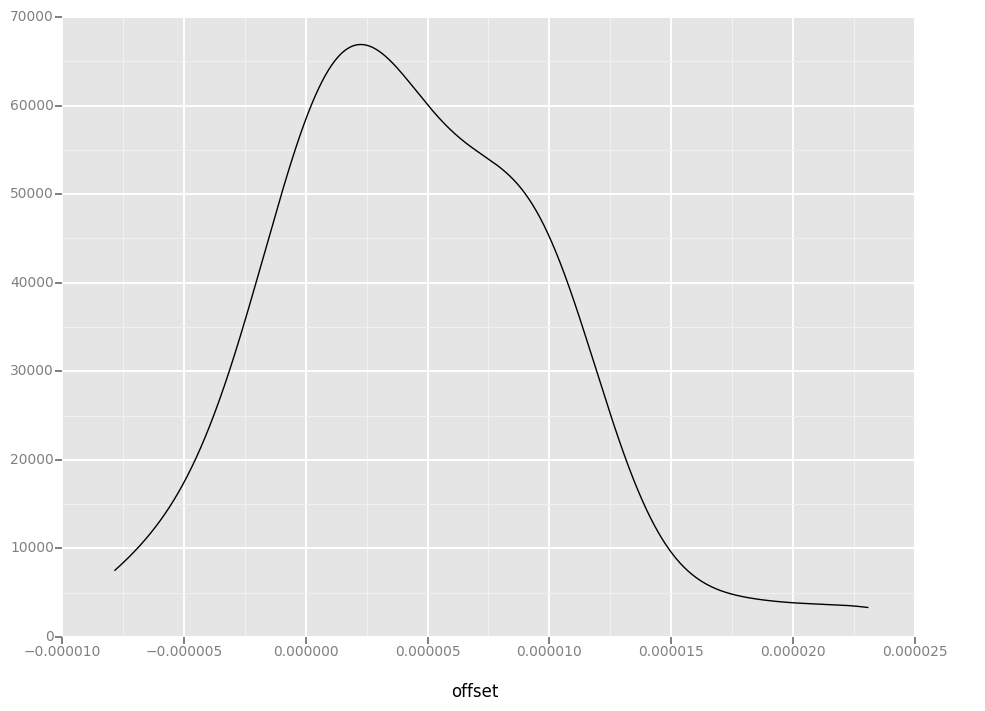

<ggplot: (305880041)>


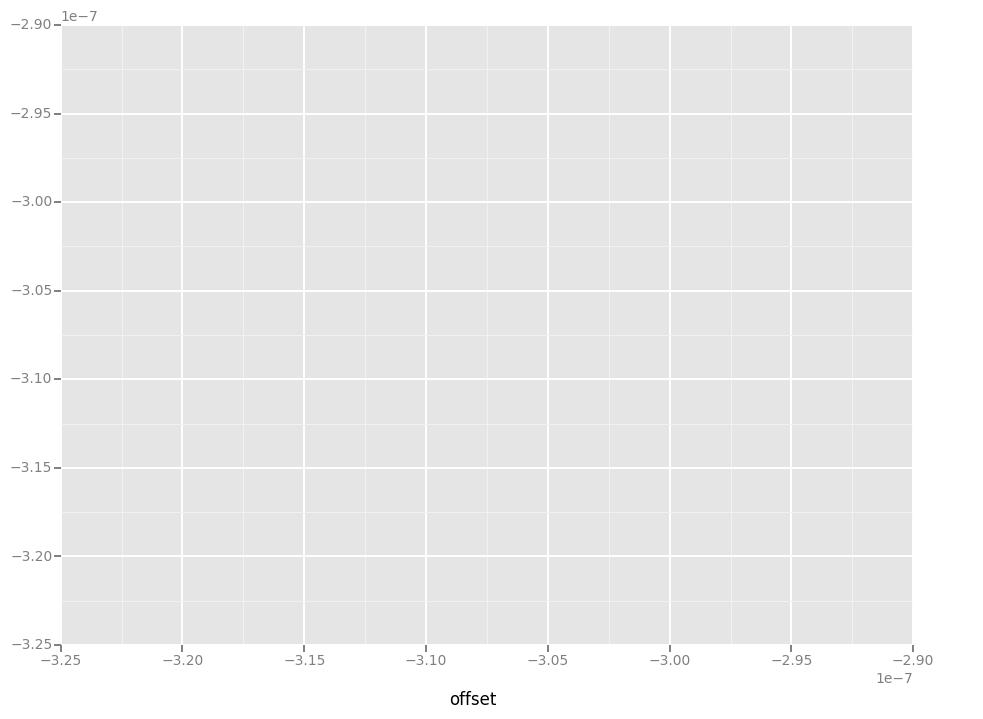

<ggplot: (307646001)>


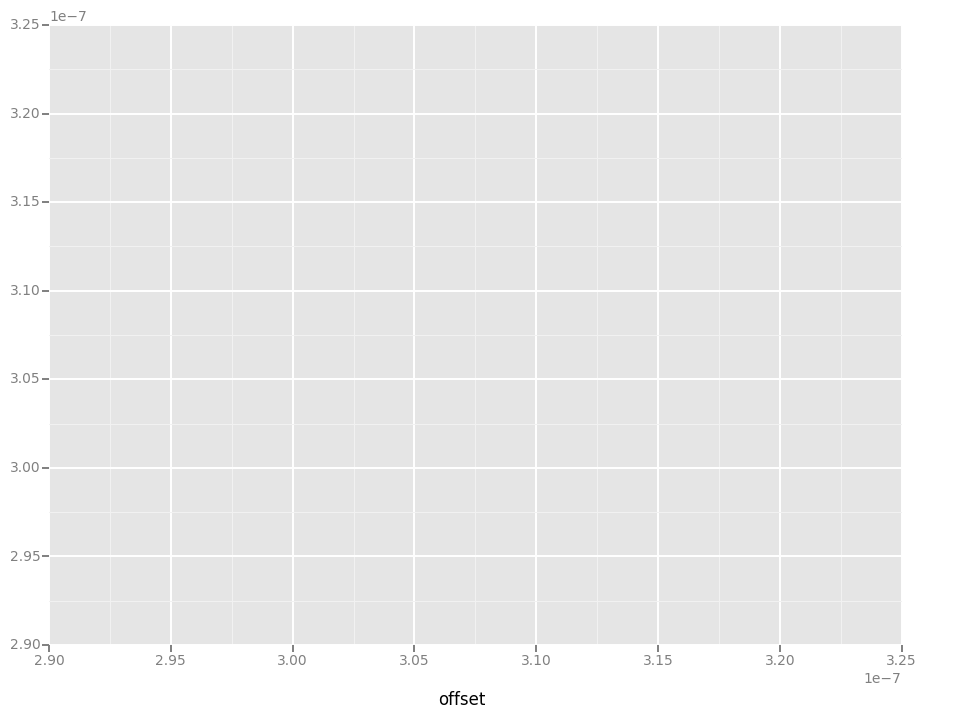

<ggplot: (301166221)>


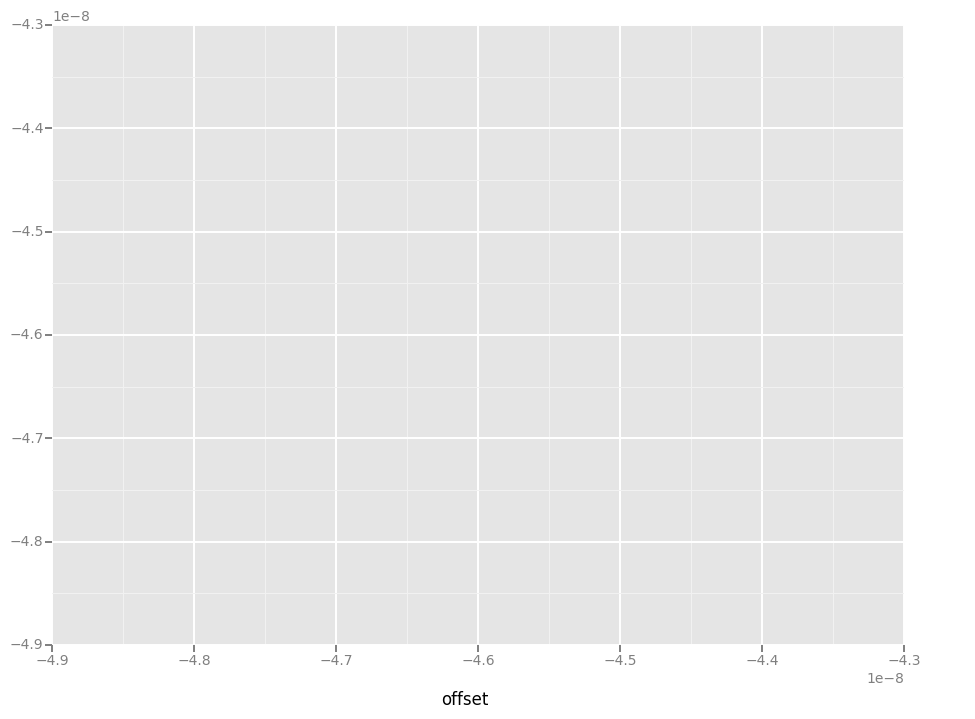

<ggplot: (306356017)>


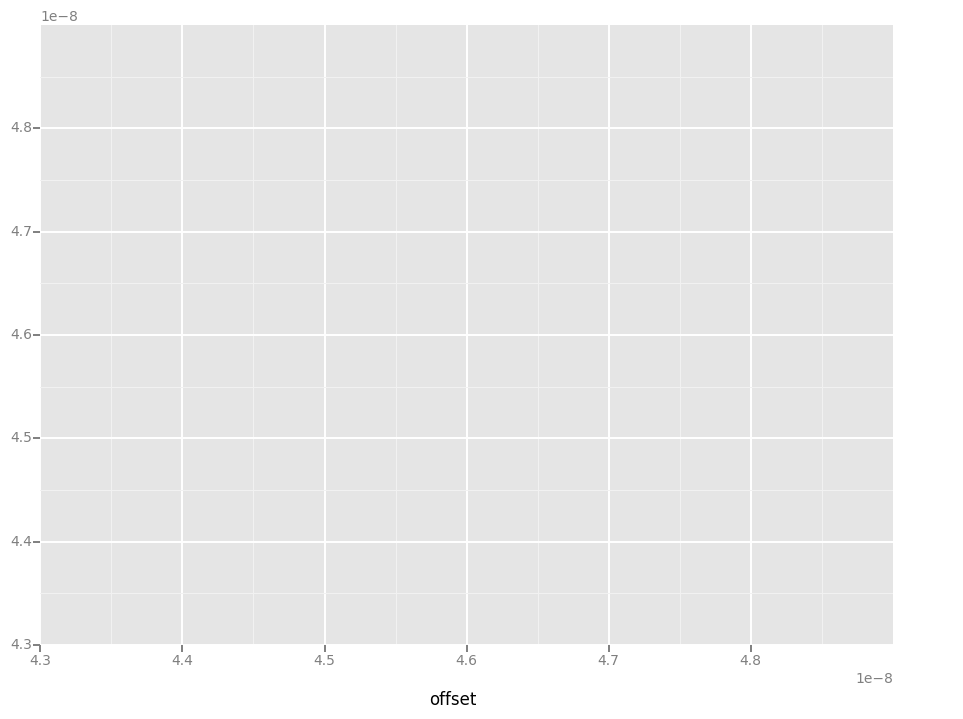

<ggplot: (306133689)>


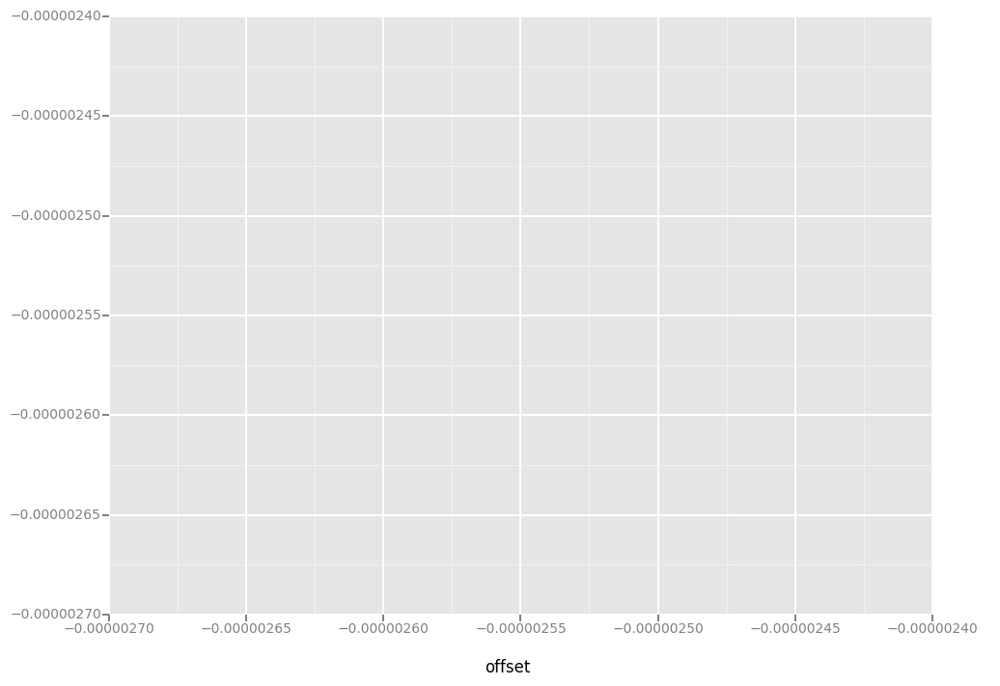

<ggplot: (311503541)>


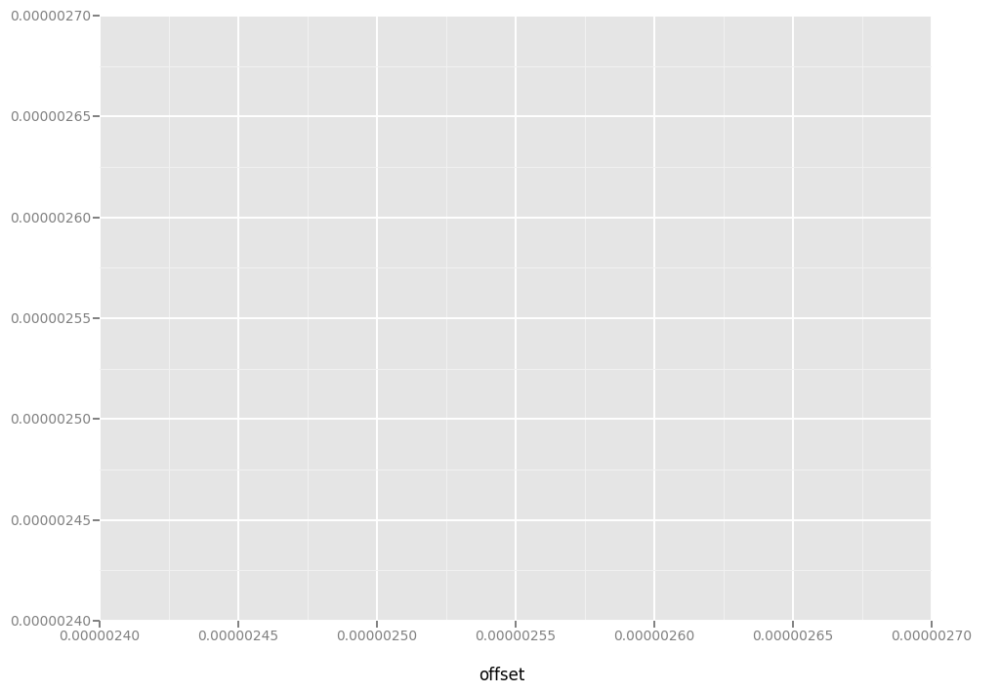

<ggplot: (311503545)>


In [590]:
d = pd.DataFrame(pairslist)
d = d[(d['offset'] < 0.05) & (d['offset'] > -0.05)]

g = ggplot(aes(x='offset', color='addr'), data=d) + stat_density()
print g

for addr in d['addr'].unique():
    d2 = d[ d['addr'] == addr ]
    g = ggplot(aes(x='offset'), data=d2) + stat_density()
    print g


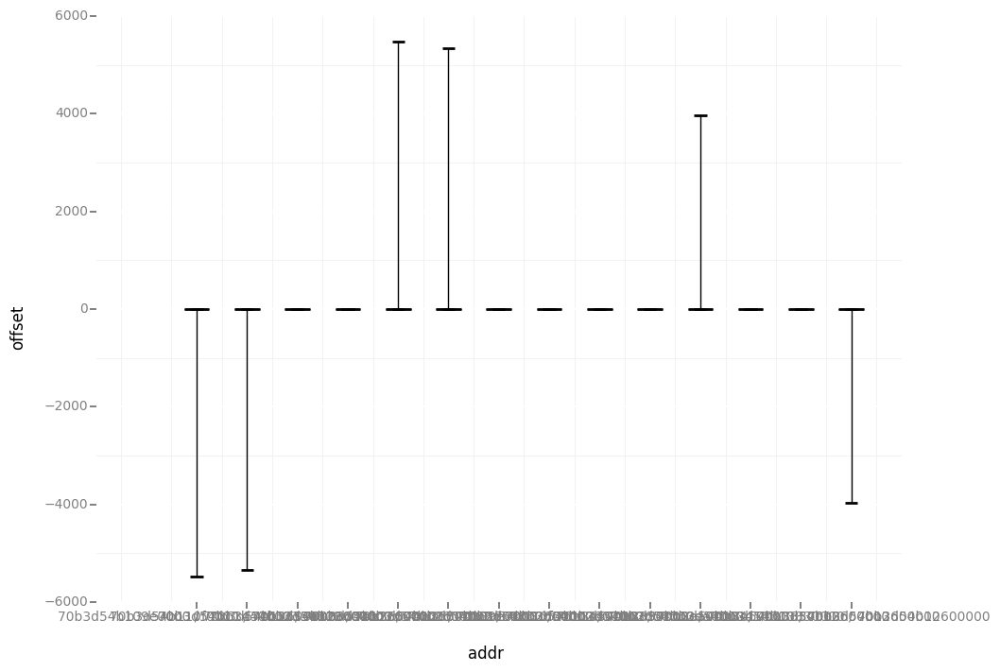

<ggplot: (276450209)>


In [46]:
d = pd.DataFrame(pairslist)
d2 = d[ (d['addr1'] == '70b3d54b12600000') | (d['addr2'] == '70b3d54b12600000') ]
#d2 = d2[d2['addr2'] != '70b3d54b12600000']
#d2 = d2[d2['addr1'] != '70b3d54b110f0000']
#d2 = d2[d2['addr2'] != '70b3d54b110f0000']
#d2 = d2[d2['addr1'] != '70b3d54b13830000']
#d2 = d2[d2['addr2'] != '70b3d54b13830000']
p = ggplot(aes(x='addr', y='offset'), data=d2) #color='Gateway'
g = p + geom_boxplot(outliers=False, notch=True) + theme_bw()
print g

In [47]:
def reject_outliers(data, m = 2.):
    if len(data) < 2:
        return data
    data2 = np.array(data)
    d = np.abs(data2 - np.median(data2))
    mdev = np.median(d)
    s = d/mdev if mdev else 0.
    return data2[s<m]

In [325]:
def calculate_offsets(m=1.):
    offsets = {}
    for a,aval in pairs.iteritems():
        offsets[a] = {}
        for b,bval in aval.iteritems():
            offsets[a][b] = {}

            if len(bval) < 3:
                offsets[a][b]['mean'] = 0
                offsets[a][b]['std'] = 0   
            
            o = []
            for item in bval:
                o.append(item['offset'])
            o = reject_outliers(o, m=m)

            offsets[a][b]['mean'] = np.mean(o)
            offsets[a][b]['std'] = np.std(o)
    return offsets
            
            #total = 0
            #num = 0
            #for item in bval:
            #    if abs(item['offset']) < 1:
            #        total += item['offset']
            #        num += 1
            #mean = total/num
            #offsets[a][b]['mean'] = mean
            #
            #total = 0
            #num = 0
            #for item in bval:
            #    if abs(item['offset']) < 1:
            #        total += (item['offset'] - mean)**2
            #        num +=1
            #std = math.sqrt(total/num)
            #offsets[a][b]['std'] = std

In [326]:
offsets = calculate_offsets(m=1.)

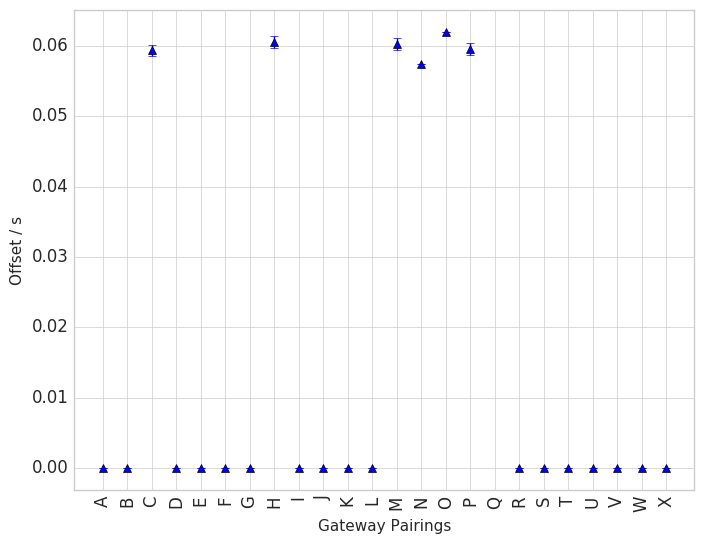

In [327]:
i=0
x=[]
xlab=[]
y=[]
err=[]
pairs2=[]
for a,aval in offsets.iteritems():
    for b, bval in aval.iteritems():
        if (a,b) not in pairs2 and (b,a) not in pairs2: #and abs(bval['mean'])<0.05:
            xlab.append(chr(i+ord('A')))
            x.append(i)
            y.append(abs(bval['mean']))
            err.append(bval['std'])
            pairs2.append((a,b))
            i+=1

with plt.style.context('seaborn-whitegrid'):
    plt.xticks(x, xlab, rotation='vertical')
    plt.margins(0.05)
    plt.errorbar(x, y, yerr=err, linestyle='None', marker='^')
    plt.xlabel('Gateway Pairings', fontsize=11)
    plt.ylabel('Offset / s', fontsize=11)

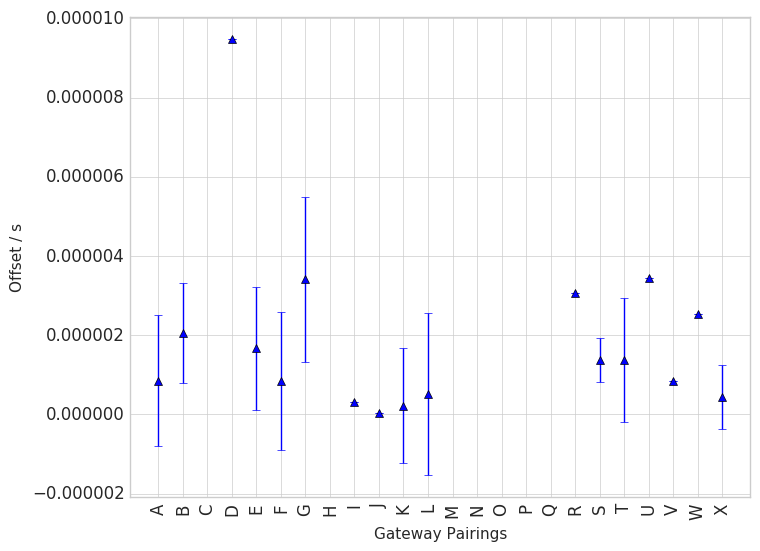

In [328]:
i=0
x=[]
xlab=[]
y=[]
err=[]
pairs2=[]
for a,aval in offsets.iteritems():
    for b, bval in aval.iteritems():
        if (a,b) not in pairs2 and (b,a) not in pairs2:
            xlab.append(chr(i+ord('A')))
            if abs(bval['mean'])<0.05:
                x.append(i)
                y.append(abs(bval['mean']))
                err.append(bval['std'])
            pairs2.append((a,b))
            i+=1
with plt.style.context('seaborn-whitegrid'):
    plt.xticks(range(i), xlab, rotation='vertical')
    plt.margins(0.05)
    plt.errorbar(x, y, yerr=err, linestyle='None', marker='^')
    plt.xlabel('Gateway Pairings', fontsize=11)
    plt.ylabel('Offset / s', fontsize=11)

In [329]:
def TDOAs_2D_Offsets(gateways, offsets):
    tmp = []
    for gw in gateways:
        x,y = convert_bng(gw['lon'], gw['lat'])
        tmp.append({
                'x': x[0],
                'y': y[0],
                'time': gw['time'],
                'addr': gw['addr']
            })
    
    #D = scipy.array(tmp)
    #D = D[D[:,2].argsort()]
    #D = D[-3:,:]
    
    ready = False
    i=0
    while(not ready):
        
        D = pd.DataFrame(tmp)
        D = D.sort_values('time')
        D = D.iloc[i:]
        
        if len(D) < 3:
            return False
        
        t = D.iloc[0]['time'].copy()

        D['time'] -= t
        for addr in D['addr']:
            if addr == D.iloc[0]['addr']: continue
            offset = offsets[addr][D.iloc[0]['addr']]['mean']
            D.ix[D['addr']==addr, 'time'] += offset

        ready = True
        j = 0
        for time in D['time']:
            if time > 0.001: #or time < 0:
                ready = False
                j += 1
        #print D
        #print D[ (D['time'] < 1) & (D['time'] >= 0) ]
        
        i += 1


    D['distance'] = D['time']*C
    
    #D = D.sort_values('distance')
    D = D[['x','y','distance']]
    
    return scipy.matrix(D.values)

False
False
[[ 529248.695       182694.556            0.        ]
 [ 529666.501       182097.649         1471.67036947]
 [ 530036.901       182759.178         1655.28804409]]


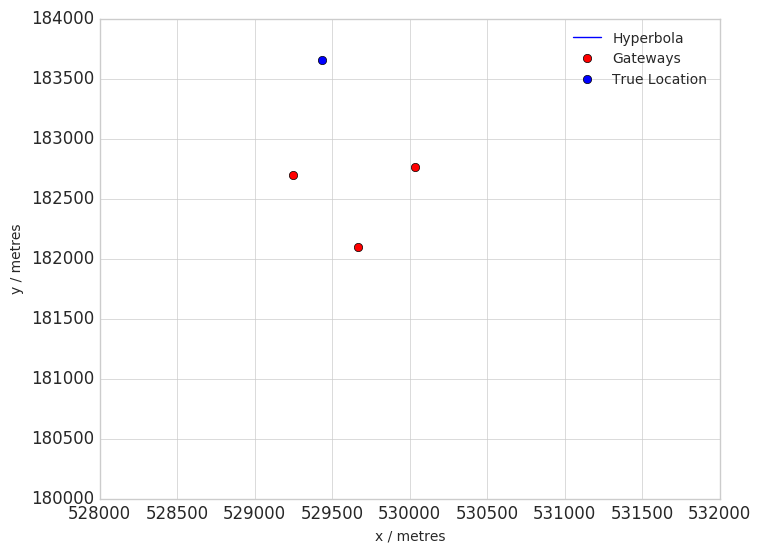

[[  5.29666472e+05   1.82098761e+05   0.00000000e+00]
 [  5.30037566e+05   1.82760308e+05   3.49649858e+01]
 [  5.29248001e+05   1.82694539e+05   3.86708019e+02]]


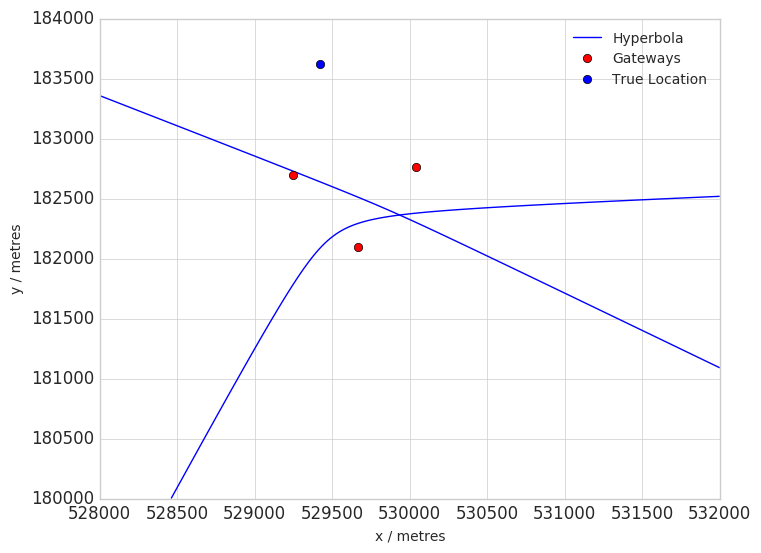

False
False
[[  5.30038259e+05   1.82760326e+05   0.00000000e+00]
 [  5.29246670e+05   1.82692279e+05  -1.54290115e+02]
 [  5.29214230e+05   1.81921443e+05   1.72483753e+03]]


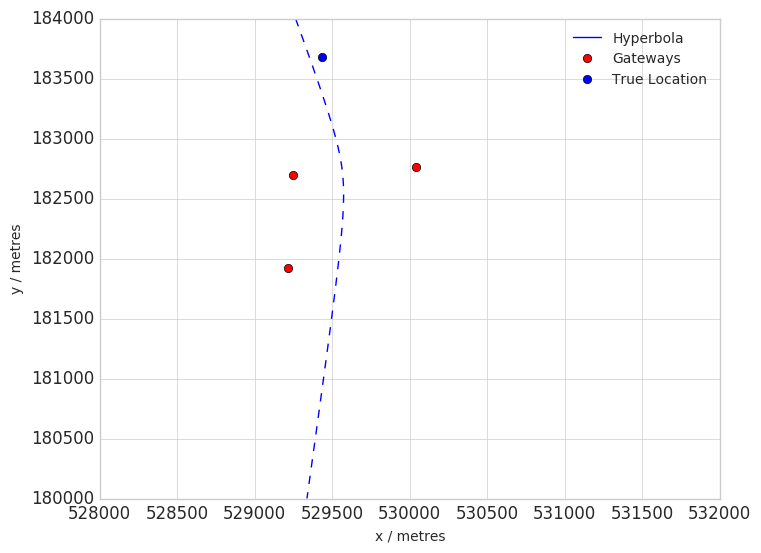

[[  5.29246670e+05   1.82692279e+05   0.00000000e+00]
 [  5.30037594e+05   1.82759196e+05   1.54290115e+02]
 [  5.29666501e+05   1.82097649e+05   8.28385543e+02]]


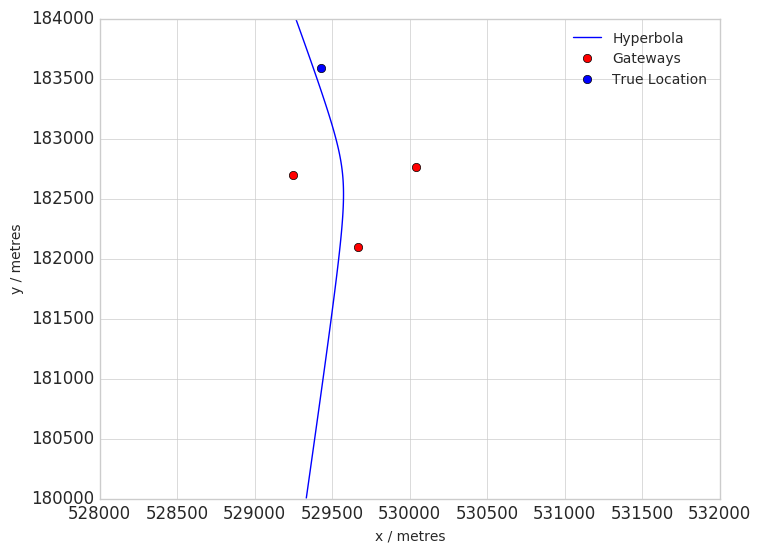

[[ 529246.67        182692.279            0.        ]
 [ 530037.594       182759.196          726.09884989]
 [ 529667.223       182096.555         1471.67036947]]


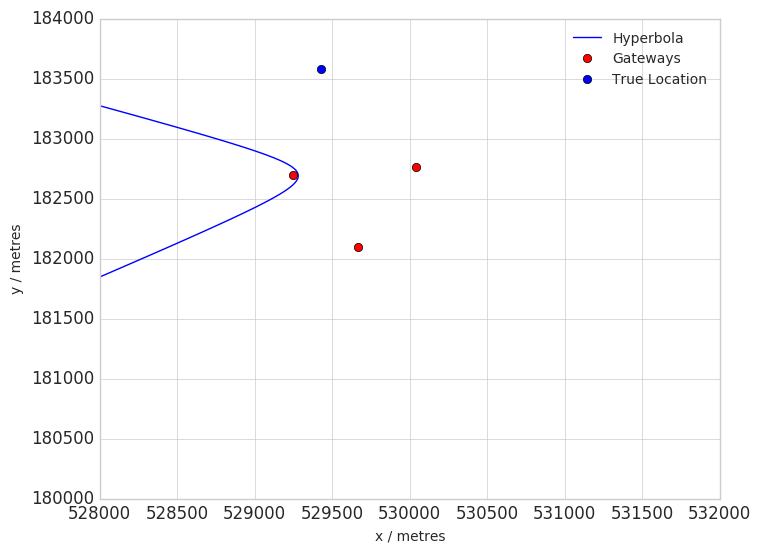

False
False
False
[[  5.30037651e+05   1.82756972e+05   0.00000000e+00]
 [  5.29247307e+05   1.82694521e+05  -1.54290115e+02]
 [  5.29204376e+05   1.81926756e+05   4.38267874e+02]]


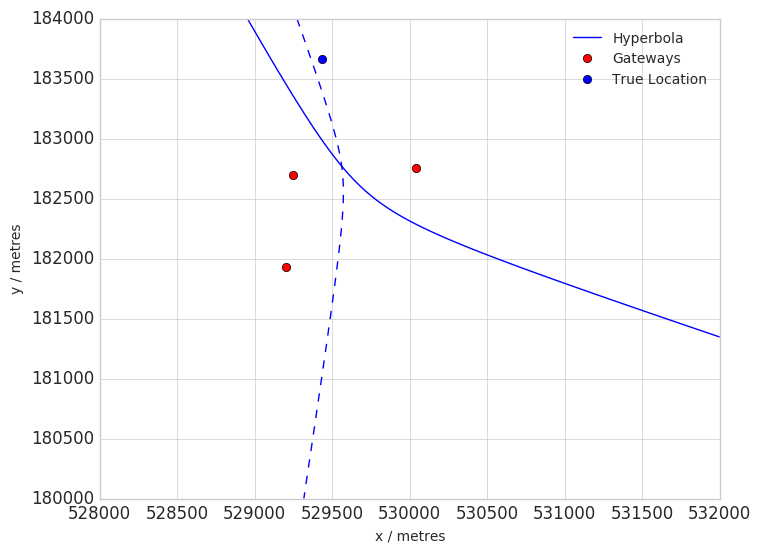

False
False
False
False
False
False
False
False
[[ 529665.057       182099.838            0.        ]
 [ 529252.743       182699.11           601.13629452]
 [ 530037.651       182756.972         1250.05854744]]


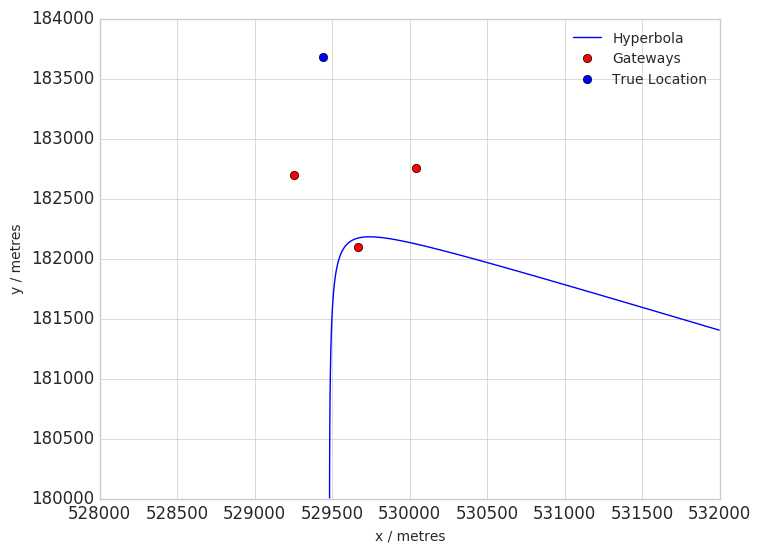

False
[[ 530037.651       182756.972            0.        ]
 [ 529252.743       182699.11          1989.99264086]
 [ 529665.057       182099.838         3252.93523985]]


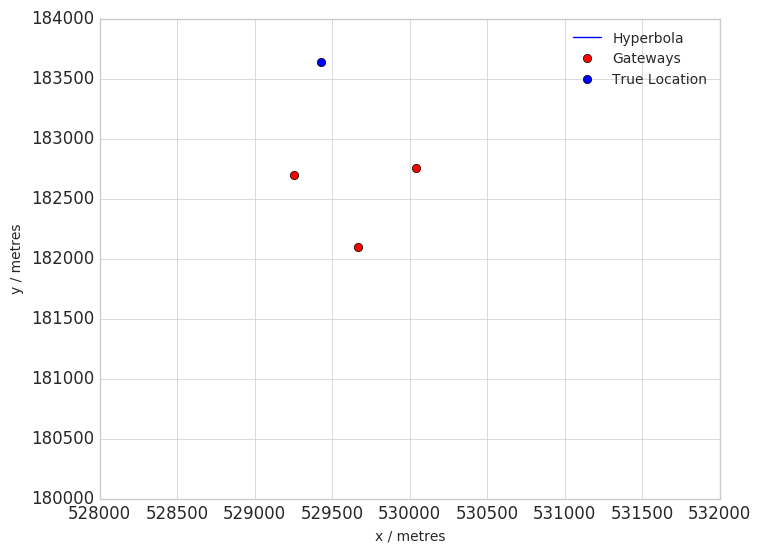

False
False
[[ 530037.651       182756.972            0.        ]
 [ 529252.05        182699.093          703.42298734]
 [ 529664.391       182098.708         2037.8416782 ]]


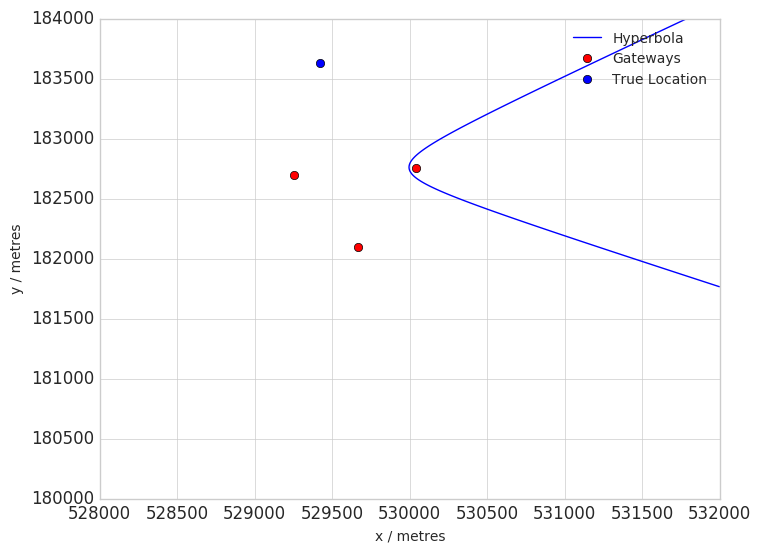

[[ 530038.345       182756.99             0.        ]
 [ 529664.391       182098.708         2037.8416782 ]
 [ 529252.05        182699.093         1632.61218155]]


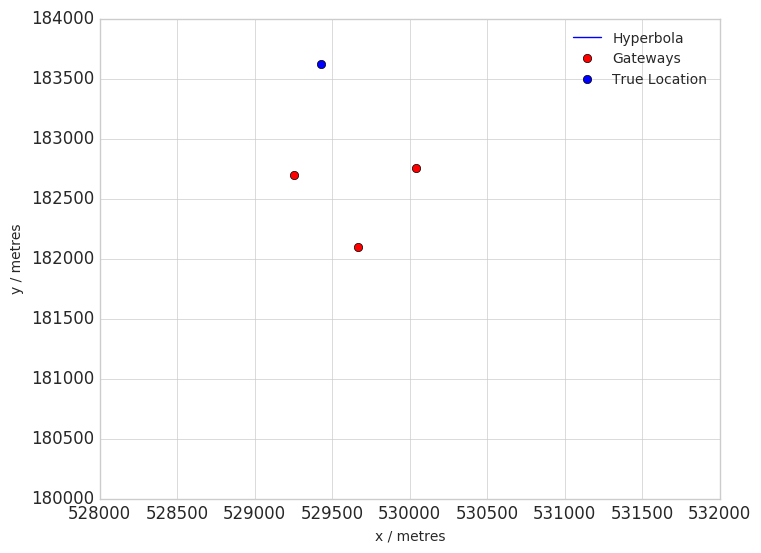

False
False
False
[[  5.29668610e+05   1.82096590e+05   0.00000000e+00]
 [  5.30037794e+05   1.82751412e+05   1.06441078e+02]
 [  5.29252050e+05   1.82699093e+05   2.45951468e+03]]


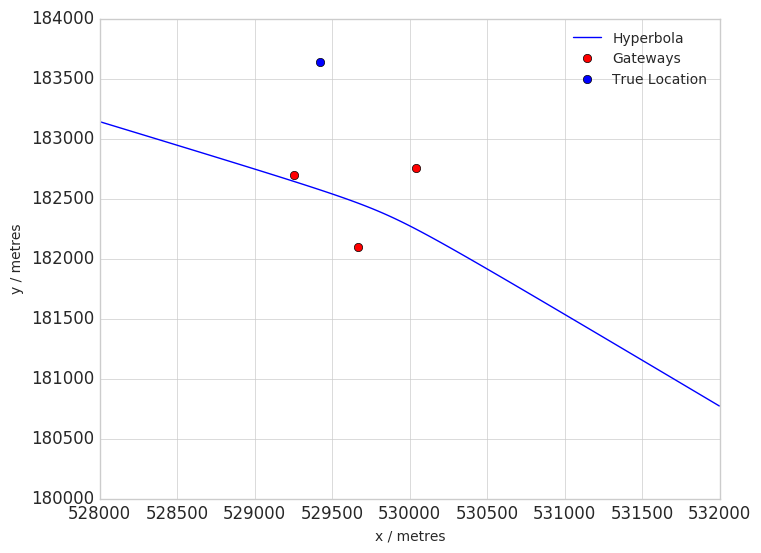

[[ 529668.639       182095.478            0.        ]
 [ 530038.459       182752.542          964.15417999]
 [ 529251.384       182697.963          958.51675383]]


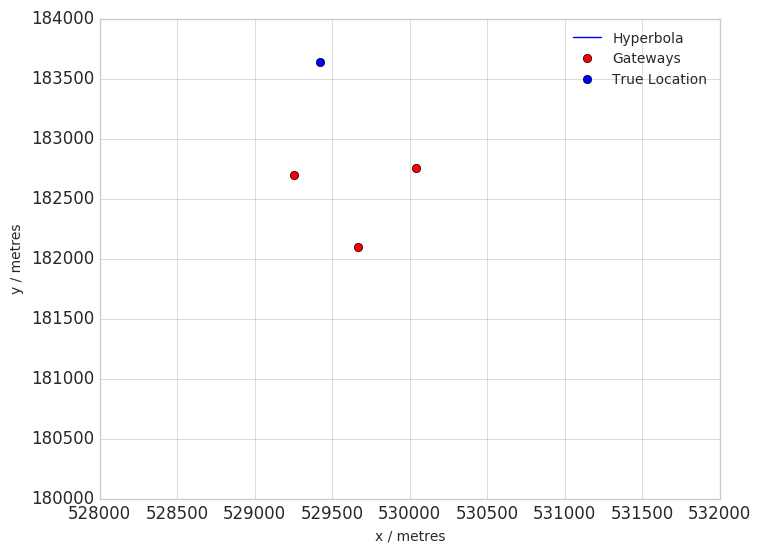

[[ 530037.794       182751.412            0.        ]
 [ 529667.194       182097.667         1108.652484  ]
 [ 529252.05        182699.093         2204.42091644]]


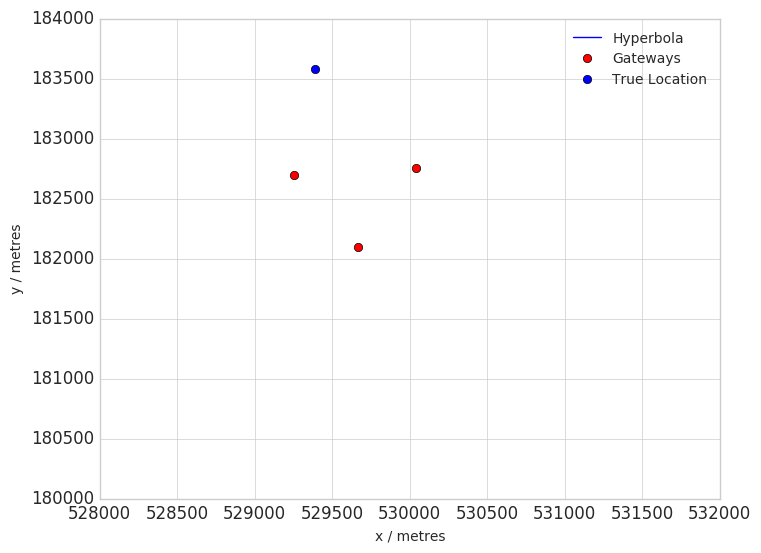

False
False
[[  5.29666529e+05   1.82096537e+05   0.00000000e+00]
 [  5.29251993e+05   1.82701317e+05  -2.56576808e+02]
 [  5.30034962e+05   1.82753565e+05   1.25005855e+03]]


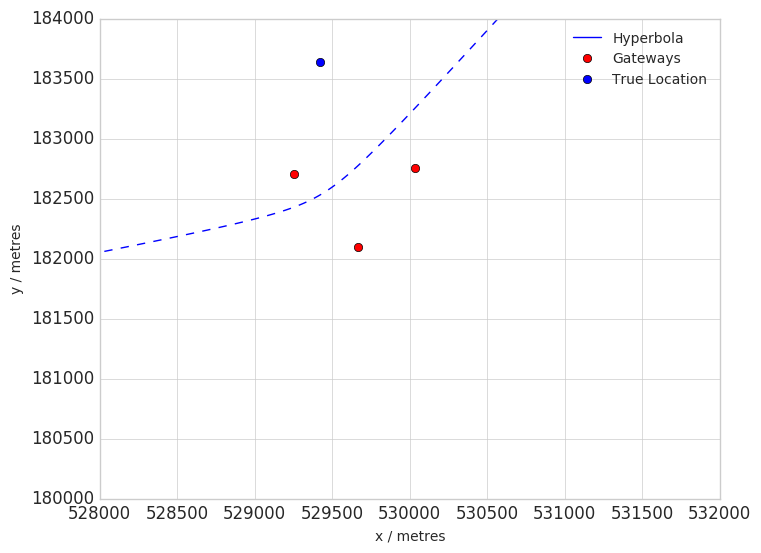

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
[[ 530037.623       182758.084            0.        ]
 [ 529245.949       182693.374         1346.7078141 ]
 [ 529667.223       182096.555         2681.12650495]]


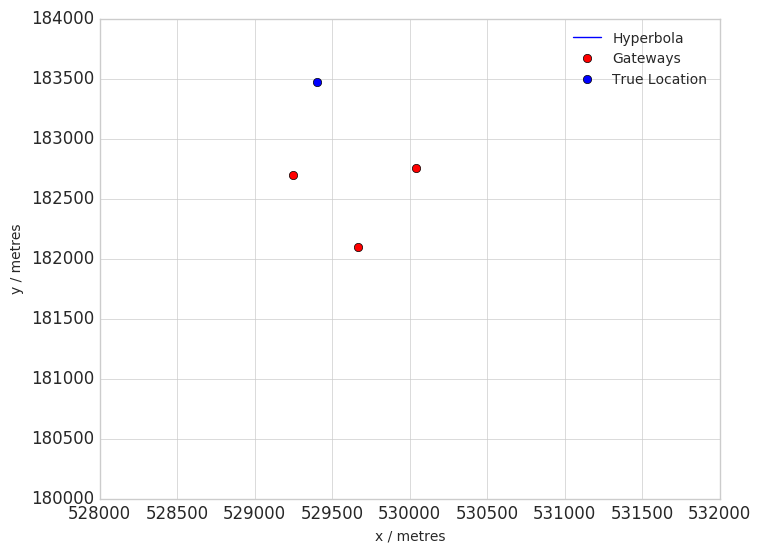

False
False
False
[[  5.29246670e+05   1.82692279e+05   0.00000000e+00]
 [  5.29666501e+05   1.82097649e+05   2.56576808e+02]
 [  5.30037594e+05   1.82759196e+05   1.08347931e+03]]


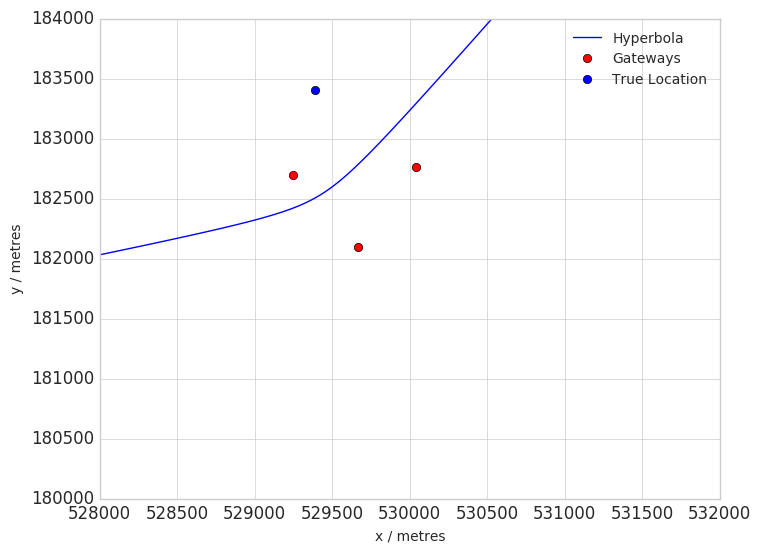

[[ 530038.259       182760.326            0.        ]
 [ 529246.67        182692.279         1704.08827341]
 [ 529666.472       182098.761         2109.31777006]]


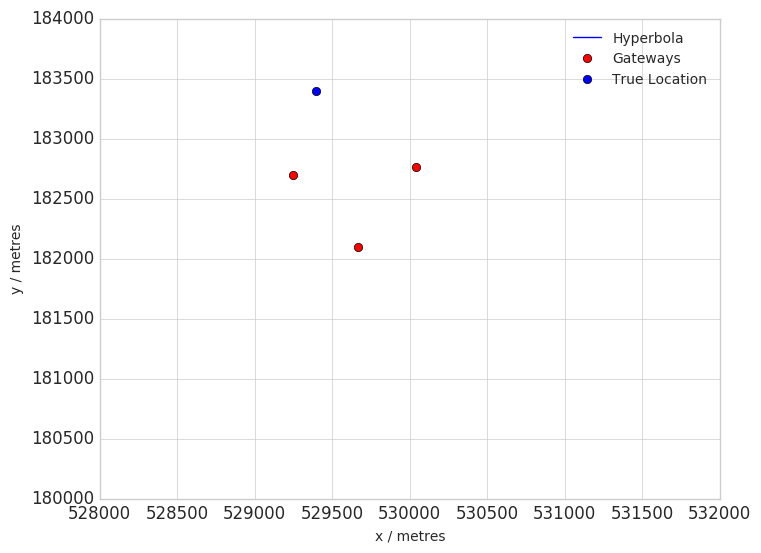

[[  5.29666472e+05   1.82098761e+05   0.00000000e+00]
 [  5.30038259e+05   1.82760326e+05  -2.50939382e+02]
 [  5.29246642e+05   1.82693391e+05  -2.56576808e+02]]


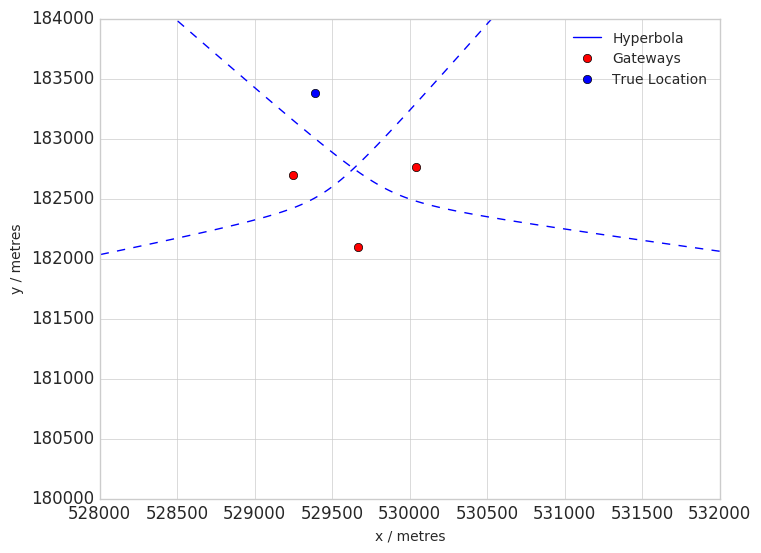

False
False
False
[[ 529248.695       182694.556            0.        ]
 [ 530036.901       182759.178          797.57494175]
 [ 529666.501       182097.649         1757.57473691]]


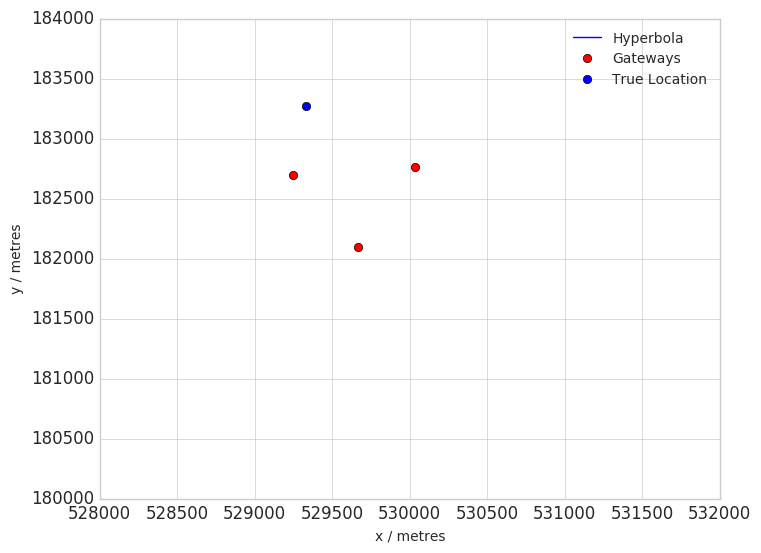

False
[[  5.29666501e+05   1.82097649e+05   0.00000000e+00]
 [  5.30037651e+05   1.82756972e+05   3.49649858e+01]
 [  5.29248695e+05   1.82694556e+05   6.72612386e+02]]


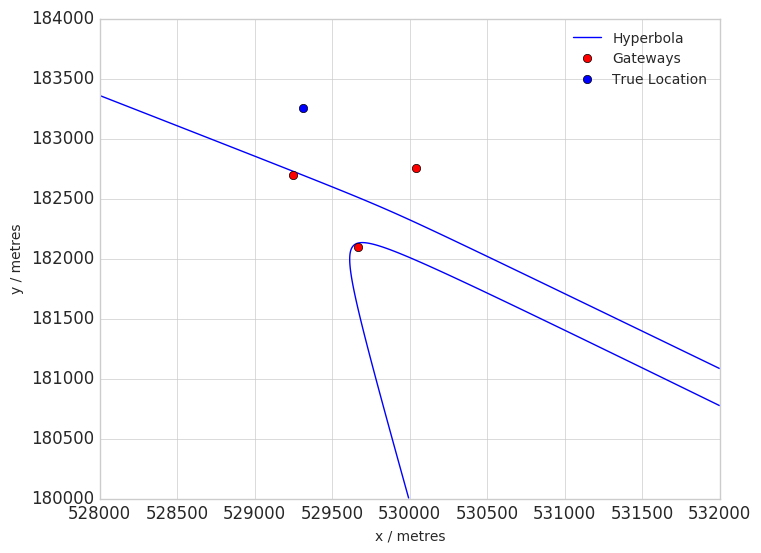

False
False
False
False
[[ 529252.05        182699.093            0.        ]
 [ 529668.639       182095.478         1185.76600202]
 [ 530037.708       182754.748         1083.4793092 ]]


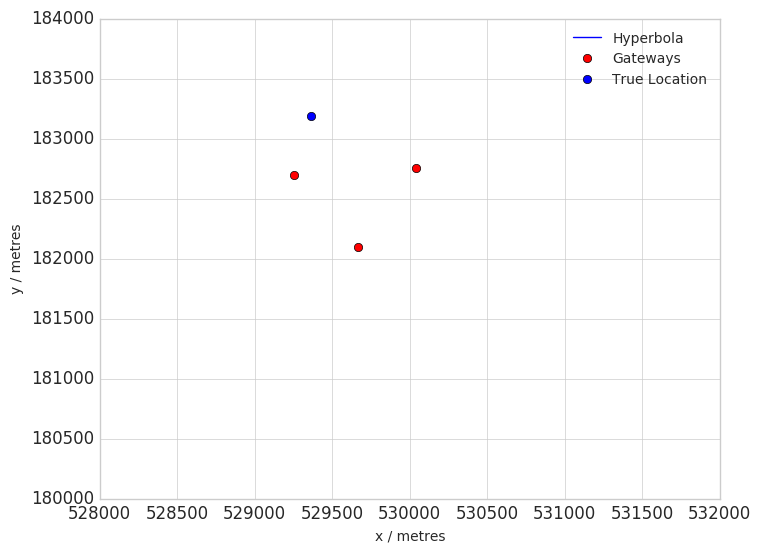

False
False
[[  5.30037651e+05   1.82756972e+05   0.00000000e+00]
 [  5.29253437e+05   1.82699128e+05   4.88994712e+02]
 [  5.29666472e+05   1.82098761e+05   2.96703087e+03]]


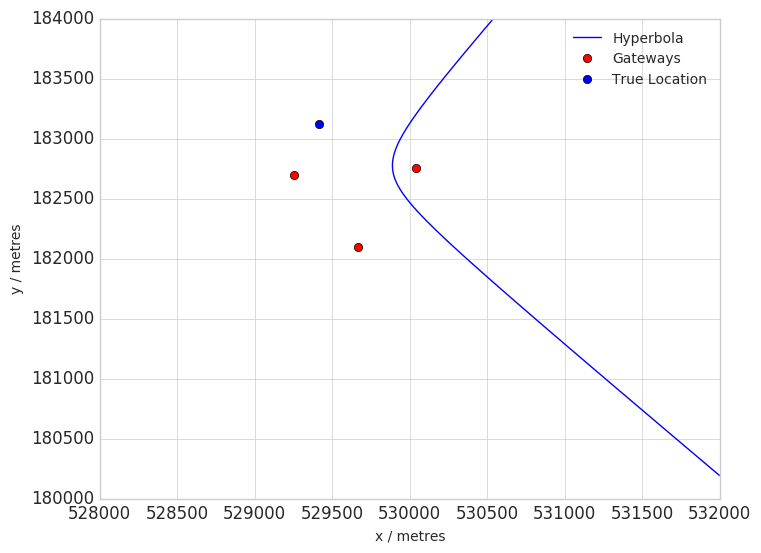

[[  5.29665057e+05   1.82099838e+05   0.00000000e+00]
 [  5.29253437e+05   1.82699128e+05   3.15231927e+02]
 [  5.30037651e+05   1.82756972e+05   1.53596291e+03]]


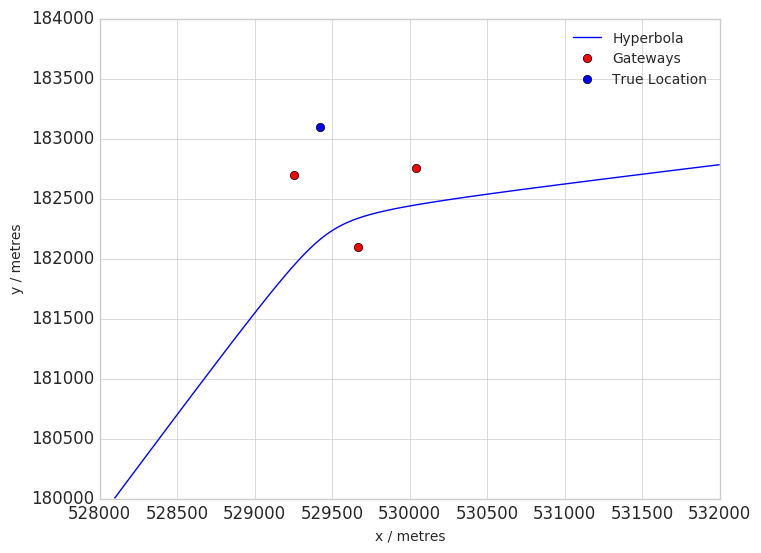

False
False
[[ 529252.743       182699.11             0.        ]
 [ 530037.651       182756.972         1369.38367665]
 [ 529665.057       182099.838         2114.95519622]]


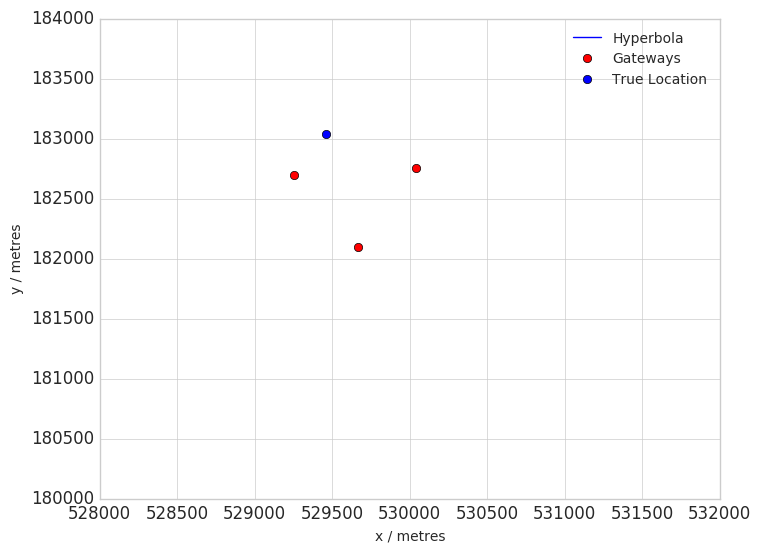

False
False
[[  5.29665057e+05   1.82099838e+05   0.00000000e+00]
 [  5.30037651e+05   1.82756972e+05   1.06441078e+02]
 [  5.29252743e+05   1.82699110e+05   9.58516754e+02]
 [  5.29212615e+05   1.81930304e+05   1.93025838e+03]]


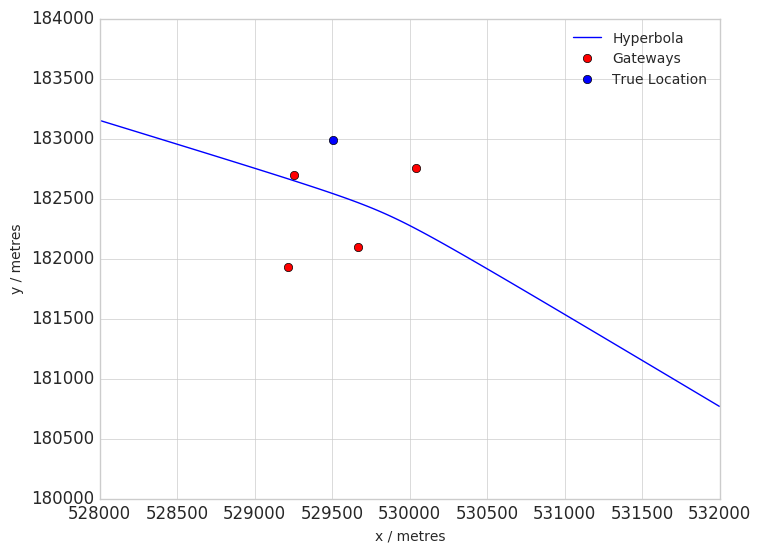

False
[[ 529252.05        182699.093            0.        ]
 [ 529664.391       182098.708         1114.28991016]
 [ 530038.345       182756.99          1655.28804409]]


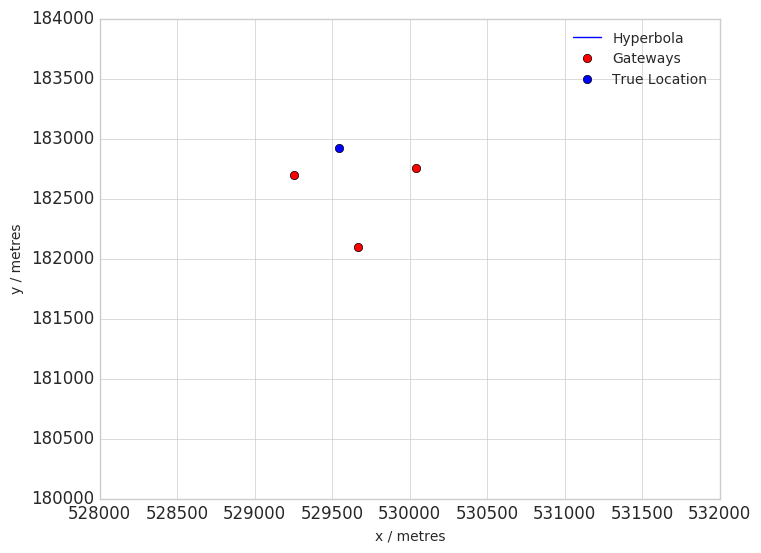

[[ 529252.05        182699.093            0.        ]
 [ 530038.345       182756.99           726.09884989]
 [ 529665.113       182097.614          828.38554271]]


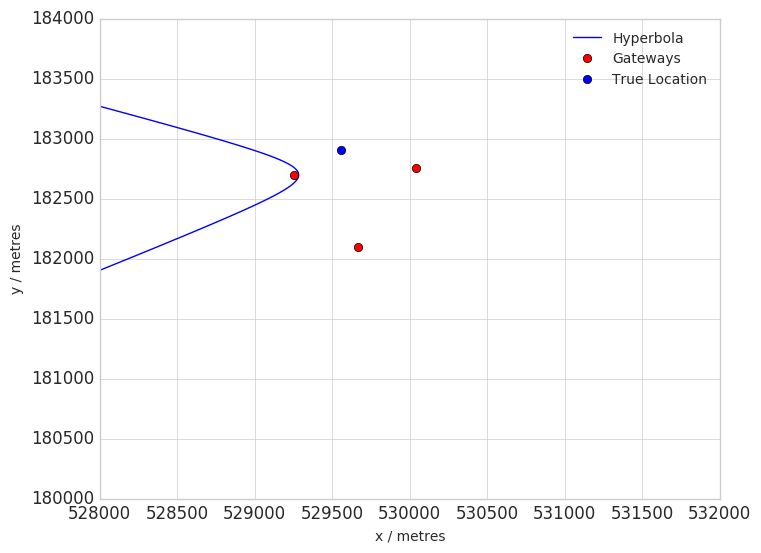

[[  5.30039038e+05   1.82757008e+05   0.00000000e+00]
 [  5.29665113e+05   1.82097614e+05   8.94224208e+02]
 [  5.29252050e+05   1.82699093e+05   4.88994712e+02]]


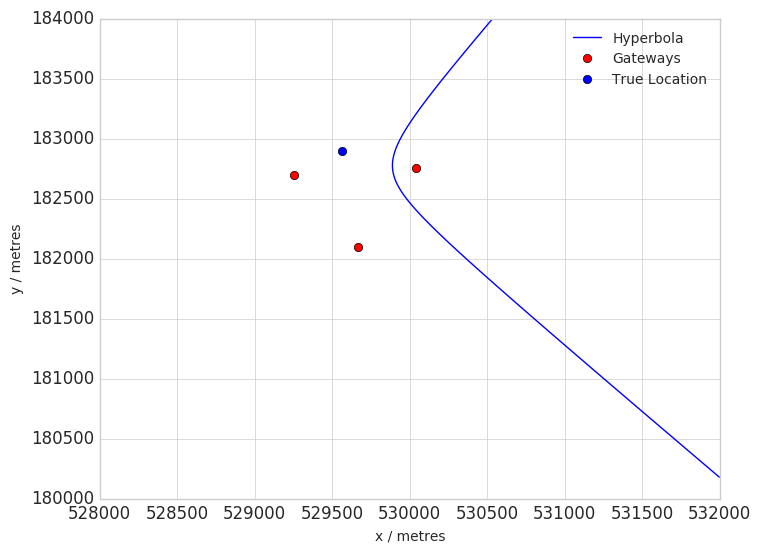

[[  5.30039038e+05   1.82757008e+05   0.00000000e+00]
 [  5.29251384e+05   1.82697963e+05   4.17518620e+02]
 [  5.29665113e+05   1.82097614e+05   1.46603294e+03]]


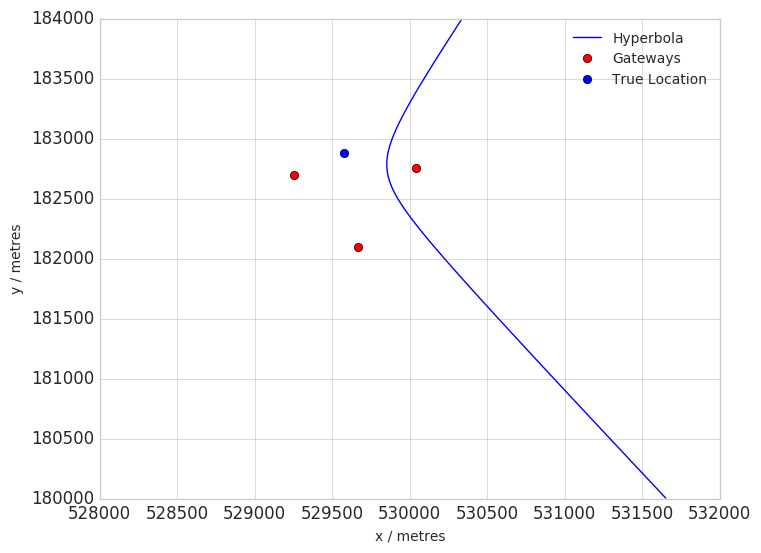

False
False
[[  5.30039038e+05   1.82757008e+05   0.00000000e+00]
 [  5.29665085e+05   1.82098726e+05   5.36843749e+02]
 [  5.29252078e+05   1.82697980e+05   1.31614252e+02]]


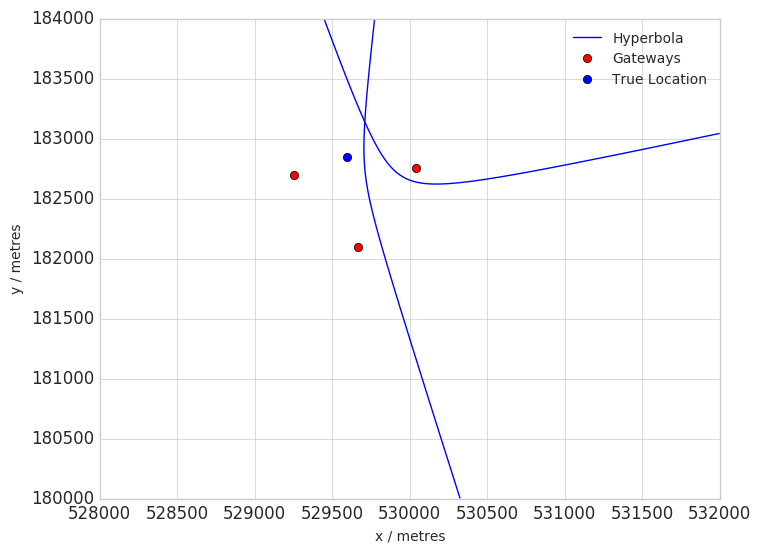

[[  5.30039038e+05   1.82757008e+05   0.00000000e+00]
 [  5.29666501e+05   1.82097649e+05   2.50939382e+02]
 [  5.29252078e+05   1.82697980e+05   4.17518620e+02]]


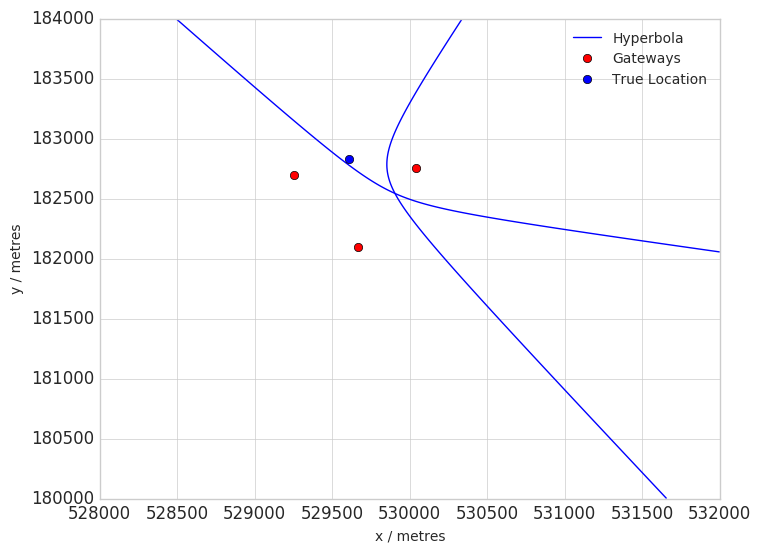

[[ 530038.373       182755.878            0.        ]
 [ 529666.501       182097.649         1180.12857586]
 [ 529252.078       182697.98          1346.7078141 ]]


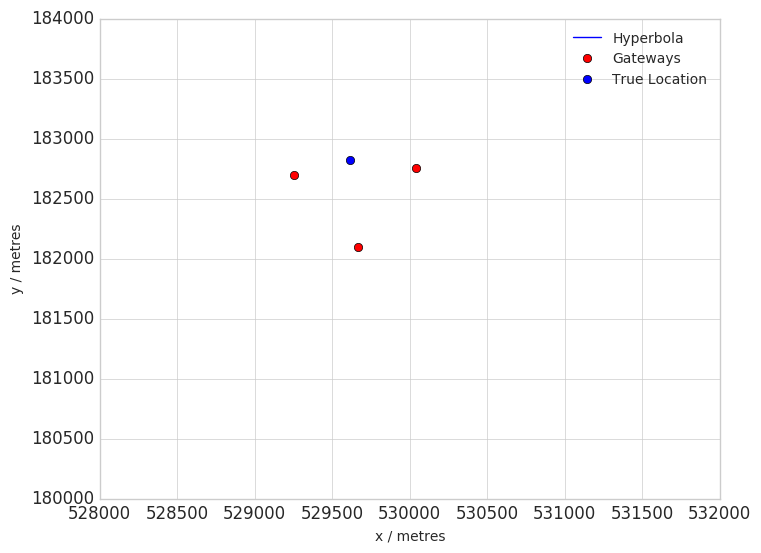

False
False
False
[[  5.29666501e+05   1.82097649e+05   0.00000000e+00]
 [  5.30039067e+05   1.82755896e+05   3.92345445e+02]
 [  5.29251384e+05   1.82697963e+05   6.72612386e+02]]


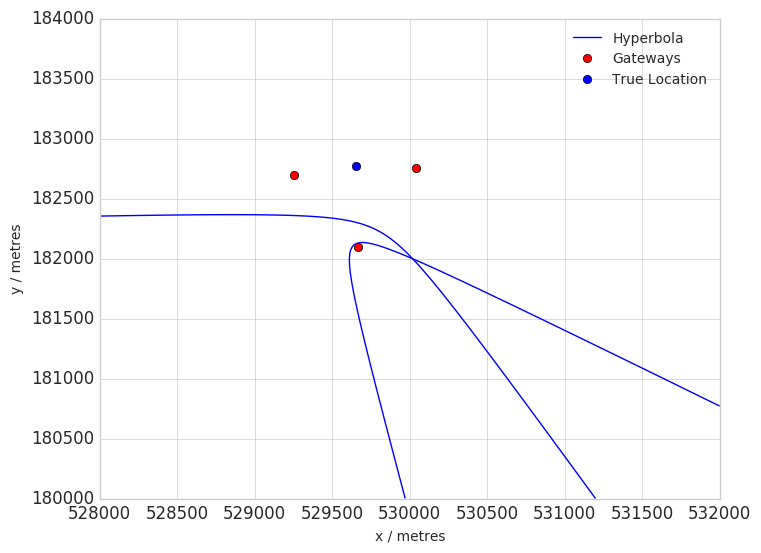

False
[[ 529670.72        182095.531            0.        ]
 [ 529252.078       182697.98           601.13629452]
 [ 530039.067       182755.896         1535.96291489]]


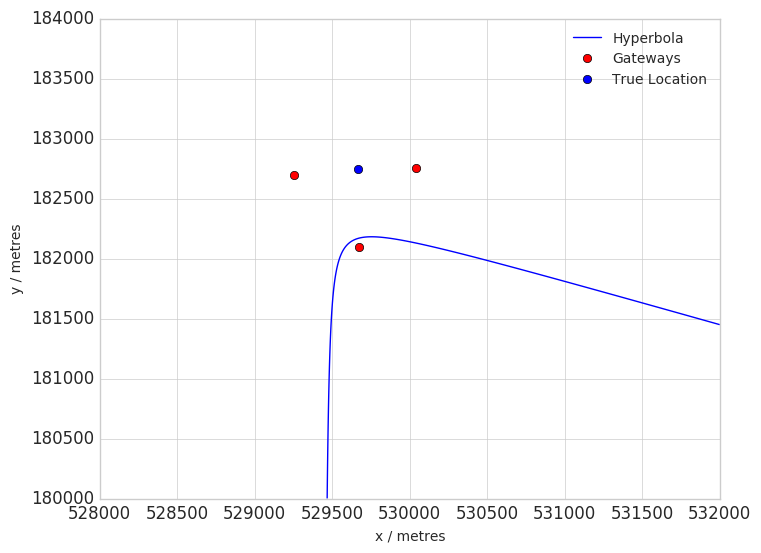

False
[[  5.30037708e+05   1.82754748e+05   0.00000000e+00]
 [  5.29252078e+05   1.82697980e+05  -1.54290115e+02]
 [  5.29670026e+05   1.82095514e+05   1.18012858e+03]]


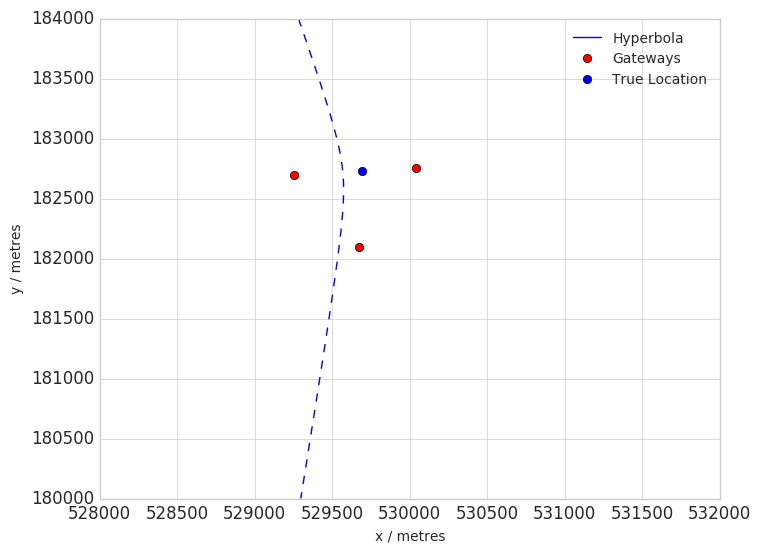

[[ 529670.026       182095.514            0.        ]
 [ 530037.708       182754.748          678.24981255]
 [ 529252.771       182697.998         1530.32548873]]


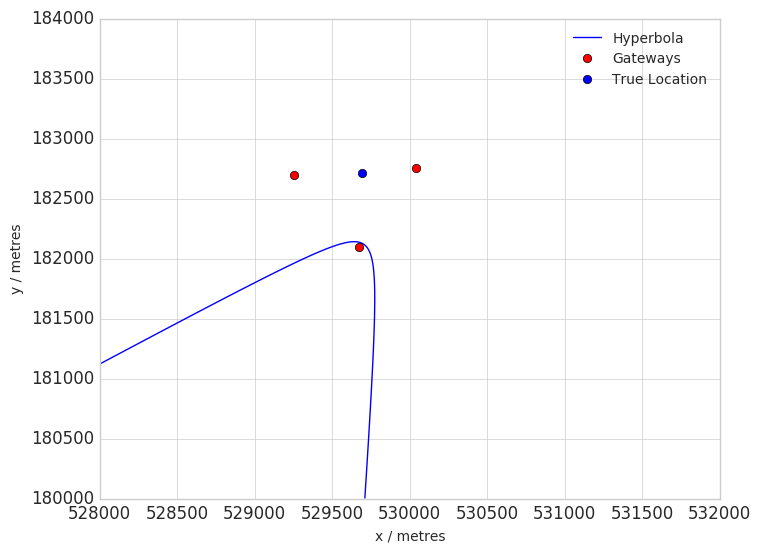

False
False
False
False
False
[[ 530037.737       182753.636            0.        ]
 [ 529252.05        182699.093          989.32735479]
 [ 529668.61        182096.59          1751.93731075]]


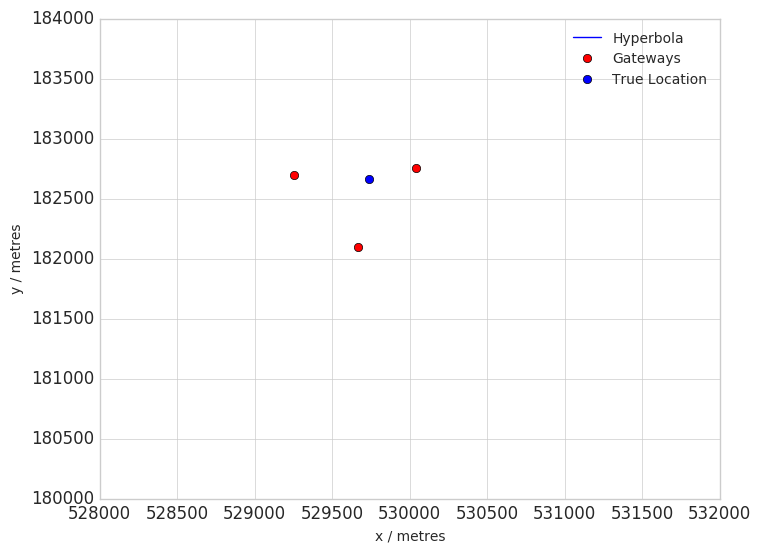

[[ 530037.737      182753.636           0.       ]
 [ 529252.05       182699.093        1346.7078141]
 [ 529668.61       182096.59         2037.8416782]]


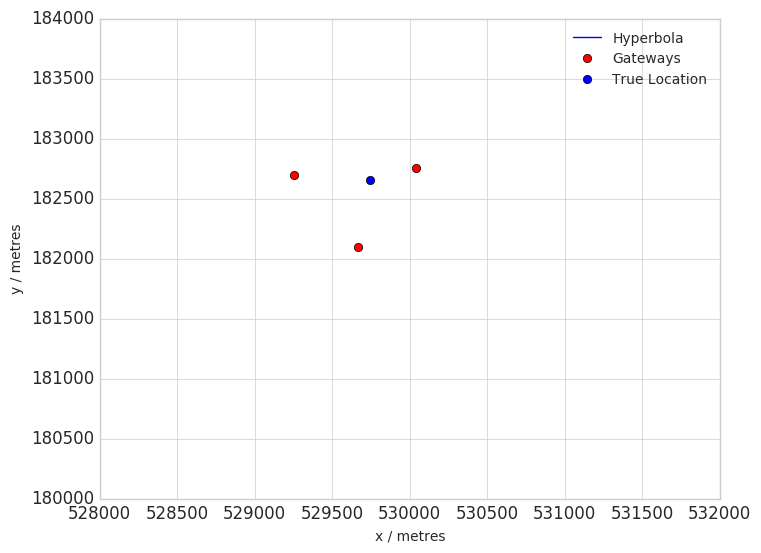

[[  5.30037765e+05   1.82752524e+05   0.00000000e+00]
 [  5.29668610e+05   1.82096590e+05   2.50939382e+02]
 [  5.29252050e+05   1.82699093e+05   2.27589701e+03]]


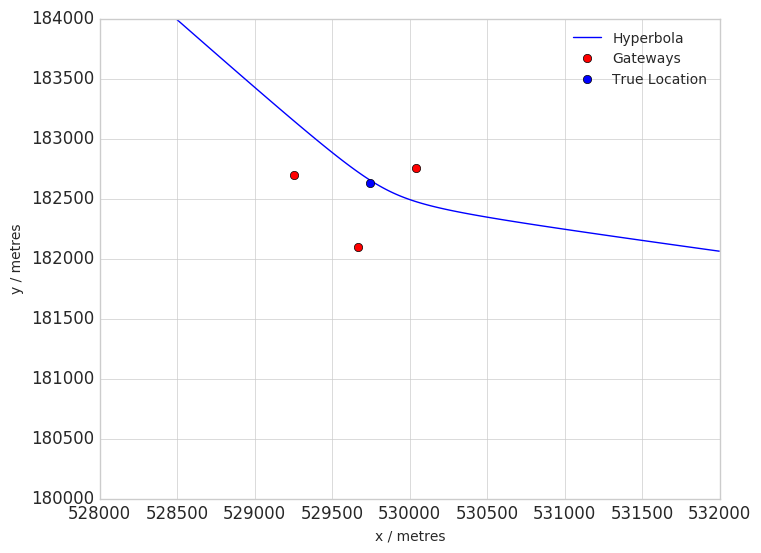

[[ 530037.794       182751.412            0.        ]
 [ 529668.61        182096.59          1466.0329433 ]
 [ 529252.05        182699.093         1060.80344665]]


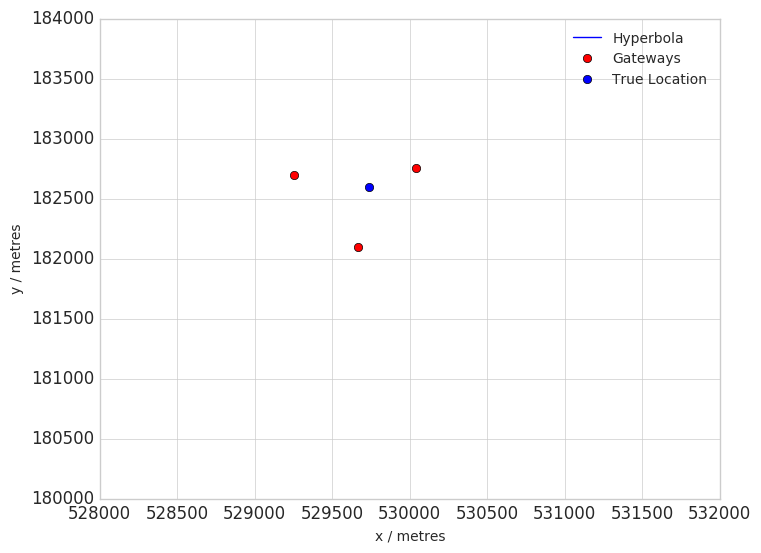

False
[[  5.29668610e+05   1.82096590e+05   0.00000000e+00]
 [  5.30038459e+05   1.82752542e+05   3.49649858e+01]
 [  5.29232706e+05   1.81931928e+05  -2.14024372e+02]
 [  5.29252050e+05   1.82699093e+05   3.15231927e+02]]


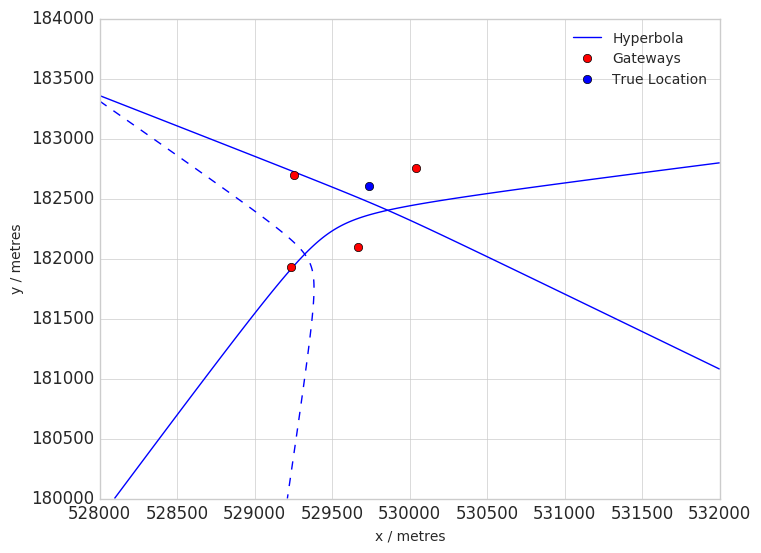

[[ 530038.459       182752.542            0.        ]
 [ 529252.05        182699.093          703.42298734]
 [ 529668.61        182096.59          3538.83960729]]


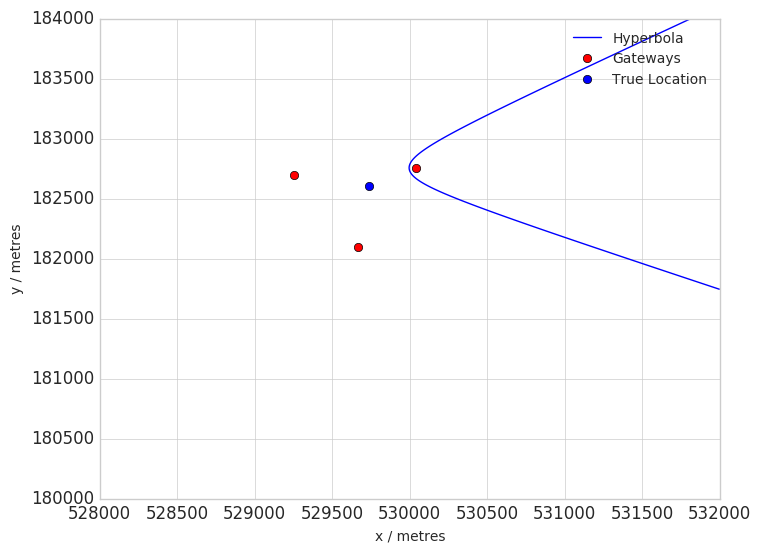

[[ 530038.459       182752.542            0.        ]
 [ 529668.639       182095.478         1466.0329433 ]
 [ 529252.05        182699.093         1060.80344665]]


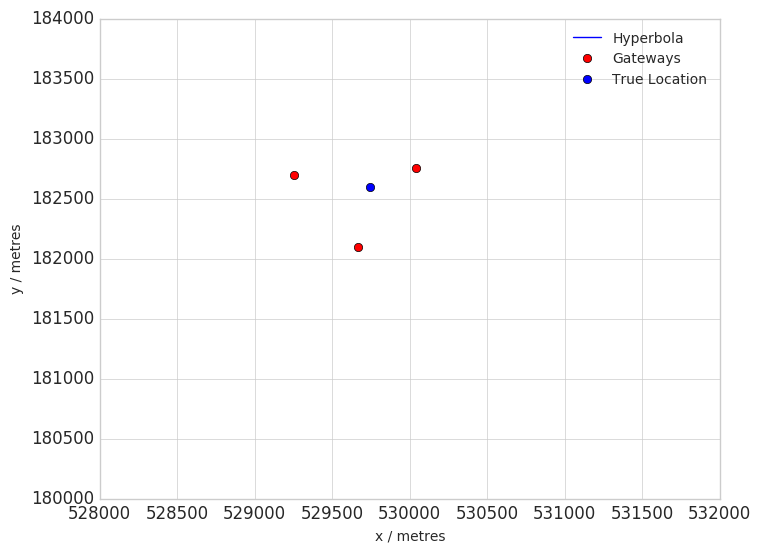

[[  5.29668639e+05   1.82095478e+05   0.00000000e+00]
 [  5.29252050e+05   1.82699093e+05   2.93275596e+01]
 [  5.30038459e+05   1.82752542e+05   1.25005855e+03]]


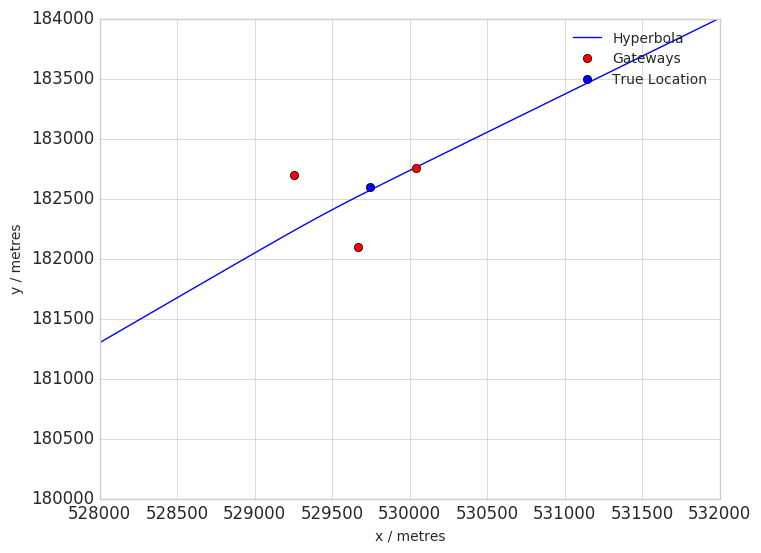

False
[[ 529668.639       182095.478            0.        ]
 [ 530038.487       182751.43           678.24981255]
 [ 529251.384       182697.963          672.61238639]]


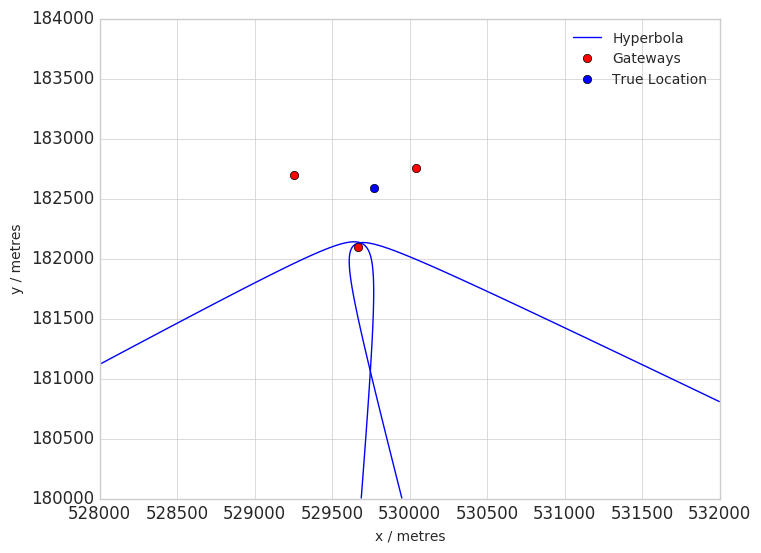

[[  5.29668639e+05   1.82095478e+05   0.00000000e+00]
 [  5.29252078e+05   1.82697980e+05   2.93275596e+01]
 [  5.30038487e+05   1.82751430e+05   2.10777165e+03]]


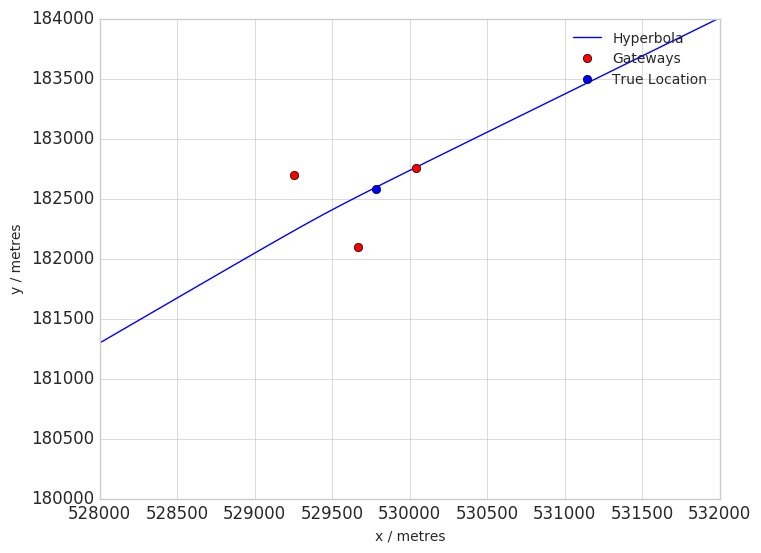

False
[[ 529252.078       182697.98             0.        ]
 [ 530038.487       182751.43          1655.28804409]
 [ 529668.639       182095.478         2043.47910436]]


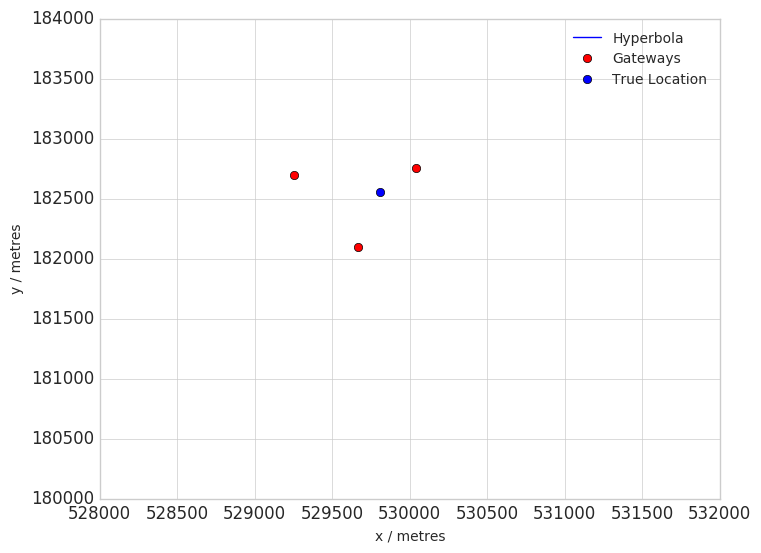

[[ 529667.917       182096.572            0.        ]
 [ 530038.487       182751.43           964.15417999]
 [ 529252.05        182699.093          958.51675383]]


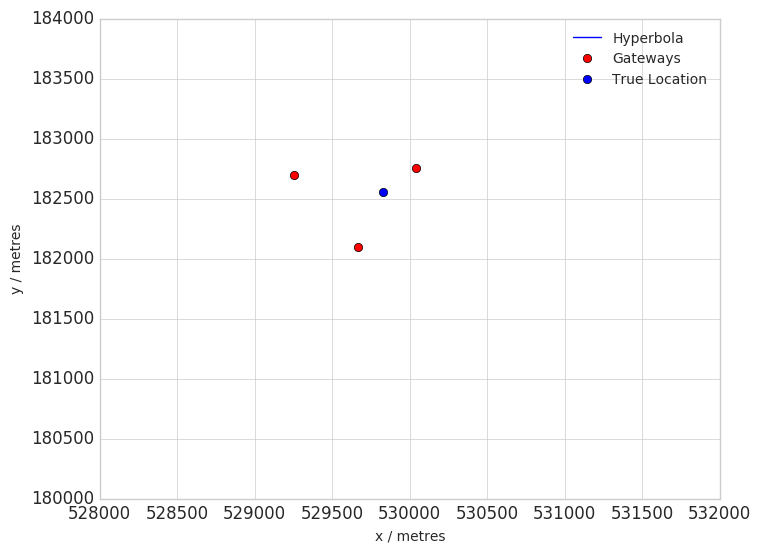

False
False
[[  5.30035684e+05   1.82752471e+05   0.00000000e+00]
 [  5.29252050e+05   1.82699093e+05  -1.54290115e+02]
 [  5.29667194e+05   1.82097667e+05   1.18012858e+03]]


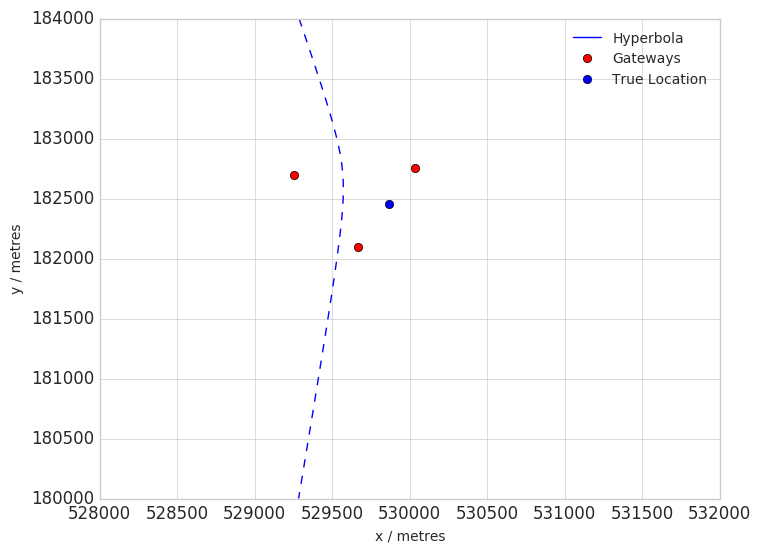

False
[[  5.29666501e+05   1.82097649e+05   0.00000000e+00]
 [  5.29252743e+05   1.82699110e+05  -2.56576808e+02]
 [  5.30034991e+05   1.82752453e+05   6.06773721e+02]]


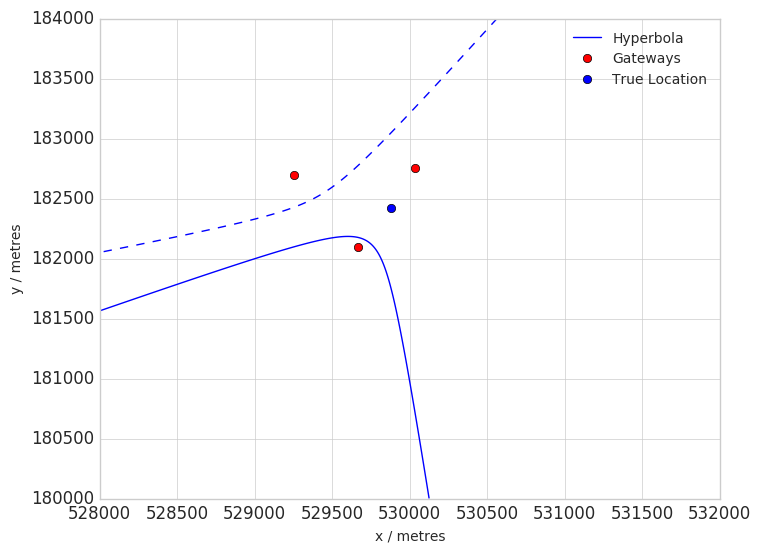

False
False
[[ 530034.962       182753.565            0.        ]
 [ 529666.529       182096.537          822.74811655]
 [ 529252.715       182700.222         2204.42091644]]


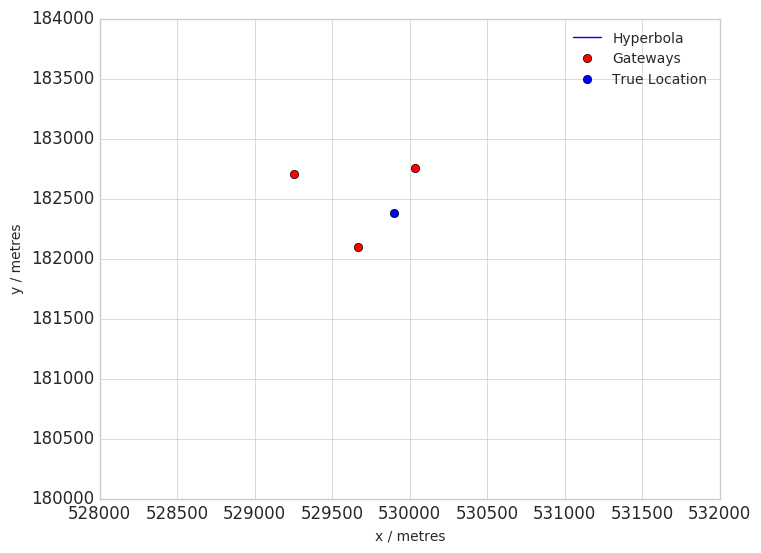

[[  5.29666529e+05   1.82096537e+05   0.00000000e+00]
 [  5.30035656e+05   1.82753583e+05   3.20869353e+02]
 [  5.29251993e+05   1.82701317e+05   2.38803859e+03]]


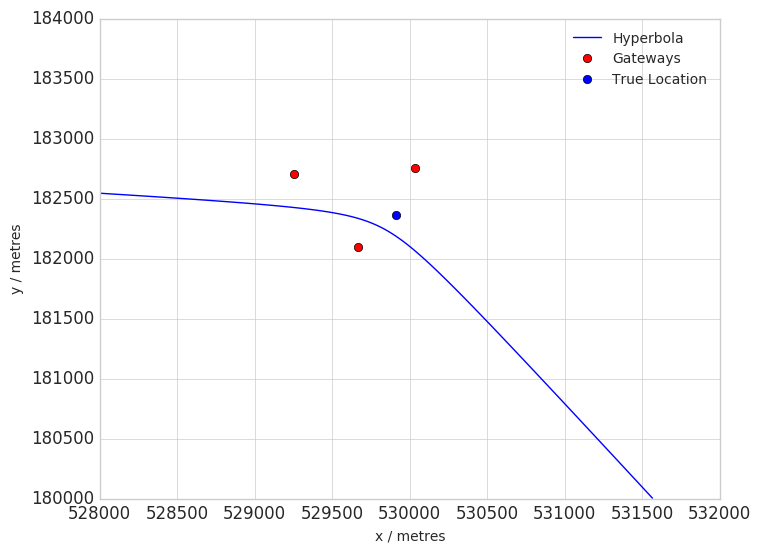

False
False
[[ 530034.934       182754.677            0.        ]
 [ 529666.529       182096.537          822.74811655]
 [ 529251.993       182701.317          703.42298734]]


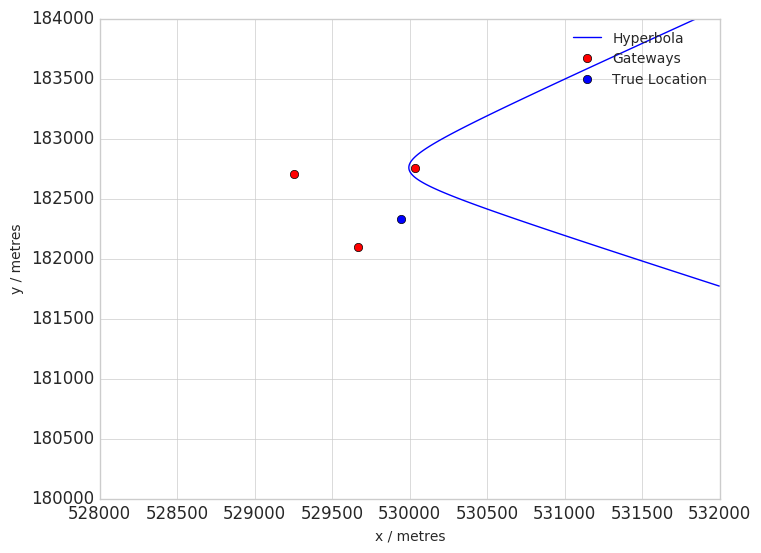

[[ 529666.529       182096.537            0.        ]
 [ 530034.934       182754.677         1250.05854744]
 [ 529251.993       182701.317         2745.41905038]]


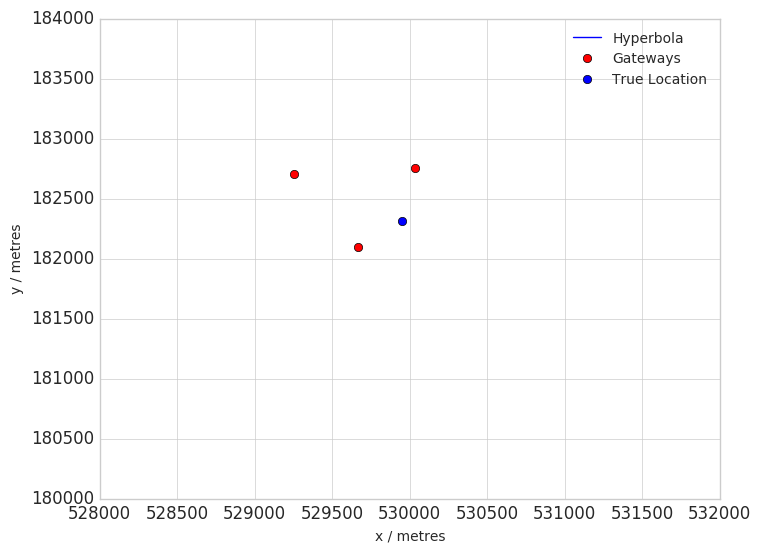

[[ 529666.529       182096.537            0.        ]
 [ 529251.965       182702.429          672.61238639]
 [ 530034.934       182754.677          678.24981255]]


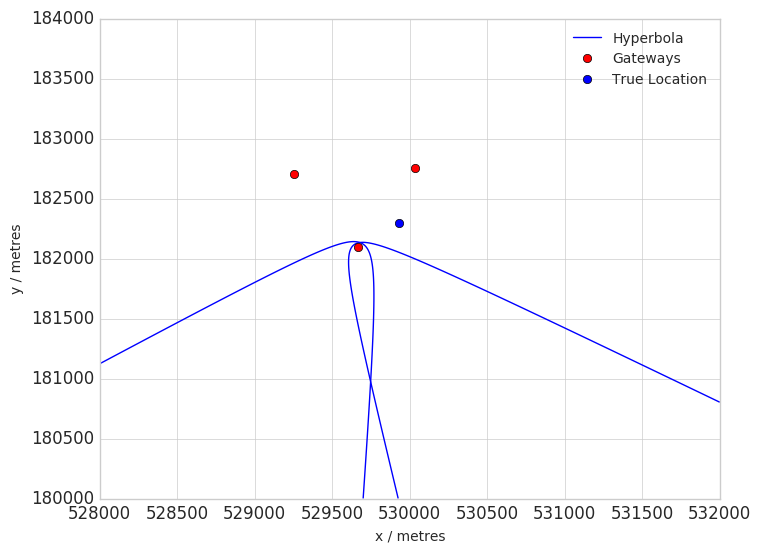

False
[[  5.30035656e+05   1.82753583e+05   0.00000000e+00]
 [  5.29666501e+05   1.82097649e+05   2.50939382e+02]
 [  5.29251965e+05   1.82702429e+05   7.74899079e+02]]


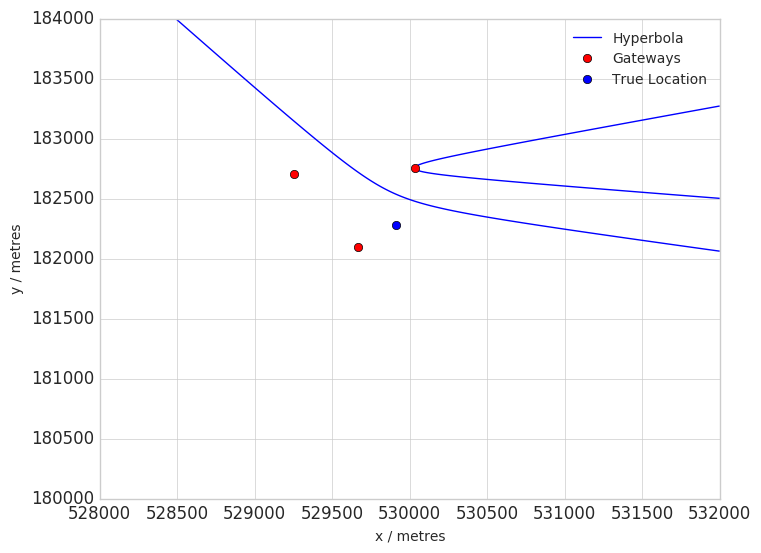

[[ 529251.271       182702.411            0.        ]
 [ 530035.656       182753.583         1655.28804409]
 [ 529666.501       182097.649         1757.57473691]]


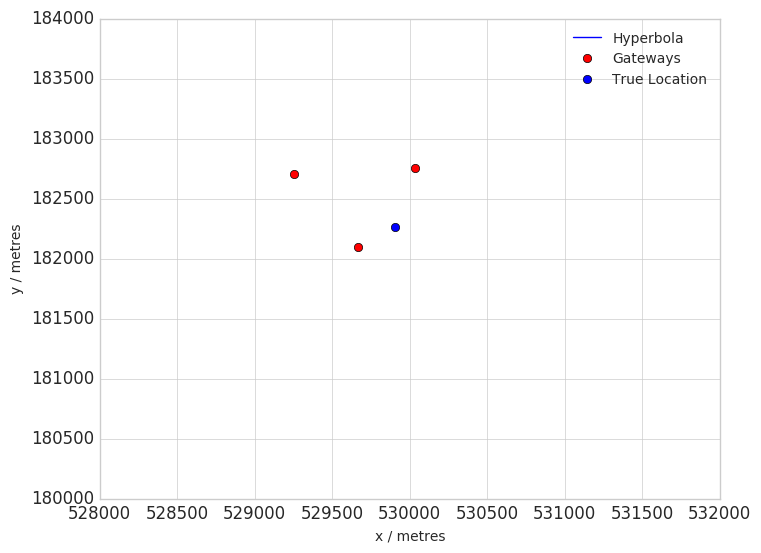

False
False
False
False
False
[[ 529667.223       182096.555            0.        ]
 [ 529251.299       182701.299         1244.42112128]
 [ 530036.349       182753.601         2179.24774164]]


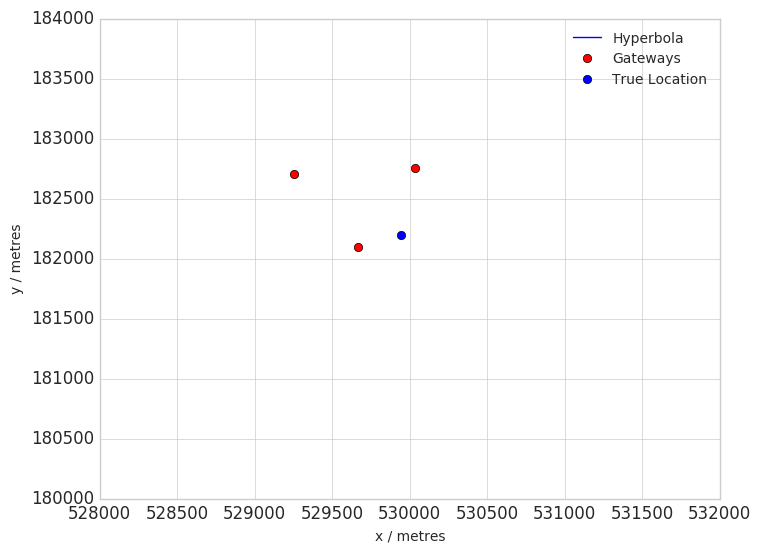

[[ 530036.349       182753.601            0.        ]
 [ 529667.194       182097.667          822.74811655]
 [ 529251.299       182701.299         2204.42091644]]


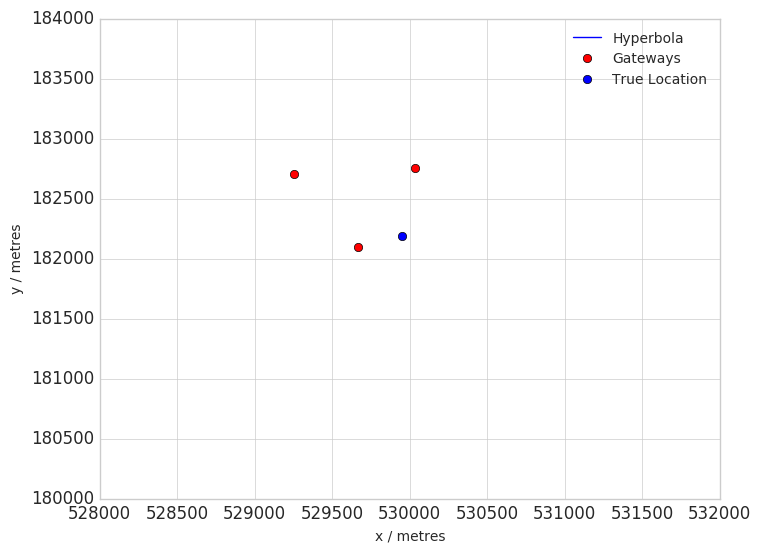

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
[[  5.30038373e+05   1.82755878e+05   0.00000000e+00]
 [  5.29666444e+05   1.82099873e+05   2.50939382e+02]
 [  5.29250493e+05   1.82705729e+05   7.74899079e+02]]


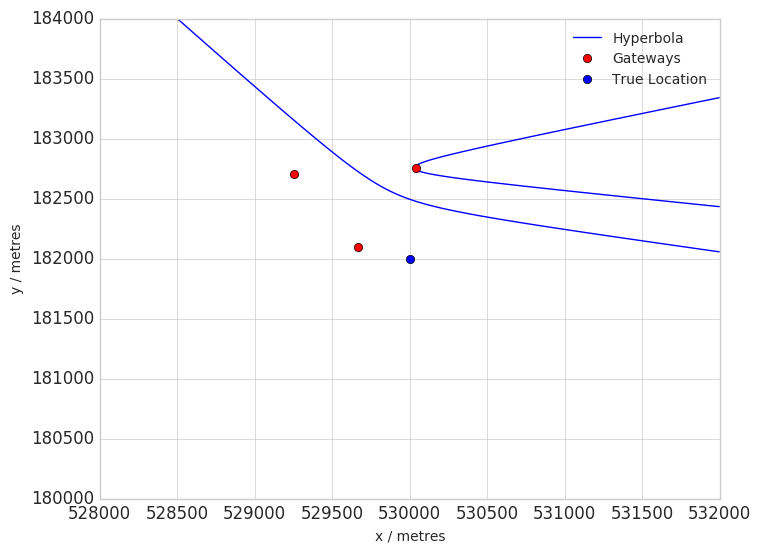

False
False
False
False
False
False
False
False
False
False
False
[[  5.29248525e+05   1.82701228e+05   0.00000000e+00]
 [  5.29667746e+05   1.82103244e+05   2.56576808e+02]
 [  5.30036349e+05   1.82753601e+05   1.54290115e+02]]


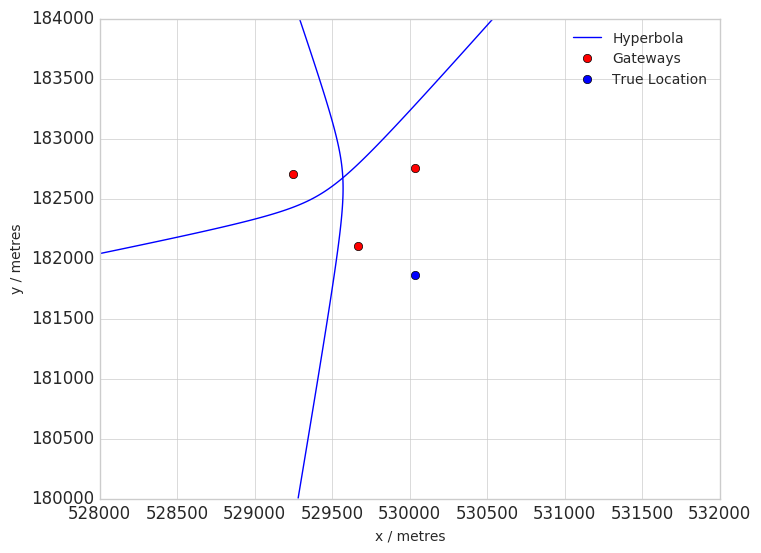

False
False
[[ 529668.412       182104.374            0.        ]
 [ 529248.553       182700.116         2102.13422362]
 [ 530036.349       182753.601         2465.15210909]]


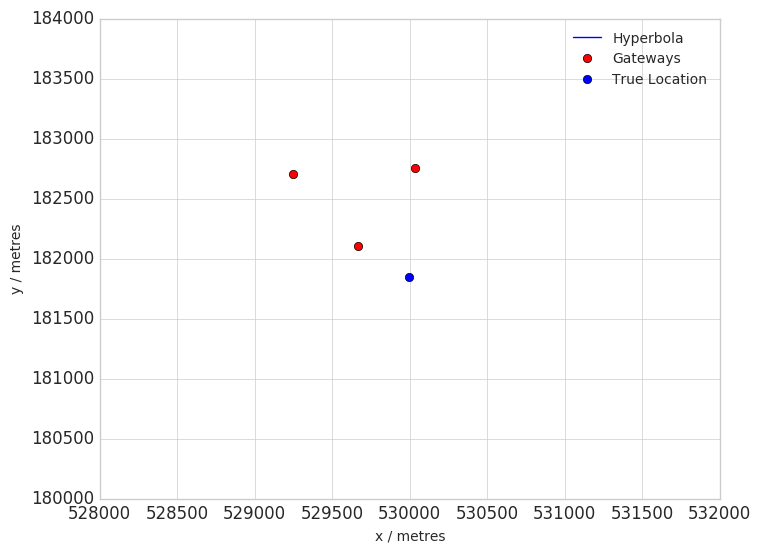

False
False
[[ 529669.105       182104.392            0.        ]
 [ 529248.553       182700.116          601.13629452]
 [ 530039.124       182753.672         1178.58245558]]


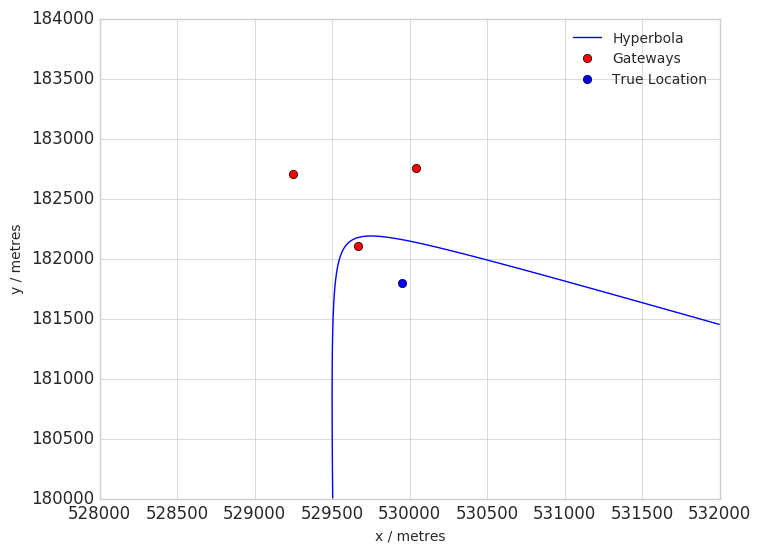

False
False
False
False
[[  5.29669827e+05   1.82103298e+05   0.00000000e+00]
 [  5.29227963e+05   1.81927356e+05   7.18799950e+01]
 [  5.29248553e+05   1.82700116e+05   6.72612386e+02]]


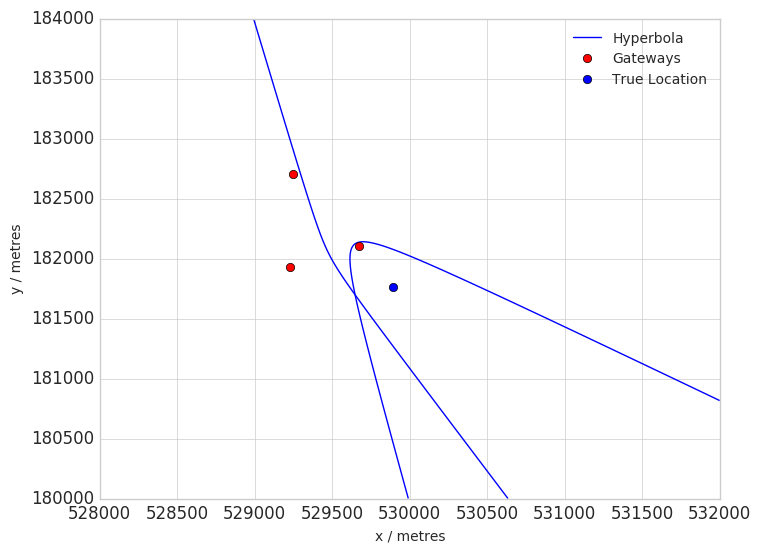

[[ 529669.827       182103.298            0.        ]
 [ 530039.095       182754.784          678.24981255]
 [ 529248.553       182700.116          672.61238639]]


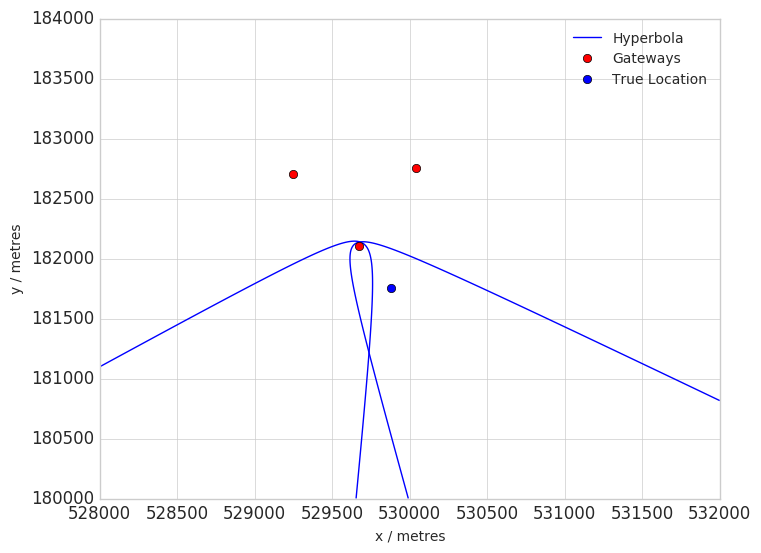

False
False
False
False
False
False
False
False
[[  5.29249247e+05   1.82700134e+05   0.00000000e+00]
 [  5.30039095e+05   1.82754784e+05   4.40194482e+02]
 [  5.29669799e+05   1.82104410e+05   8.28385543e+02]]


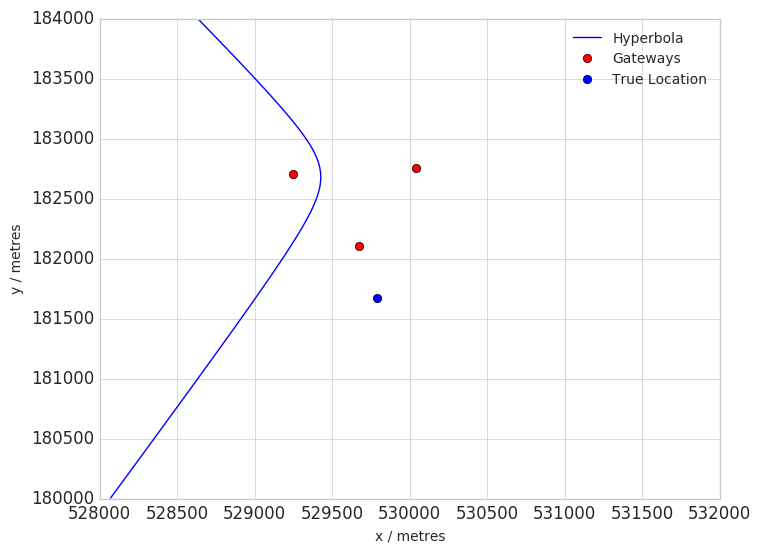

False
[[ 529669.799       182104.41             0.        ]
 [ 530039.095       182754.784         2465.15210909]
 [ 529248.553       182700.116         2459.51468293]]


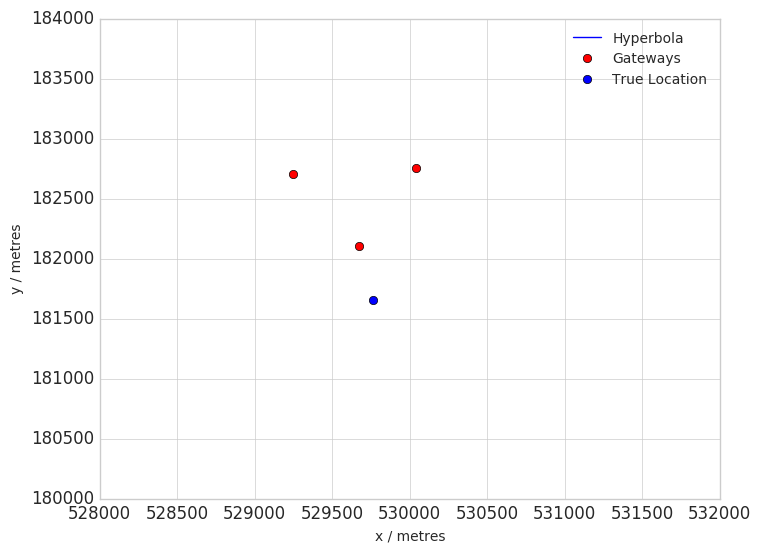

False
False
False
[[  5.29219667e+05   1.81926033e+05   0.00000000e+00]
 [  5.29671243e+05   1.82102221e+05   7.85833107e+02]
 [  5.30038430e+05   1.82753654e+05   4.19445228e+02]
 [  5.29248497e+05   1.82702340e+05   5.04675041e+02]]


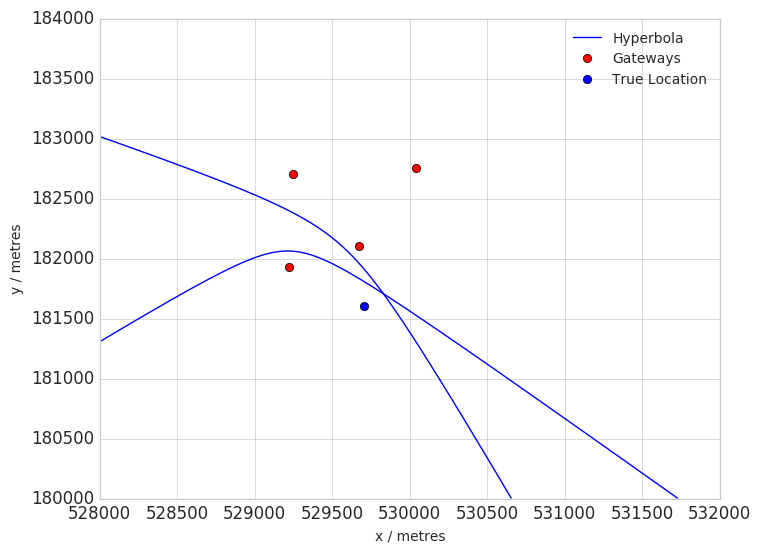

False
[[  5.29670549e+05   1.82102203e+05   0.00000000e+00]
 [  5.30038459e+05   1.82752542e+05   3.49649858e+01]
 [  5.29249162e+05   1.82703470e+05   2.74541905e+03]]


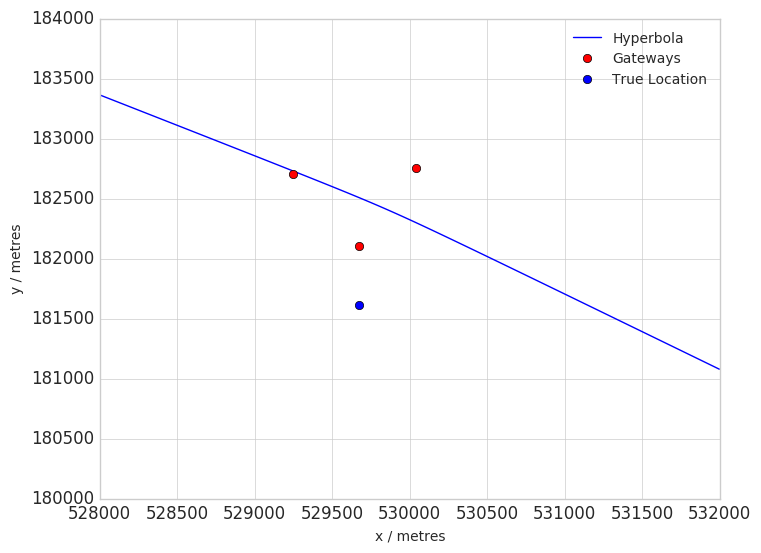

False
False
False
False
False
False
[[ 529669.799       182104.41             0.        ]
 [ 529223.305       181919.449         1358.44964855]
 [ 530039.124       182753.672         1893.3433742 ]
 [ 529249.105       182705.694         2173.61031548]]


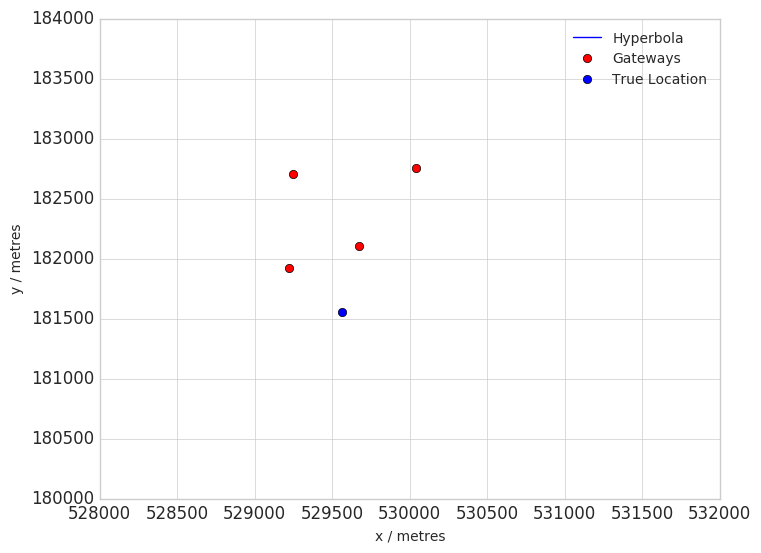

[[ 529669.799       182104.41             0.        ]
 [ 530039.124       182753.672          892.67808813]
 [ 529248.412       182705.676         1530.32548873]]


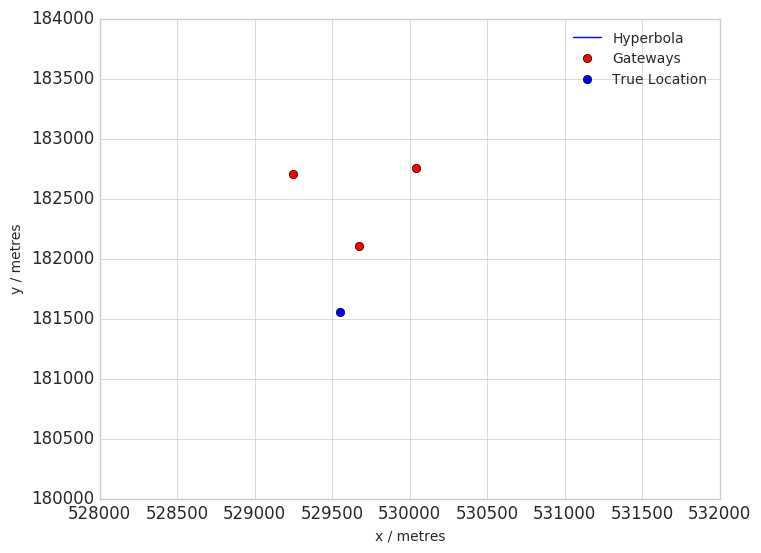

False
False
False
False
False
False
False
[[  5.29671908e+05   1.82103351e+05   0.00000000e+00]
 [  5.29250379e+05   1.82710177e+05   6.72612386e+02]
 [  5.29232734e+05   1.81930816e+05   4.29260454e+02]]


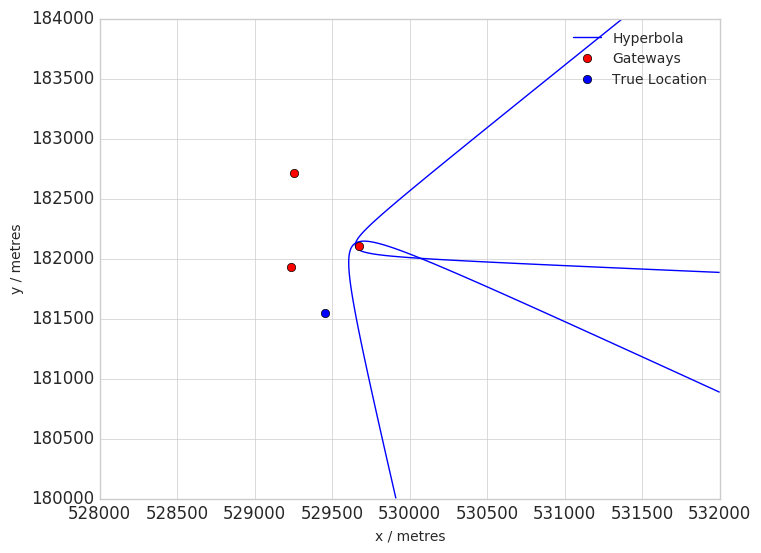

False
False
False
False
False
False
False
[[ 529670.521       182103.315            0.        ]
 [ 530038.459       182752.542          678.24981255]
 [ 529251.767       182710.213          672.61238639]]


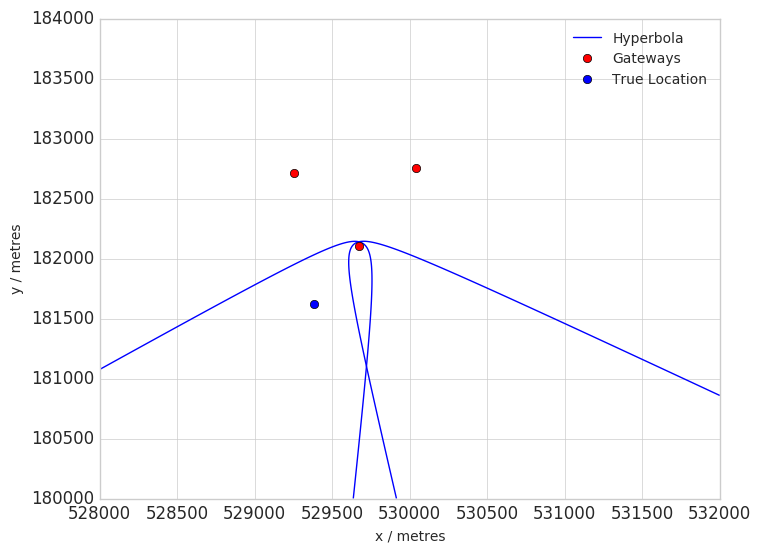

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
[[  5.29192950e+05   1.81912000e+05   0.00000000e+00]
 [  5.26677699e+05   1.79361768e+05   5.37231019e+02]
 [  5.30799890e+05   1.80891553e+05  -1.27515409e+02]]


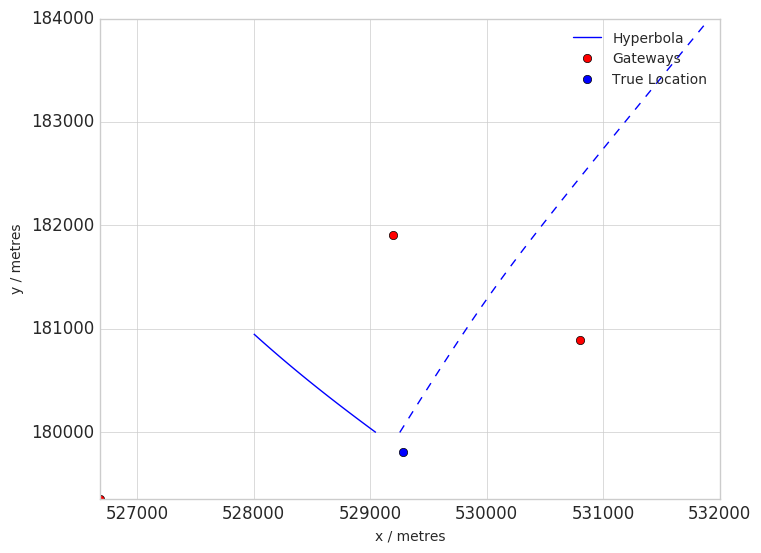

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
[[ 529672.886       182092.248            0.        ]
 [ 530793.674       180890.28          1541.95600206]
 [ 527345.951       177247.61          1374.20332282]]


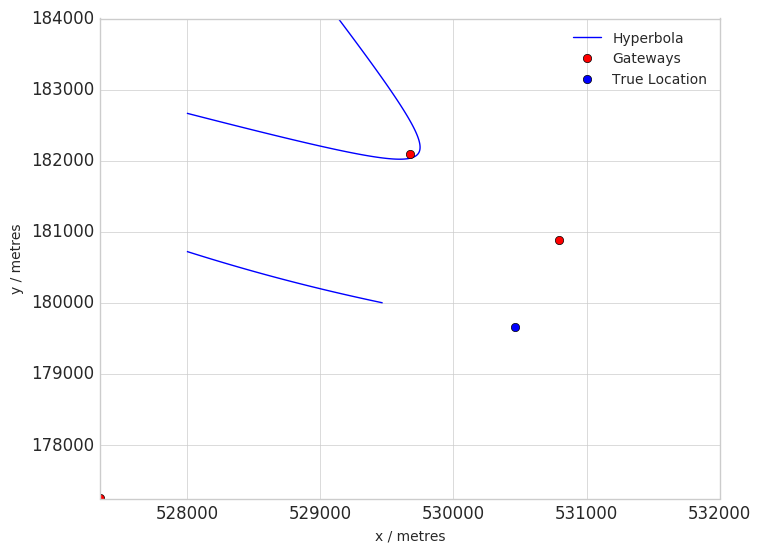

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
[[ 530802.058       180888.271            0.        ]
 [ 529252.134       182695.756         2550.86216516]
 [ 527345.257       177247.593                   nan]]


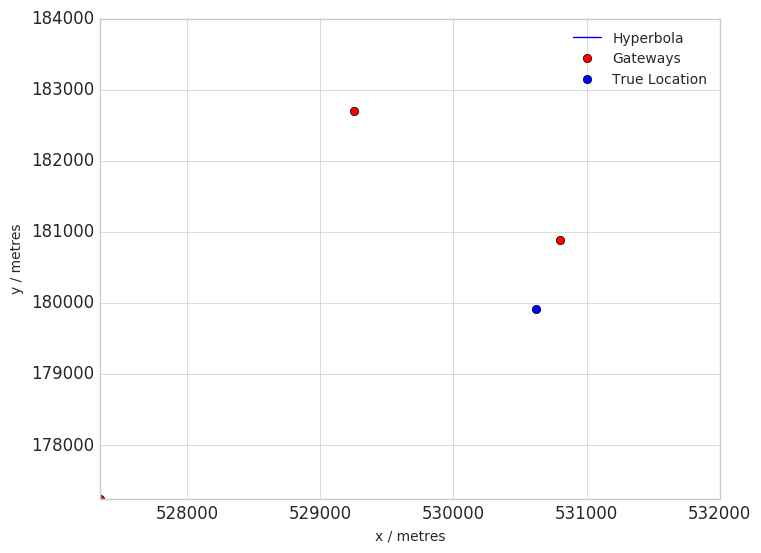

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
[[ 530797.086       180892.594            0.        ]
 [ 529217.5         181929.316         2843.60690001]
 [ 530041.319       182749.277         3230.19835188]]


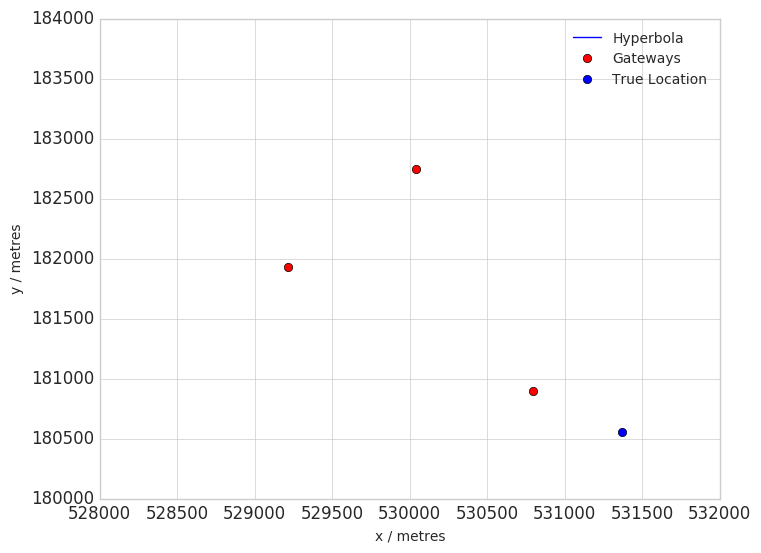

[[ 532014.377       181395.869            0.        ]
 [ 530797.086       180892.594       281416.56432479]
 [ 529252.276       182690.196       204220.96299022]]


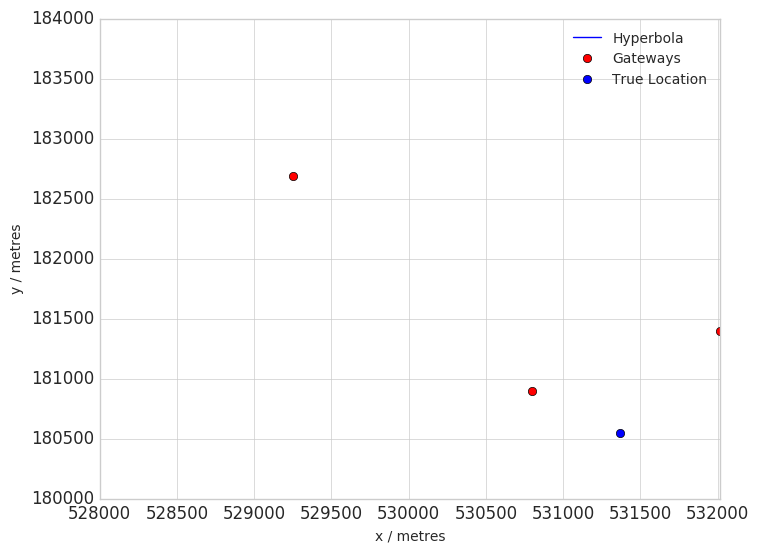

False
[[ 532014.377       181395.869            0.        ]
 [ 530797.78        180892.612      -330132.87764412]
 [ 530041.984       182750.407      -117751.42697659]
 [ 529672.192       182092.231       -49297.07236245]]


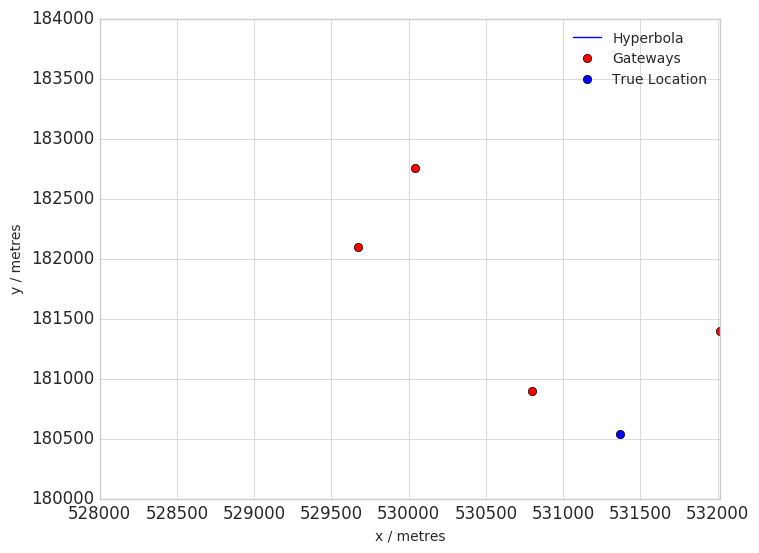

False
False
False
[[ 530797.058       180893.706            0.        ]
 [ 529672.192       182092.231         2103.32468289]
 [ 530041.29        182750.389         2586.91352513]
 [ 529252.276       182690.196         4051.86009425]]


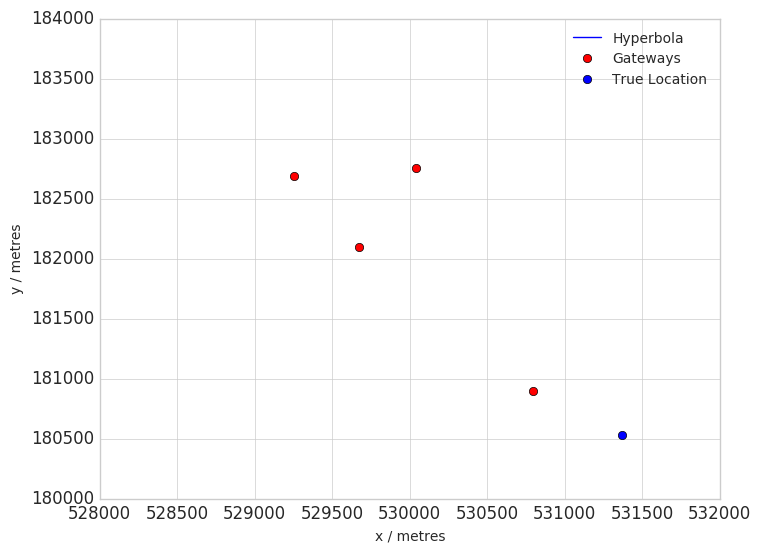

False
[[ 530797.058       180893.706            0.        ]
 [ 529672.192       182092.231         1460.03985614]
 [ 530041.262       182751.501         4087.91145422]
 [ 529252.304       182689.084         4051.86009425]]


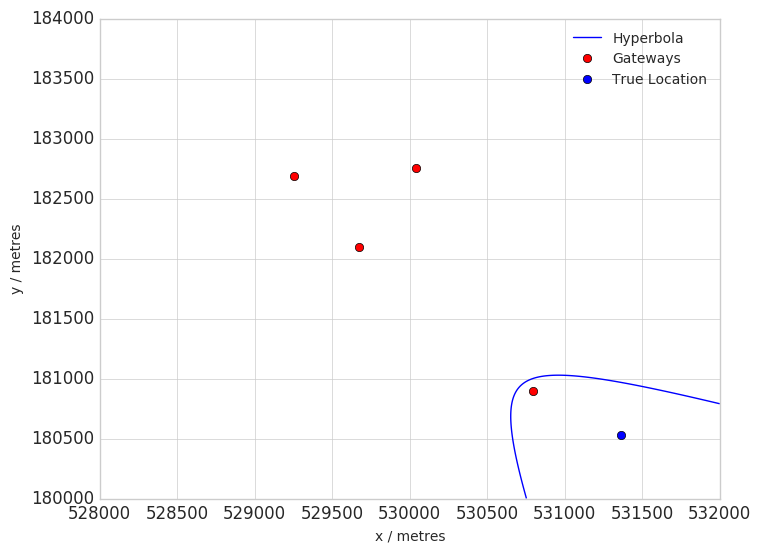

False
[[ 532014.377       181395.869            0.        ]
 [ 530797.058       180893.706       224807.49957031]
 [ 529254.357       182690.249       149970.60926717]]


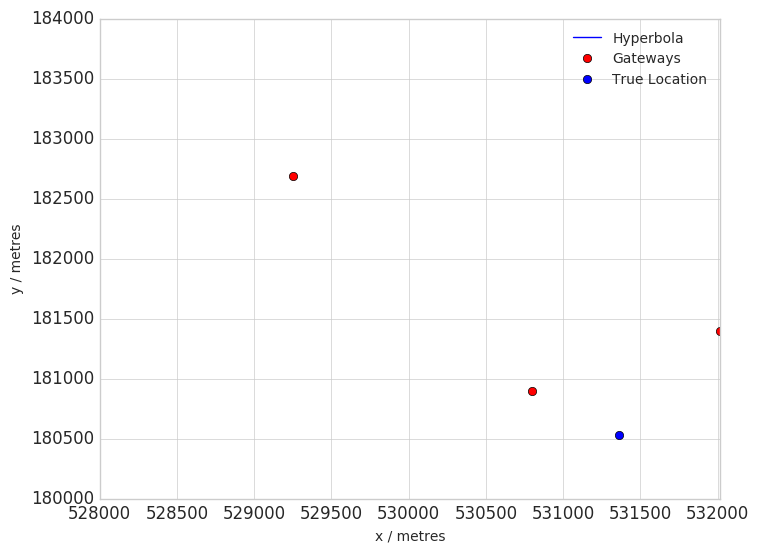

[[ 530796.335       180894.8              0.        ]
 [ 530040.568       182751.483         2229.53306582]
 [ 529254.357       182690.249         4051.86009425]]


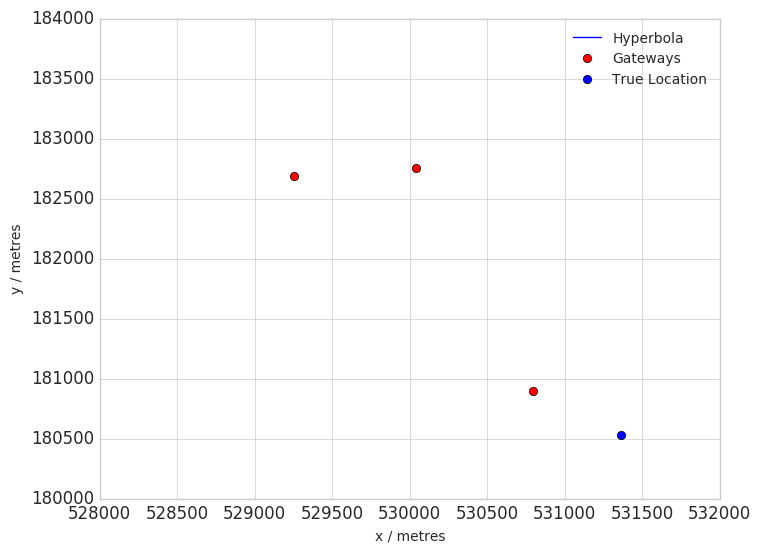

[[ 530796.335       180894.8              0.        ]
 [ 529672.192       182092.231         1245.61158055]
 [ 530040.568       182751.483         2015.10479023]
 [ 529254.357       182690.249         1693.14906282]]


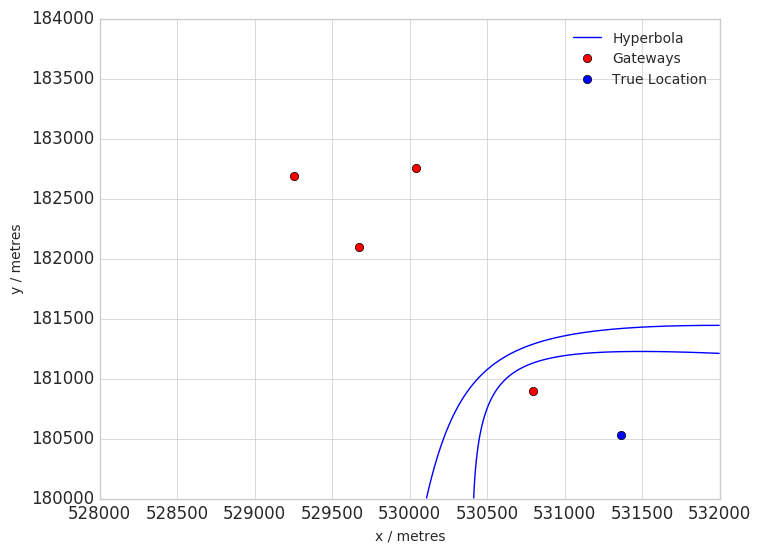

[[ 530796.335       180894.8              0.        ]
 [ 529672.192       182092.231         1245.61158055]
 [ 529256.409       182691.414         1693.14906282]]


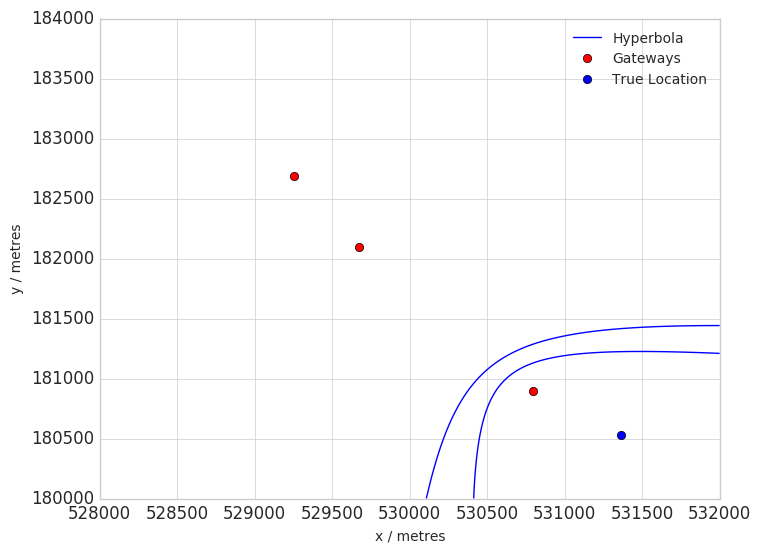

[[ 532014.377       181395.869            0.        ]
 [ 530796.335       180894.8        -286389.50942475]
 [ 529672.192       182092.231        -6697.32161286]
 [ 529256.409       182691.414      -363585.11075932]]


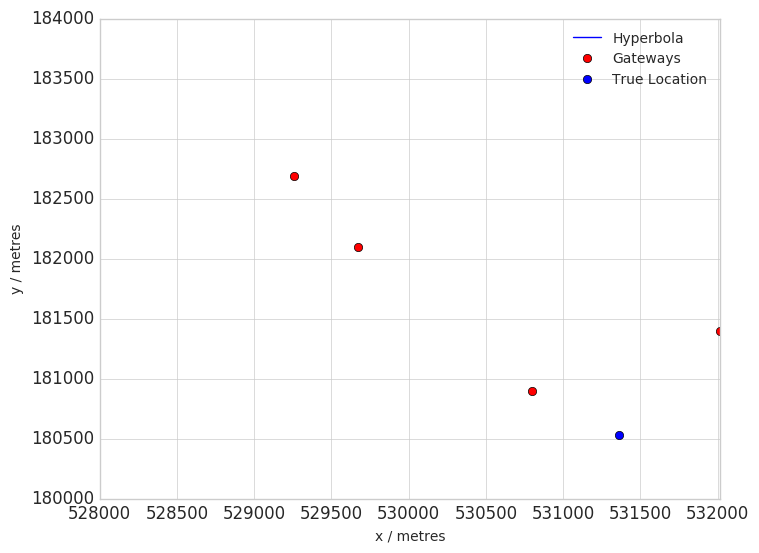

[[  532014.377        181395.869             0.        ]
 [  530796.335        180894.8        -1210003.56846196]
 [  529672.192        182092.231       -928024.14571049]
 [  529256.409        182691.414      -1285126.36313254]]


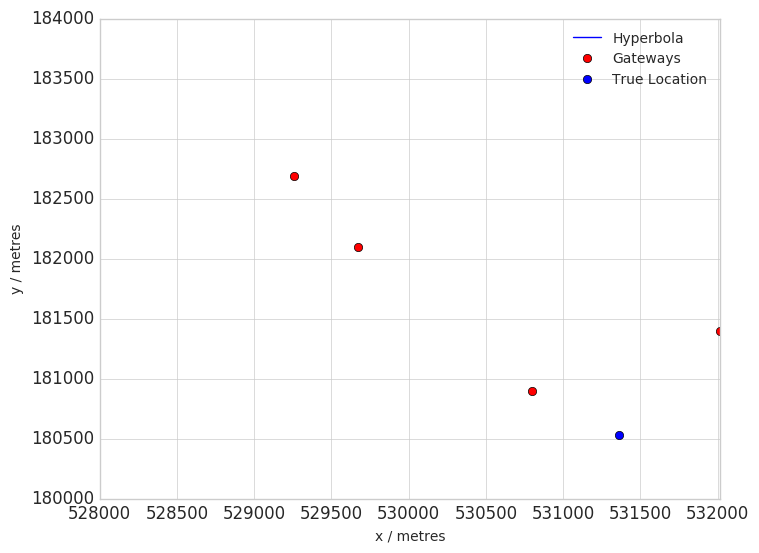

[[ 532014.377       181395.869            0.        ]
 [ 530796.335       180894.8        -598454.12649304]
 [ 530040.568       182751.483      -388216.95858136]
 [ 529672.192       182092.231      -319405.22350791]]


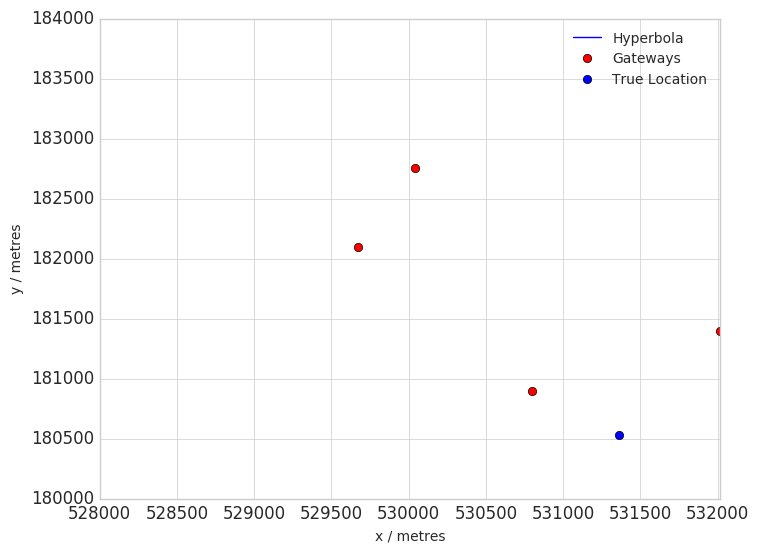

[[ 532014.377       181395.869            0.        ]
 [ 530796.335       180894.8        -541487.68127924]
 [ 530040.539       182752.595      -328820.32624427]
 [ 529256.409       182691.414      -615967.19112307]]


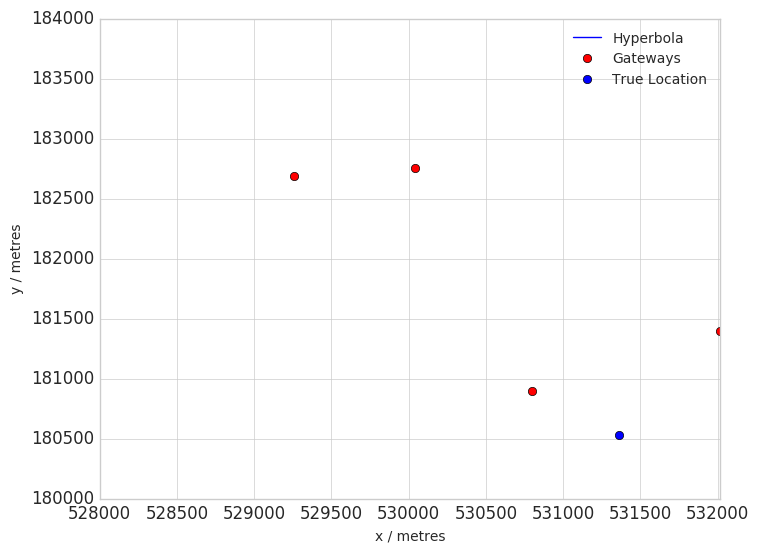

[[  5.30796335e+05   1.80894800e+05   0.00000000e+00]
 [  5.29672886e+05   1.82092248e+05   3.05180189e+01]
 [  5.30040539e+05   1.82752595e+05   1.72920042e+03]
 [  5.29256409e+05   1.82691414e+05   1.69314906e+03]]


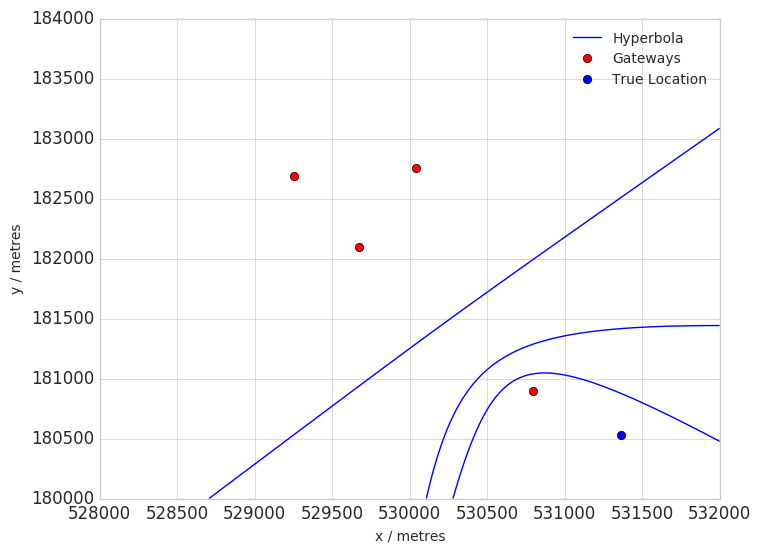

[[ 532014.377       181395.869            0.        ]
 [ 530796.335       180894.8        -131357.86617667]
 [ 530040.539       182752.595        82810.48678741]
 [ 529254.3         182692.473      -203478.66498905]]


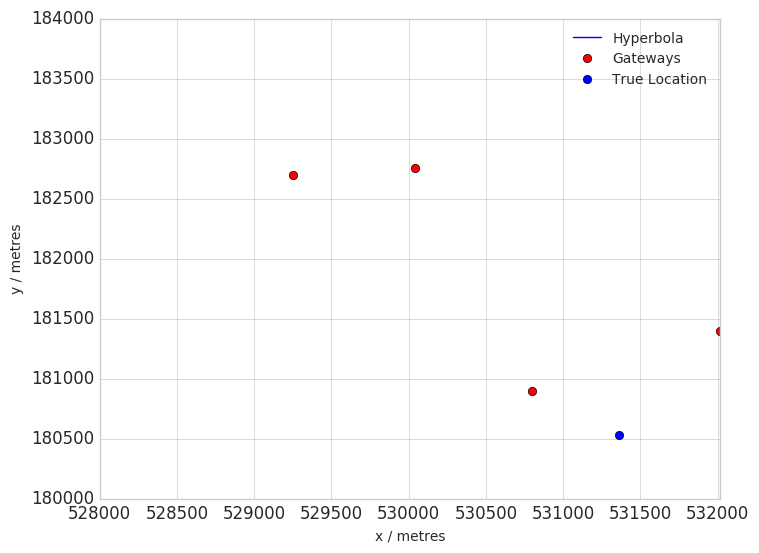

False
False
[[ 530794.948       180894.764            0.        ]
 [ 529673.58        182092.266         2675.13341778]
 [ 530040.539       182752.595         4087.91145422]
 [ 529252.885       182693.55          4051.86009425]]


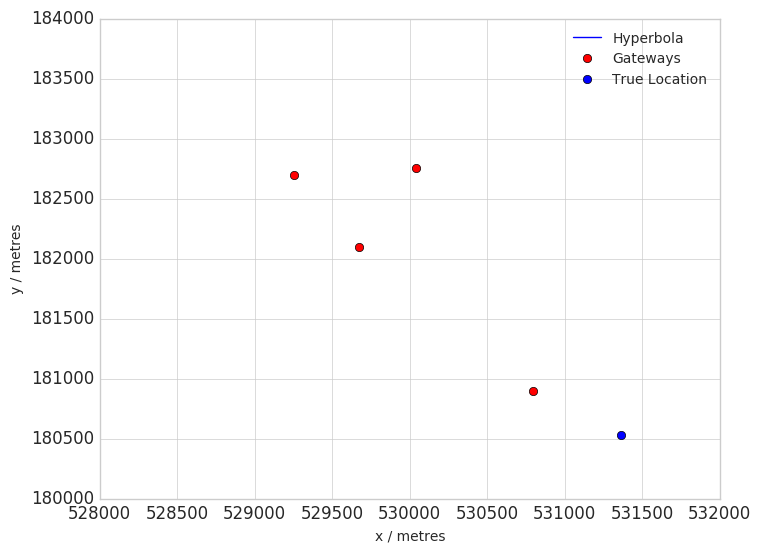

[[ 532014.377       181395.869            0.        ]
 [ 530795.584       180897.006      -151156.74362237]
 [ 529674.217       182094.508       127606.25499532]
 [ 530040.511       182753.707        60581.42221841]]


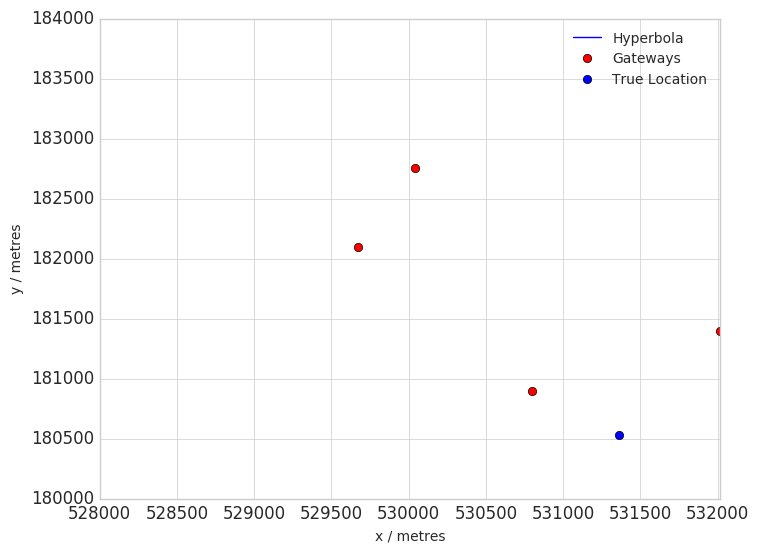

[[ 530795.584       180897.006            0.        ]
 [ 529674.217       182094.508          530.85066193]
 [ 530040.511       182753.707         1371.81996348]
 [ 529252.885       182693.55          4623.66882915]]


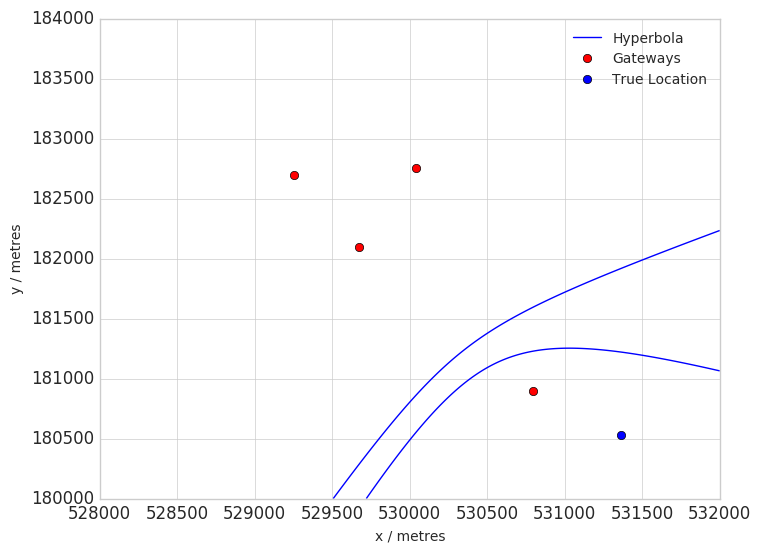

[[ 532014.377       181395.869            0.        ]
 [ 530795.584       180897.006      -297754.20803076]
 [ 529249.388       182694.574      -374663.90499789]
 [ 529674.217       182094.508       -16918.40274909]
 [ 530040.511       182753.707       -84229.13989344]]


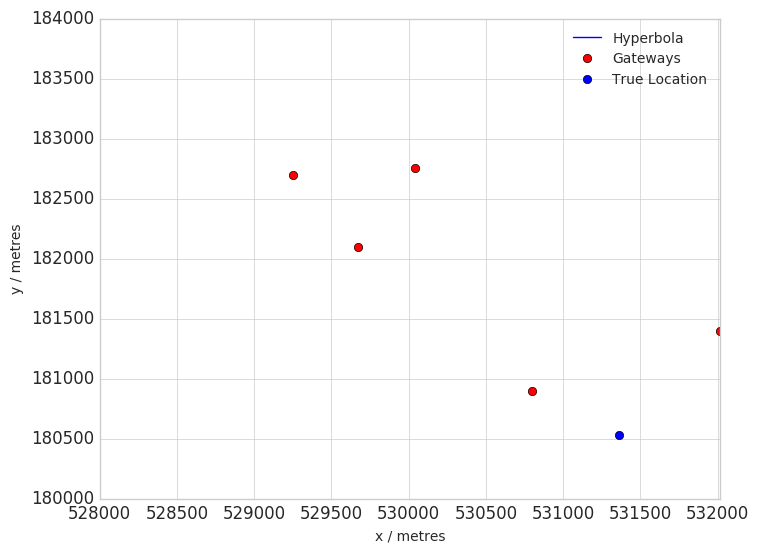

[[ 530795.613       180895.894            0.        ]
 [ 529672.801       182095.584         1817.42031544]
 [ 529249.388       182694.574         1979.05343026]
 [ 530040.454       182755.931         2872.81789257]]


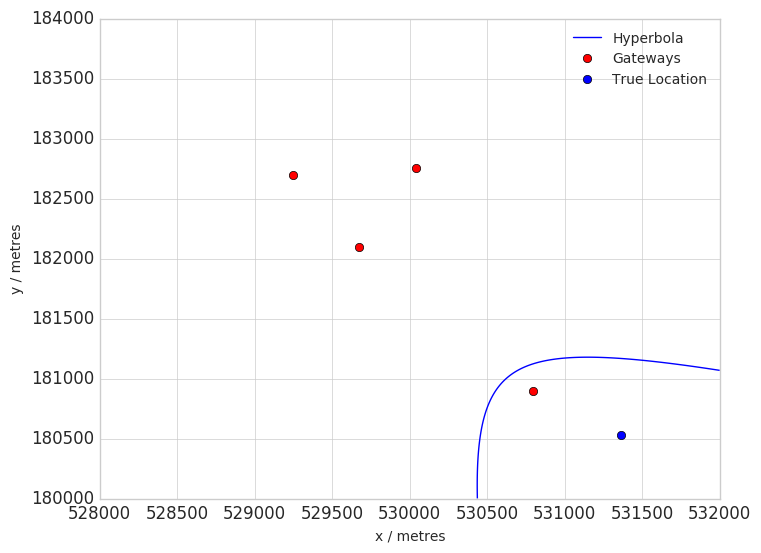

[[ 532014.377       181395.869            0.        ]
 [ 530795.613       180895.894        11308.41317934]
 [ 529249.388       182694.574       -67959.99481922]
 [ 529672.801       182095.584       289785.50742957]]


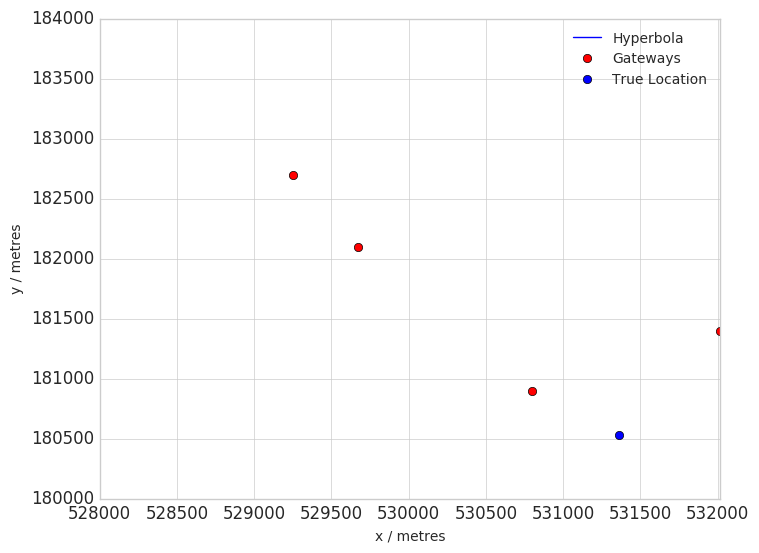

False
[[ 532014.377       181395.869            0.        ]
 [ 530795.613       180895.894      -646128.67976481]
 [ 530042.563       182754.873      -434390.51392403]
 [ 529673.494       182095.602      -365578.77885058]
 [ 529248.029       182693.427      -720608.18960863]]


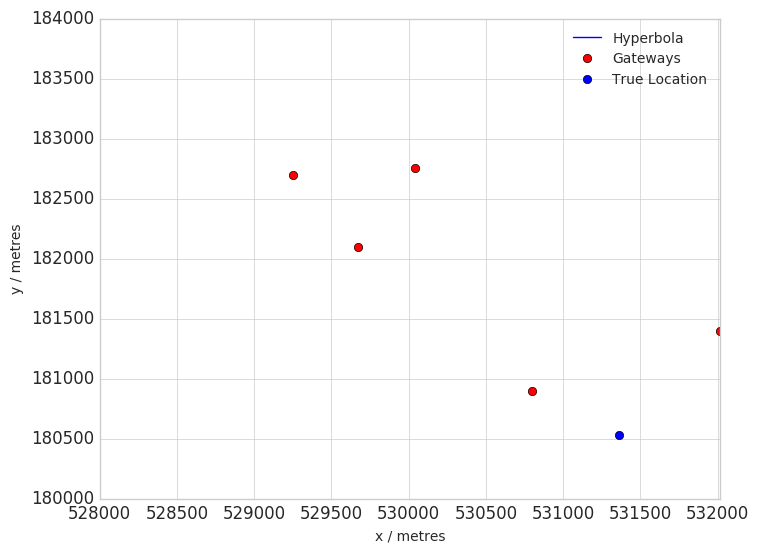

[[ 532014.377       181395.869            0.        ]
 [ 530795.613       180895.894      -965698.28647858]
 [ 530042.563       182754.873      -751815.83788195]]


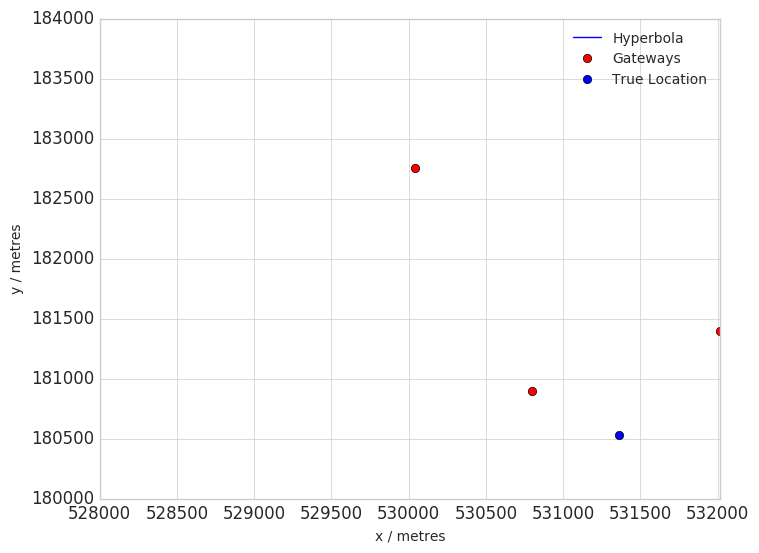

False
False
[[ 532014.377       181395.869            0.        ]
 [ 530797.029       180894.818      -840972.50617987]
 [ 529673.494       182095.602      -561351.79445985]
 [ 530043.285       182753.778      -628662.5316042 ]
 [ 529247.279       182695.633      -917882.20314699]]


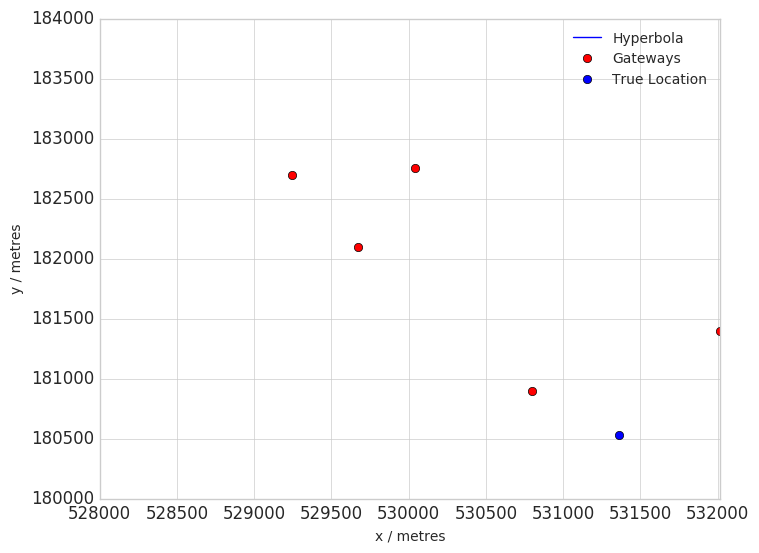

[[ 532014.377       181395.869            0.        ]
 [ 530797.029       180894.818      -711743.73209387]
 [ 530043.285       182753.778      -497646.85522166]
 [ 529247.279       182695.633      -786008.81366211]]


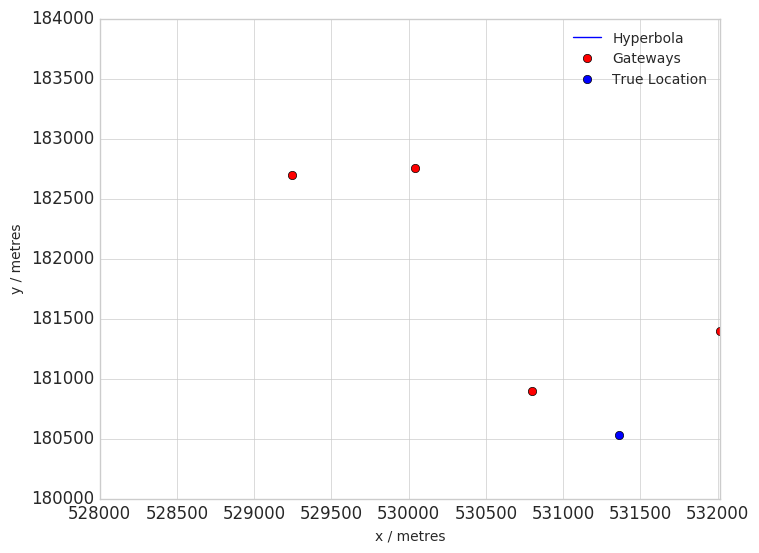

[[ 532014.377       181395.869            0.        ]
 [ 530796.335       180894.8        -685369.0541969 ]
 [ 529673.466       182096.714      -405462.43810942]
 [ 530042.649       182751.536      -471558.08169213]]


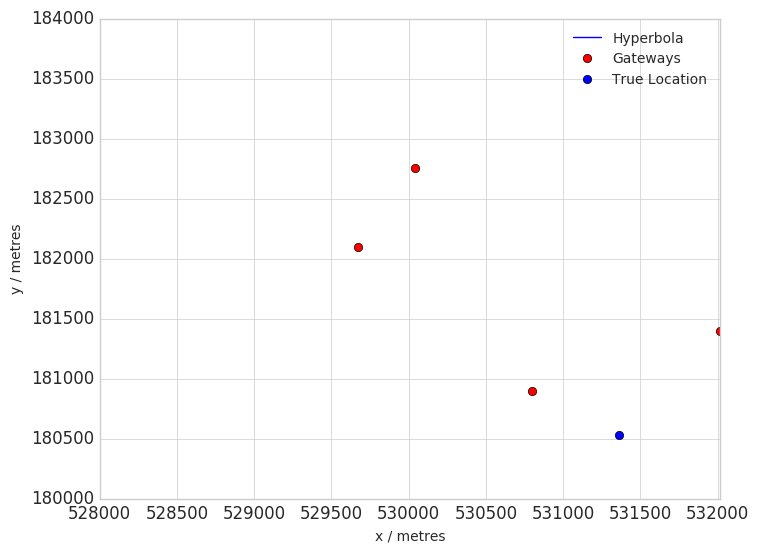

[[ 532014.377       181395.869            0.        ]
 [ 530796.335       180894.8        -481805.1445747 ]
 [ 529673.466       182096.714      -202184.43285468]]


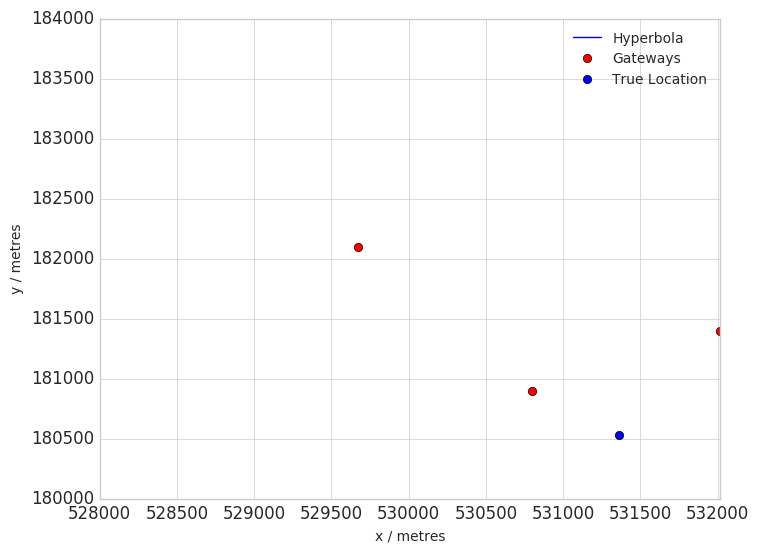

False
[[  532014.377        181395.869             0.        ]
 [  530794.976        180893.652      -1057759.49279648]
 [  530042.649        182751.536       -845949.85086385]
 [  529247.307        182694.521      -1134311.8093043 ]]


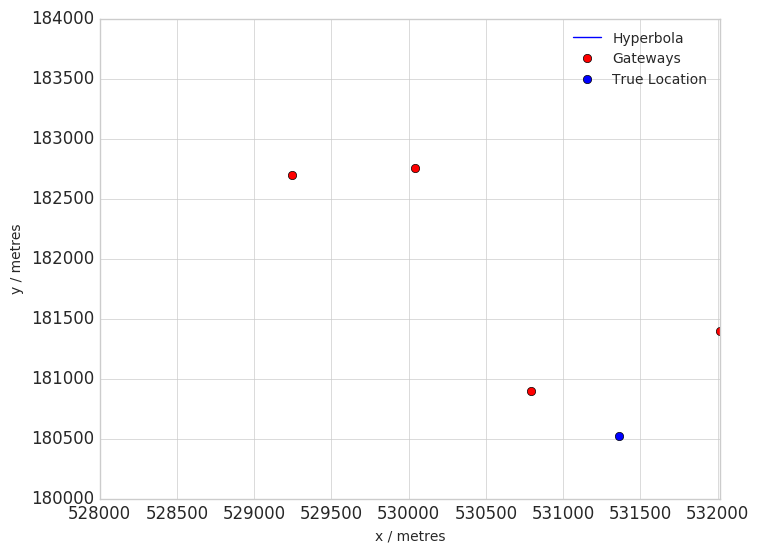

False
[[ 532014.377       181395.869            0.        ]
 [ 530794.976       180893.652       -19855.16287238]
 [ 530042.649       182751.536       191597.09860095]]


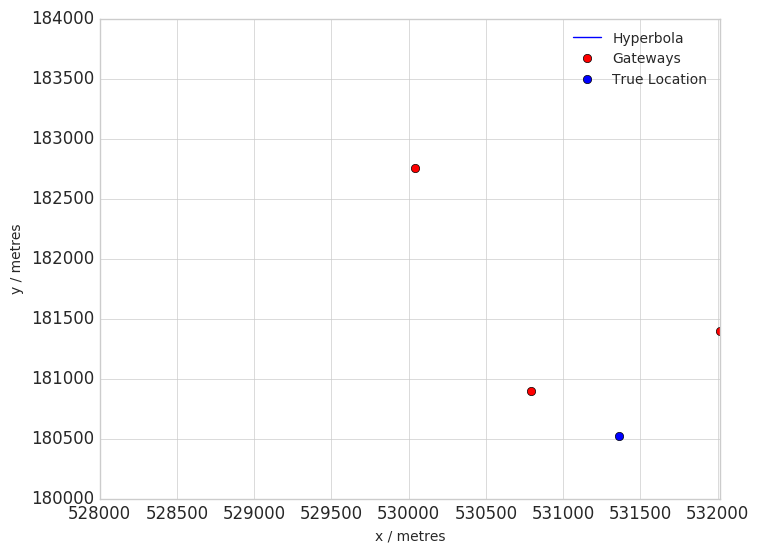

False
False
False
[[ 532014.377       181395.869            0.        ]
 [ 530795.005       180892.54       -862272.38155467]
 [ 530039.209       182750.336      -650248.31134644]
 [ 529248.723       182693.444      -938896.17415434]
 [ 526677.588       179366.216         3742.36779781]]


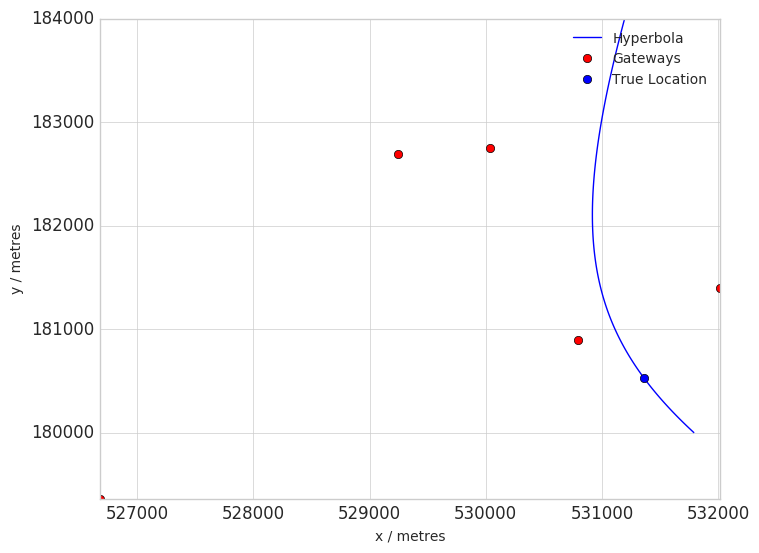

[[ 532014.377       181395.869            0.        ]
 [ 530795.005       180892.54       -444923.48117405]
 [ 530039.209       182750.336      -233185.31533328]]


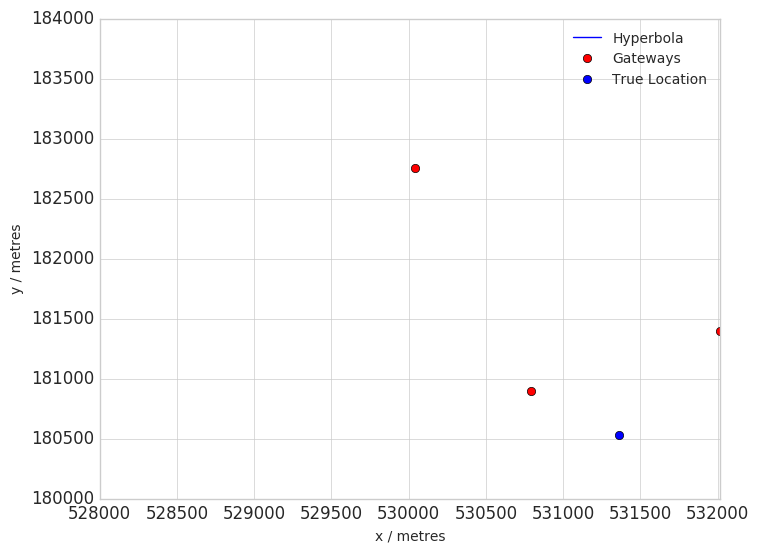

False
False
[[ 532014.377       181395.869            0.        ]
 [ 530795.005       180892.54        -20712.87597472]
 [ 530038.516       182750.318       191883.0029684 ]]


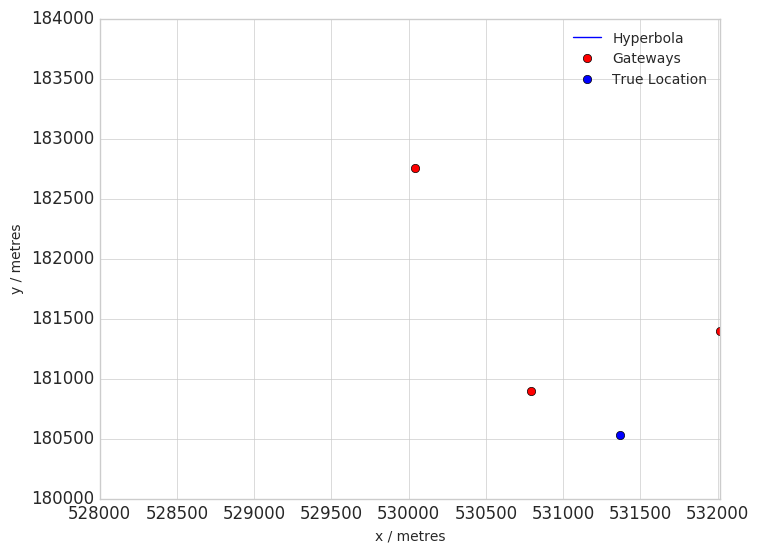

False
False
False
False
[[ 532014.377       181395.869            0.        ]
 [ 530795.005       180892.54       -585588.42995793]
 [ 529672.022       182098.903      -305038.5290437 ]
 [ 530037.822       182750.3        -372921.07492295]]


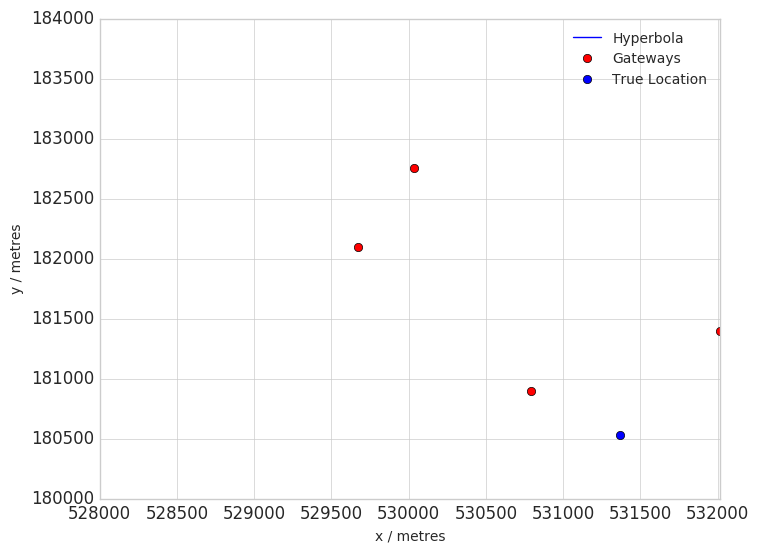

False
False
False
False
[[ 530795.67        180893.67             0.        ]
 [ 529248.723       182693.444         2622.33825702]
 [ 529672.022       182098.903         3890.22697943]]


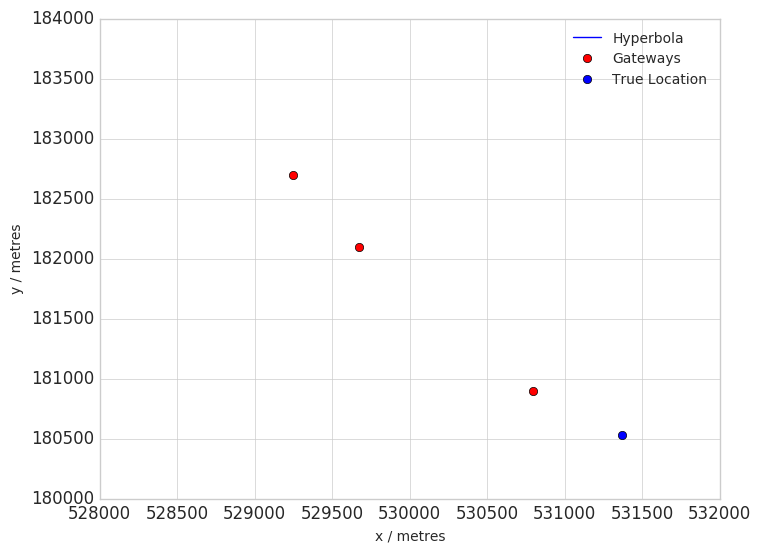

False
False
False
[[ 530793.588       180893.616            0.        ]
 [ 530037.794       182751.412         2515.43743326]
 [ 529249.388       182694.574         2836.76653261]]


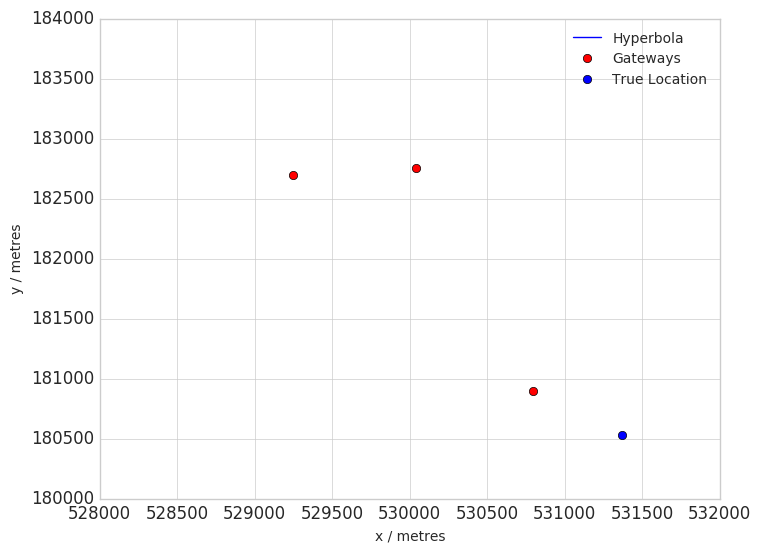

False
False
False
False
False
False
[[  5.30792895e+05   1.80893599e+05   0.00000000e+00]
 [  5.30037794e+05   1.82751412e+05  -5.77018738e+01]
 [  5.29201771e+05   1.81920014e+05   1.05670460e+03]]


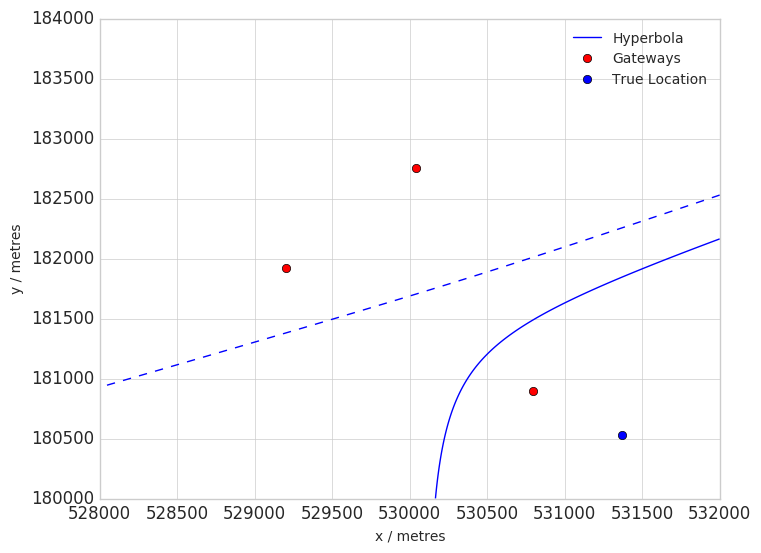

[[ 532014.377       181395.869            0.        ]
 [ 530792.895       180893.599      -331347.97120577]
 [ 530037.794       182751.412      -119252.42490569]]


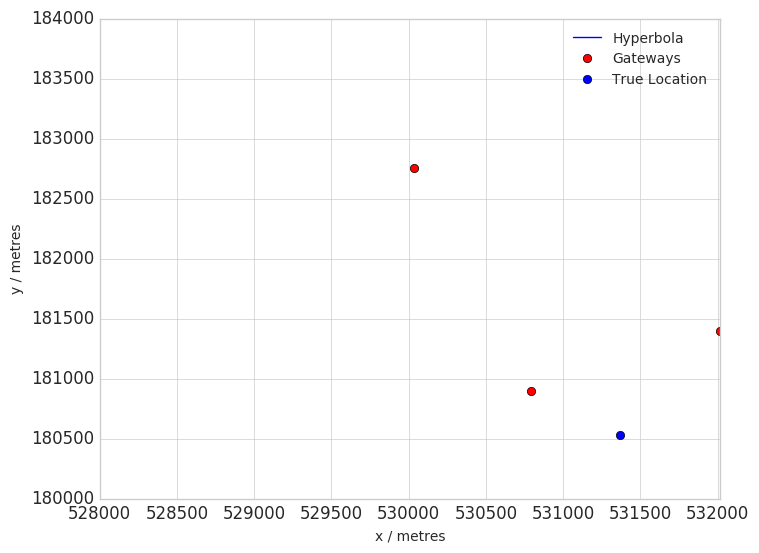

False
[[ 532014.377       181395.869            0.        ]
 [ 530792.895       180893.599      -192541.4008103 ]
 [ 529671.994       182100.015        88294.40447137]
 [ 530035.684       182752.471        21055.14341888]]


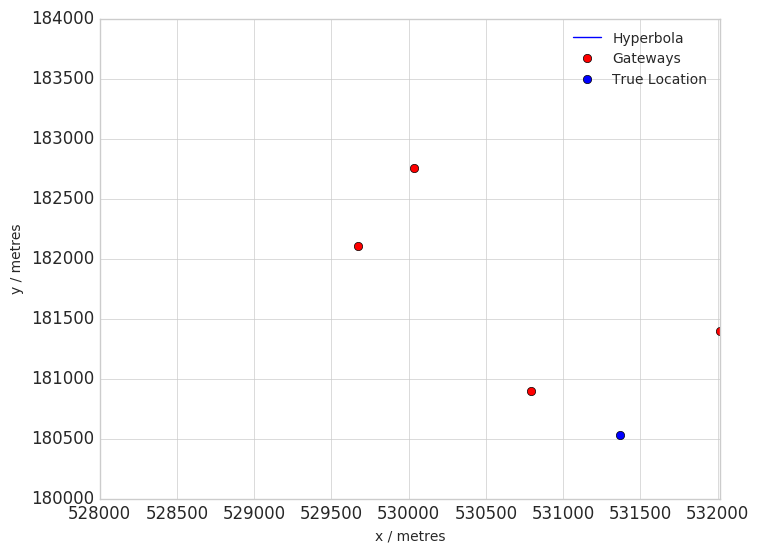

False
False
[[ 532014.377       181395.869            0.        ]
 [ 530793.56        180894.728      -363440.73645169]
 [ 530034.991       182752.453      -151059.28578416]]


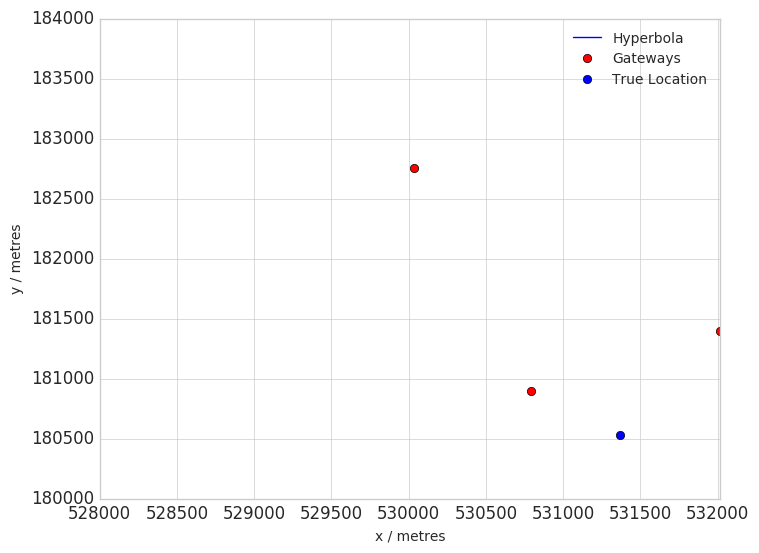

False
False
False
False
[[ 532014.377       181395.869            0.        ]
 [ 530794.196       180896.97       -527692.79554993]
 [ 530035.656       182753.583      -315311.3448824 ]]


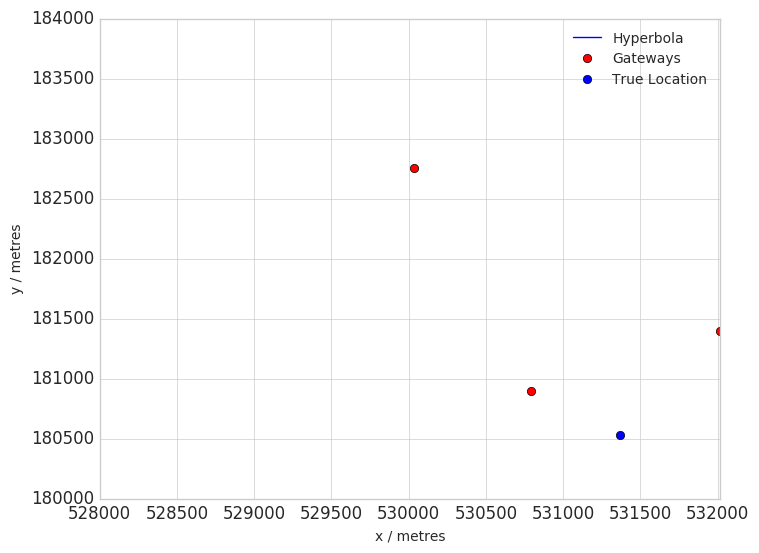

[[ 530794.196       180896.97             0.        ]
 [ 529202.408       181922.255         1914.41770581]
 [ 530035.656       182753.583         1371.81996348]
 [ 529247.279       182695.633         5552.85802335]]


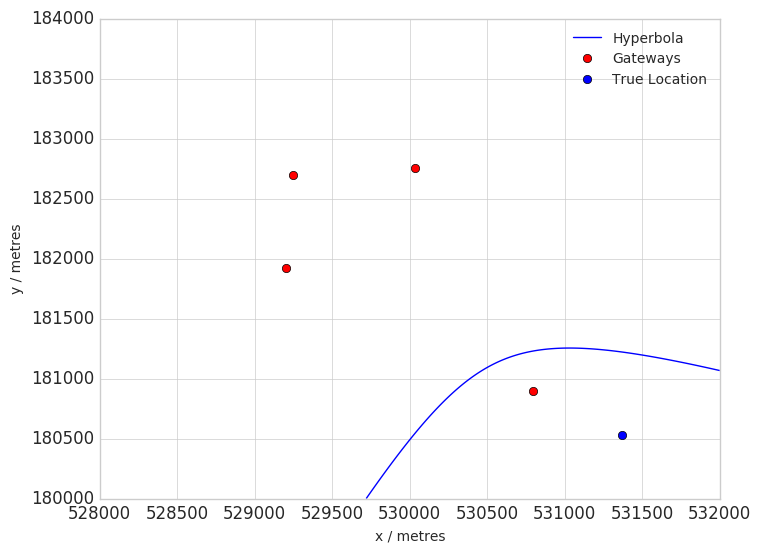

False
[[ 530794.196       180896.97             0.        ]
 [ 529216.283       181922.608         2486.2264407 ]
 [ 530036.378       182752.489         2872.81789257]]


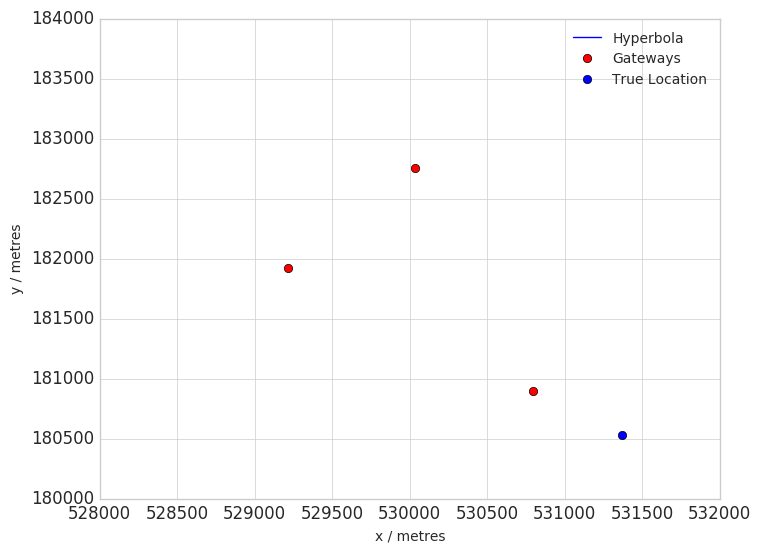

False
False
[[ 532014.377       181395.869            0.        ]
 [ 530794.862       180898.1        -185608.21989972]
 [ 530037.071       182752.506        26129.94594106]
 [ 529245.892       182695.598      -261374.29939705]]


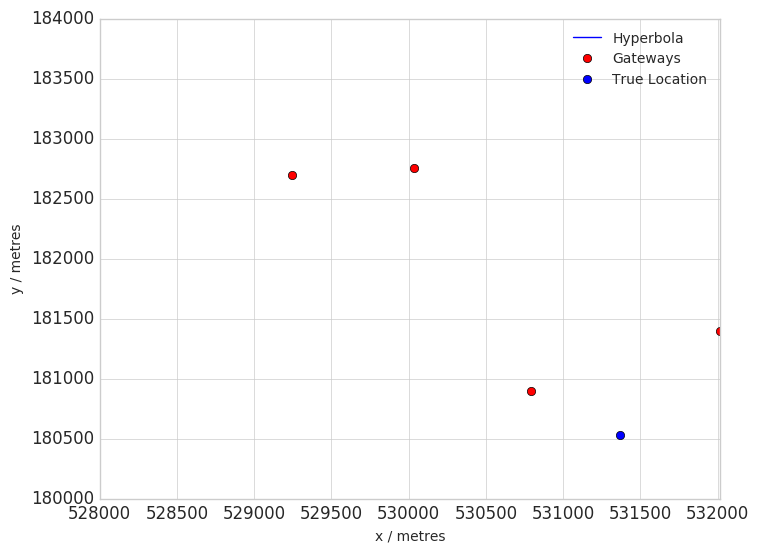

False
[[ 532014.377       181395.869            0.        ]
 [ 530794.862       180898.1        -113989.17585427]
 [ 530037.071       182752.506        98678.17918071]]


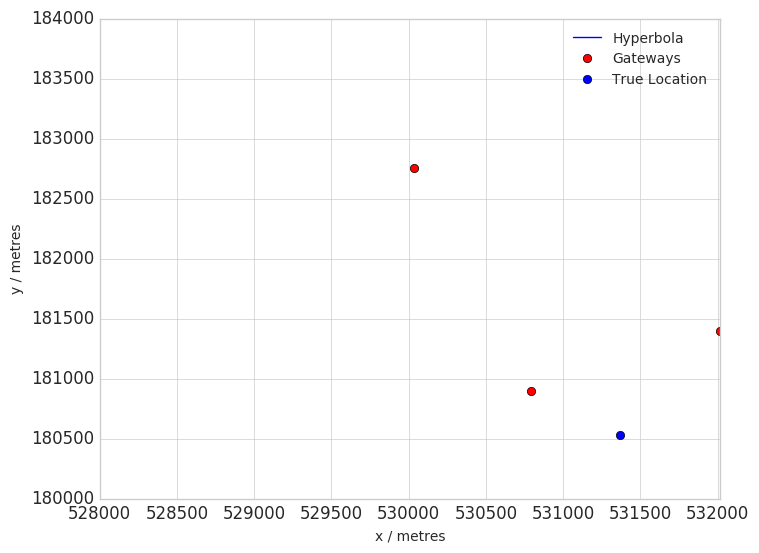

False
[[ 530794.168       180898.082            0.        ]
 [ 530037.043       182753.618         1371.81996348]
 [ 529246.586       182695.615         3480.05135936]]


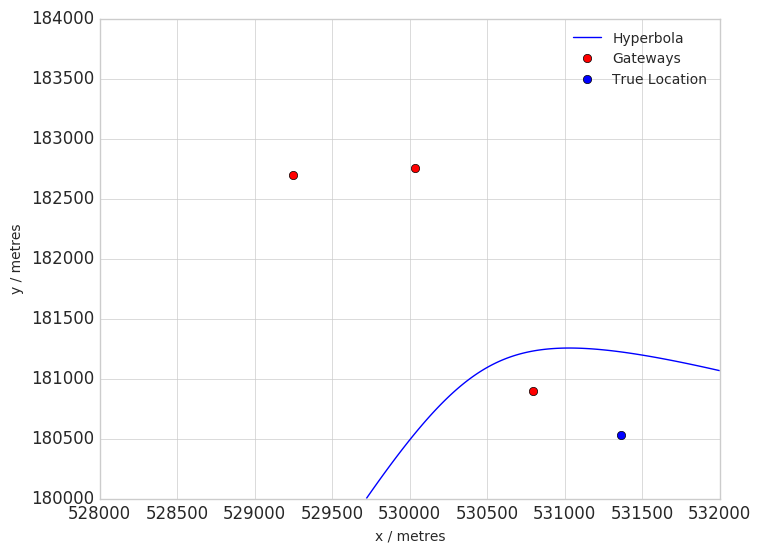

False
False
[[ 530793.474       180898.064            0.        ]
 [ 529194.833       181919.837         1342.60897092]
 [ 530037.043       182753.618         1085.91559603]
 [ 529246.586       182695.615         1407.24469537]]


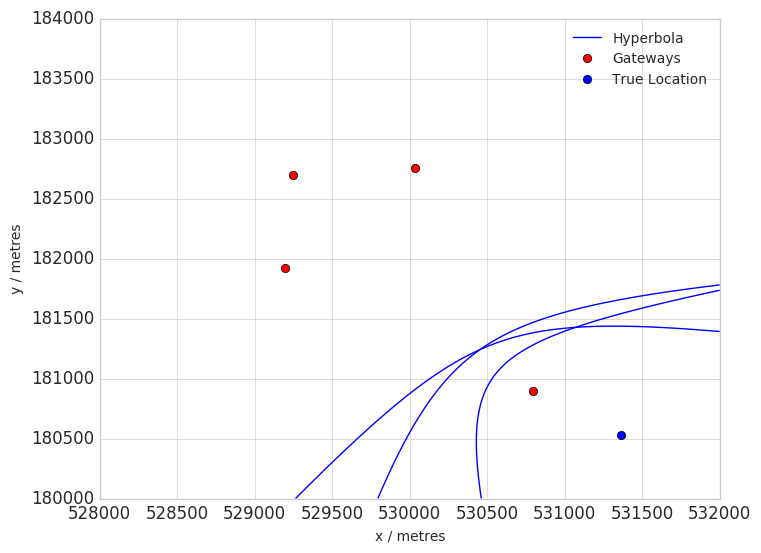

False
False
False
False
False
[[  5.30792751e+05   1.80899159e+05   0.00000000e+00]
 [  5.30037708e+05   1.82754748e+05  -5.77018738e+01]
 [  5.29245892e+05   1.82695598e+05   1.12134033e+03]
 [  5.29667661e+05   1.82106580e+05   2.10332468e+03]]


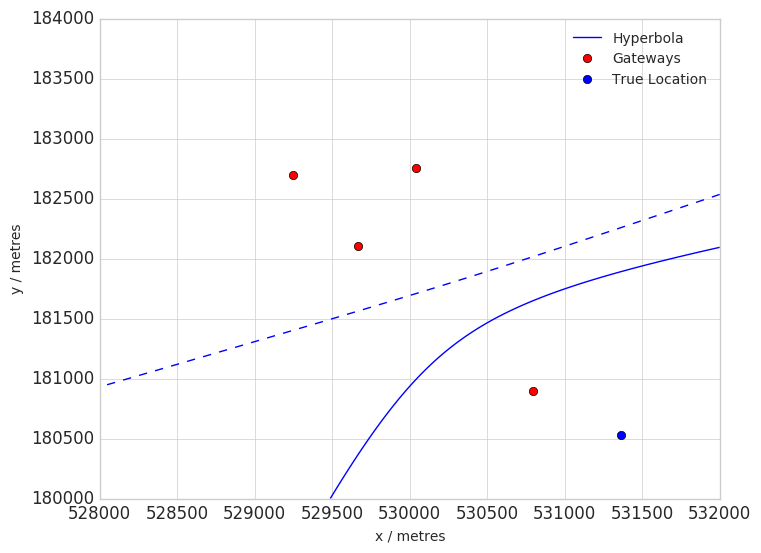

[[ 530792.751       180899.159            0.        ]
 [ 530037.708       182754.748         2015.10479023]
 [ 529194.89        181917.613         2843.60690001]]


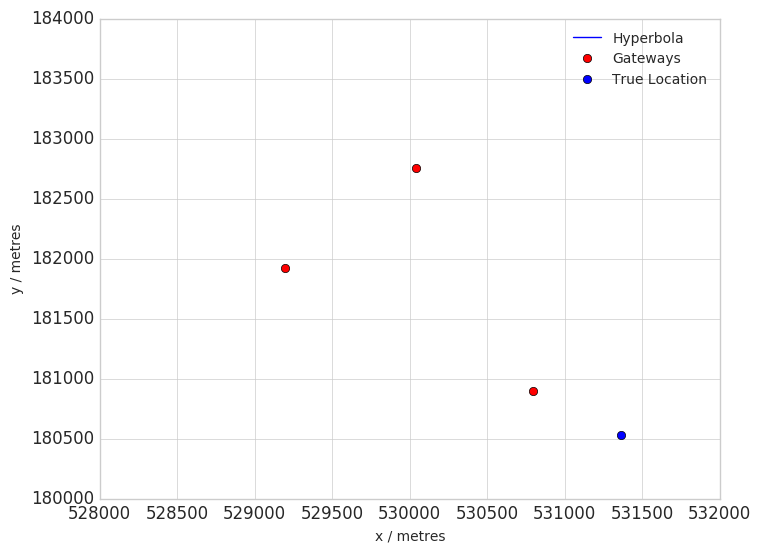

False
False
False
[[  5.30791392e+05   1.80898011e+05   0.00000000e+00]
 [  5.30037100e+05   1.82751394e+05   2.28202494e+02]
 [  5.29197721e+05   1.81915460e+05   1.62851334e+03]
 [  5.29666996e+05   1.82105451e+05   1.17413549e+03]
 [  5.29244505e+05   1.82695562e+05   1.12134033e+03]]


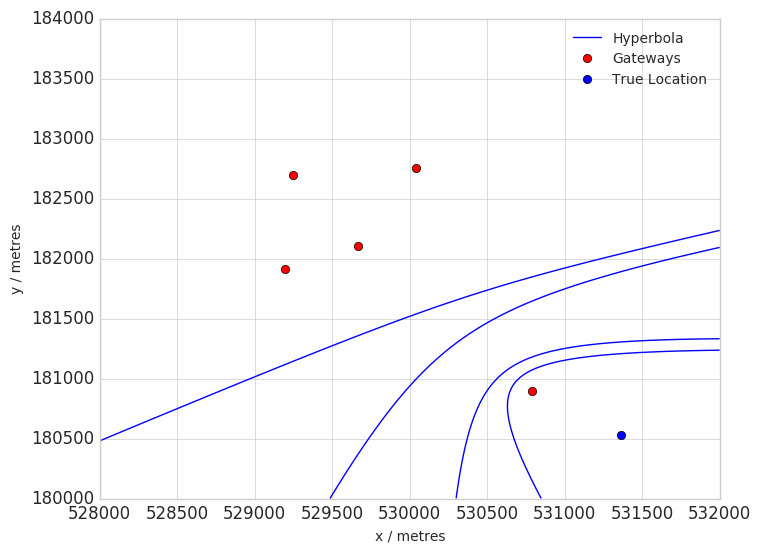

[[  5.30791392e+05   1.80898011e+05   0.00000000e+00]
 [  5.30037100e+05   1.82751394e+05  -1.29177966e+02]
 [  5.29197721e+05   1.81915460e+05   1.91441771e+03]]


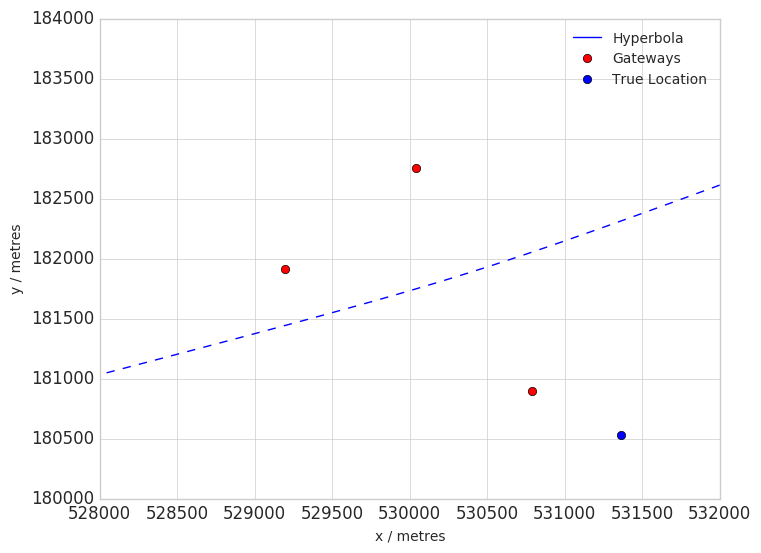

False
[[  5.30037794e+05   1.82751412e+05   0.00000000e+00]
 [  5.30791392e+05   1.80898011e+05   9.86891068e+02]
 [  5.29244505e+05   1.82695562e+05   4.17518620e+02]]


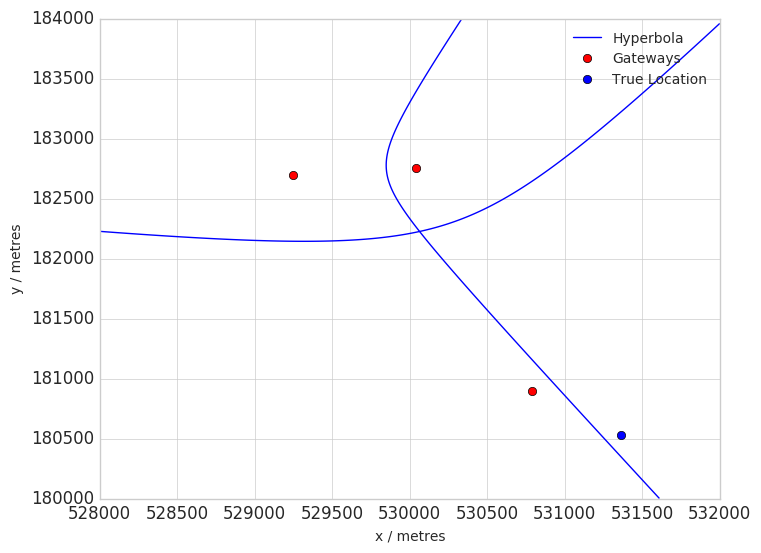

False
False
False
False
False
False
False
False
[[ 532014.377       181395.869            0.        ]
 [ 530790.698       180897.993       -72890.42303378]
 [ 530037.1         182751.394       139419.55154189]
 [ 529242.396       182696.621      -148299.1220718 ]]


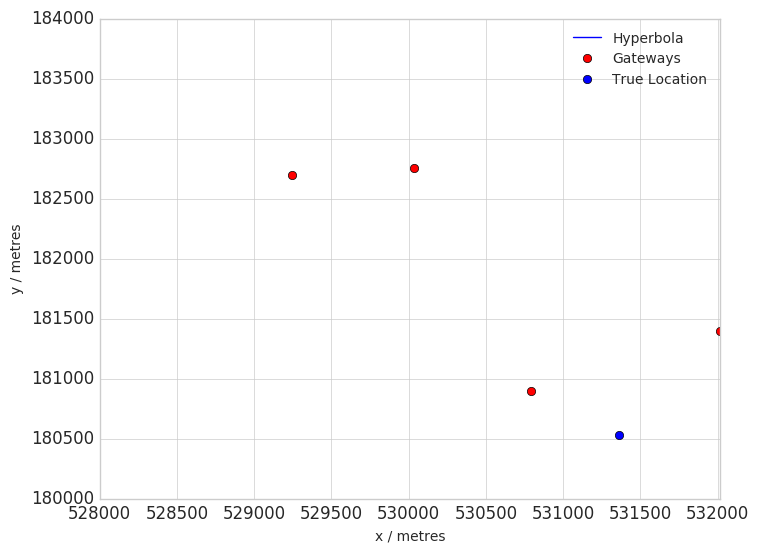

False
False
False
False
False
[[ 530790.698       180897.993            0.        ]
 [ 529217.005       181921.514         1914.41770581]
 [ 529245.552       182708.942         1621.67297096]]


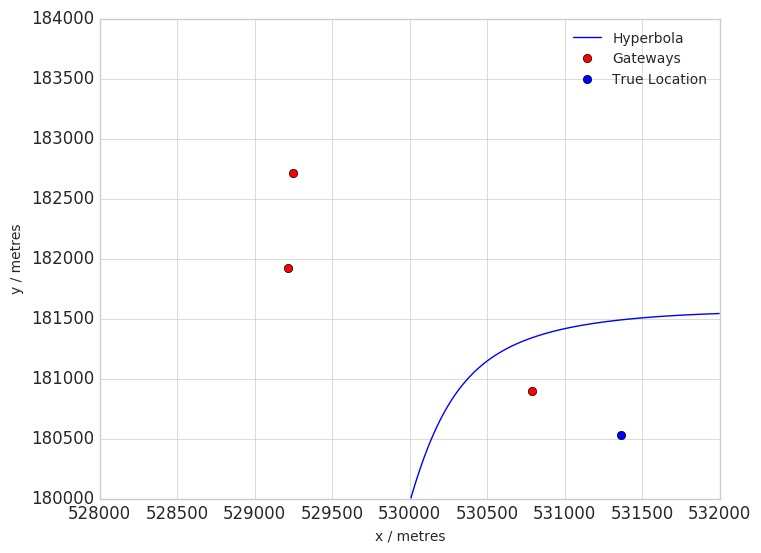

[[ 530790.698       180897.993            0.        ]
 [ 530037.1         182751.394          800.01122858]
 [ 529245.552       182708.942         1693.14906282]]


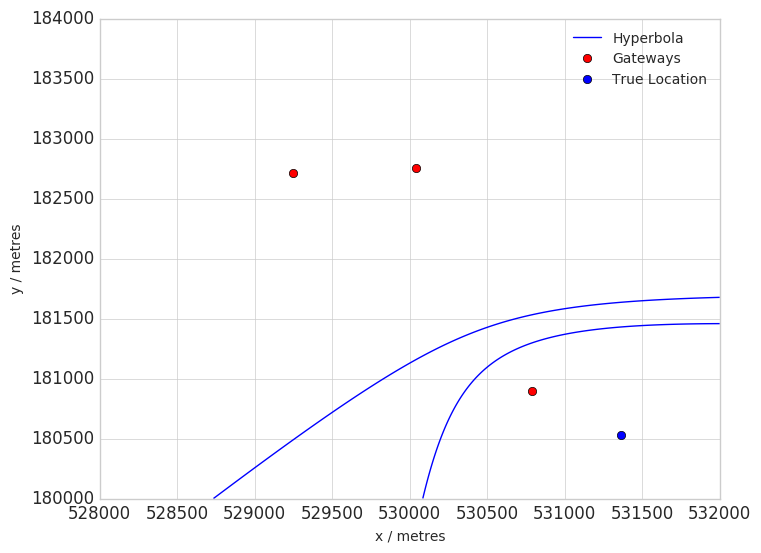

[[ 530790.698       180897.993            0.        ]
 [ 529245.552       182708.942         1693.14906282]
 [ 530037.1         182751.394         2586.91352513]]


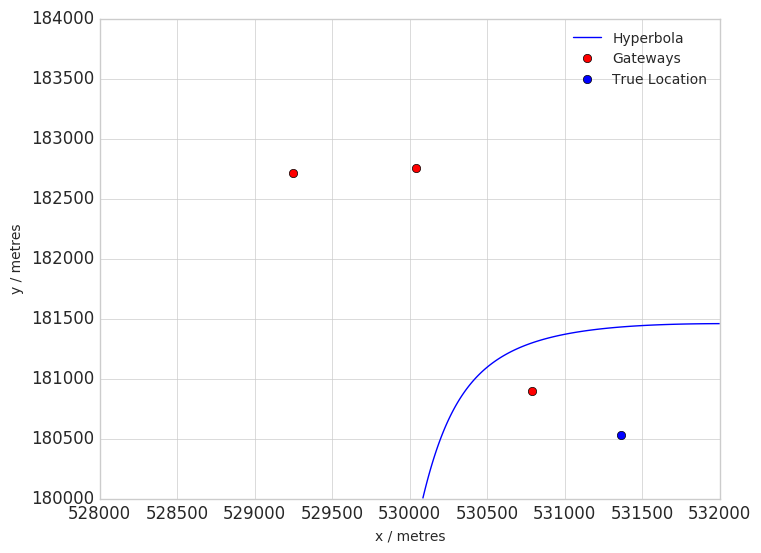

False
False
False
[[ 530790.641       180900.217            0.        ]
 [ 530037.1         182751.394         1371.81996348]
 [ 529246.303       182706.735         4337.7644617 ]]


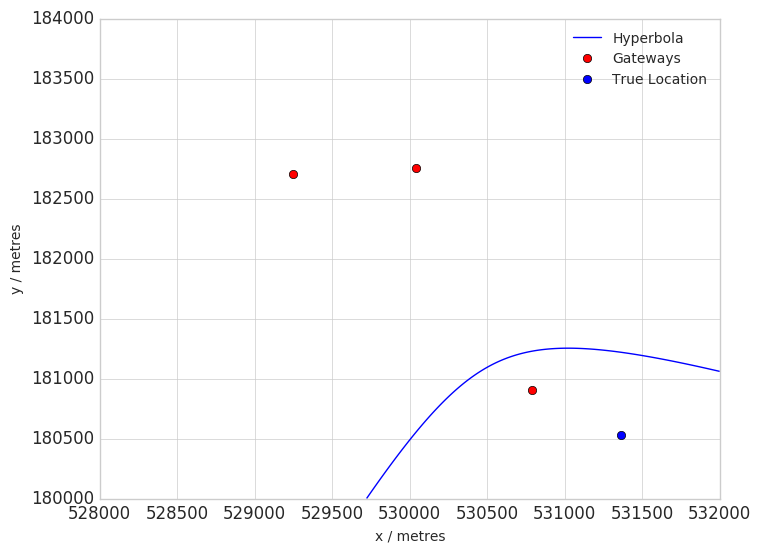

False
False
[[ 530788.56        180900.163            0.        ]
 [ 530037.794       182751.412         2301.00915768]
 [ 529246.331       182705.623         4409.24055356]]


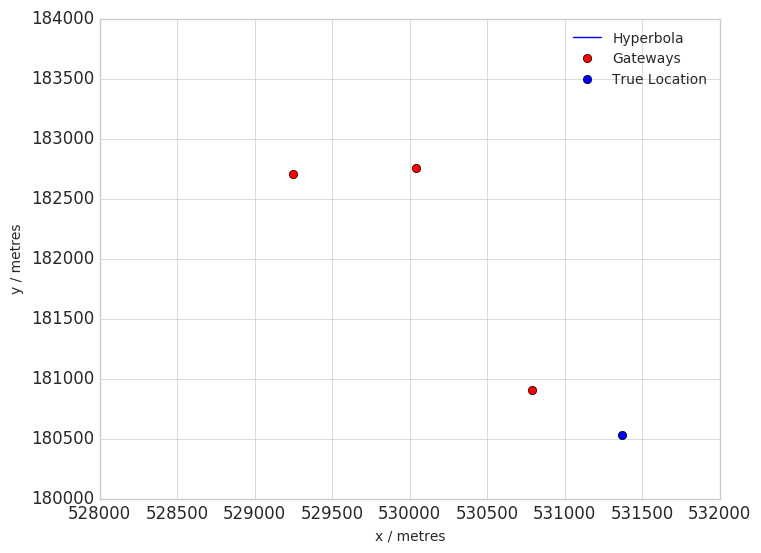

False
[[ 530788.56        180900.163            0.        ]
 [ 530037.794       182751.412         1371.81996348]
 [ 529664.943       182104.286         3032.51387709]]


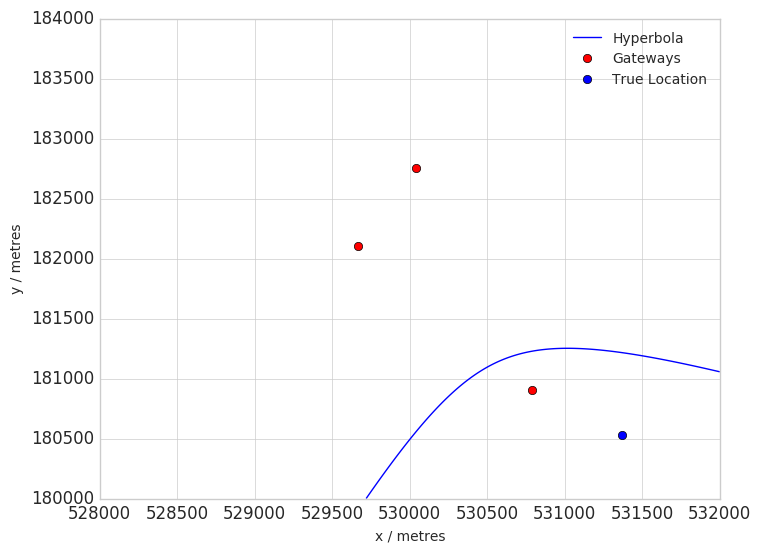

[[  5.30787952e+05   1.80896810e+05   0.00000000e+00]
 [  5.29664249e+05   1.82104268e+05   2.44946294e+02]
 [  5.29246359e+05   1.82704511e+05   4.33776446e+03]]


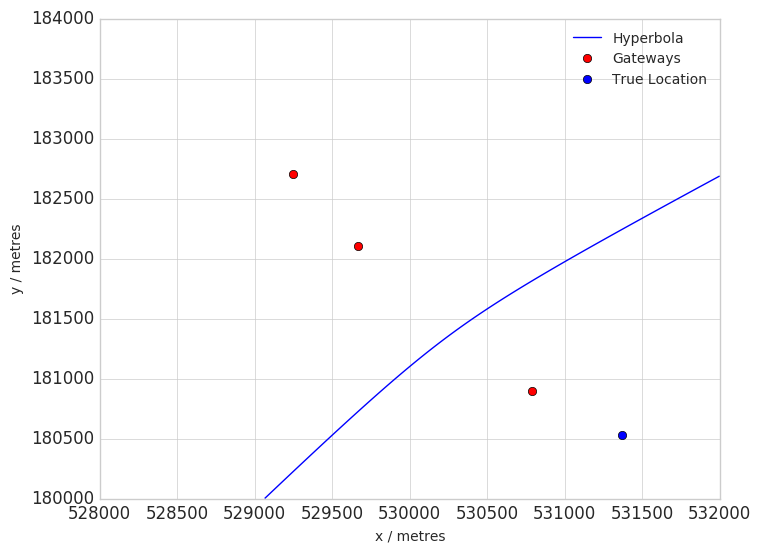

False
[[ 530787.952       180896.81             0.        ]
 [ 529198.826       181926.615         1271.13287905]
 [ 529664.249       182104.268          602.32675379]]


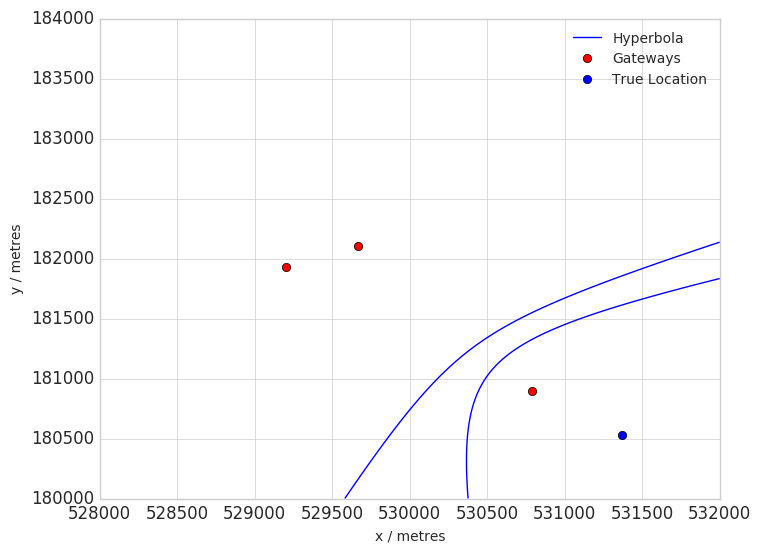

False
False
[[ 530787.952       180896.81             0.        ]
 [ 530035.713       182751.359         1085.91559603]
 [ 529662.862       182104.233         2675.13341778]]


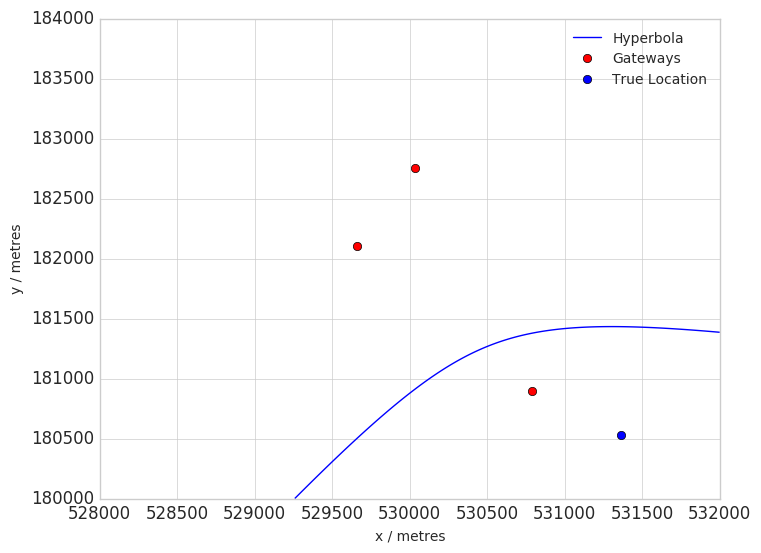

[[  5.30788645e+05   1.80896827e+05   0.00000000e+00]
 [  5.30035713e+05   1.82751359e+05   5.14106861e+02]
 [  5.29246359e+05   1.82704511e+05   1.97905343e+03]]


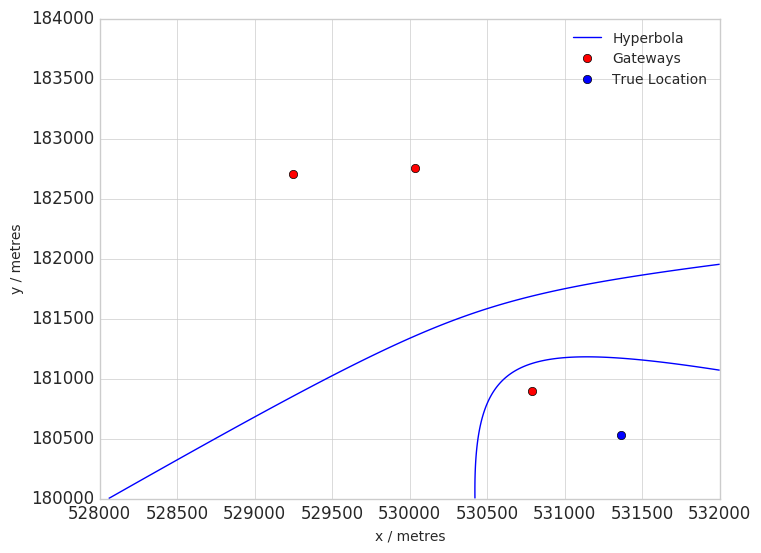

False
[[  5.29190658e+05   1.81947549e+05   0.00000000e+00]
 [  5.30035713e+05   1.82751359e+05   1.33540861e+02]
 [  5.30788645e+05   1.80896827e+05  -4.13419777e+02]
 [  5.29662862e+05   1.82104233e+05   3.14454414e+03]]


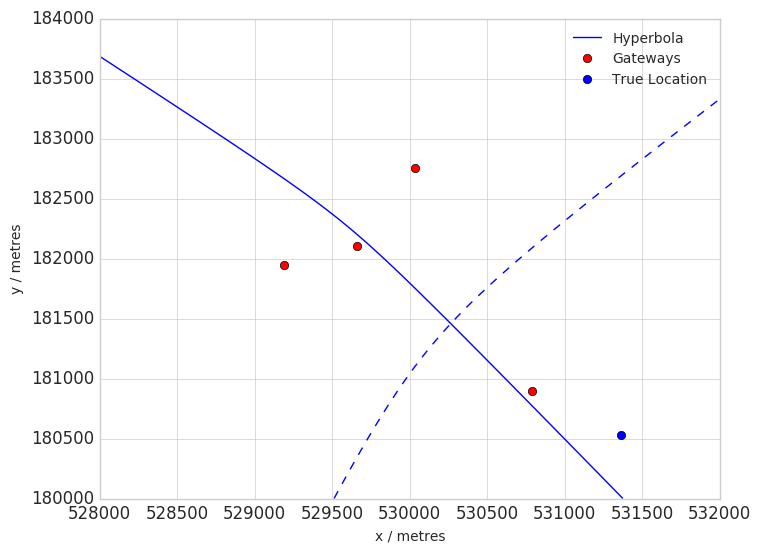

False
False
False
False
False
[[  5.30788645e+05   1.80896827e+05   0.00000000e+00]
 [  5.29245085e+05   1.82700028e+05  -9.37532337e+01]
 [  5.30034325e+05   1.82751323e+05   1.08591560e+03]
 [  5.29173271e+05   1.81921514e+05   2.20032207e+03]]


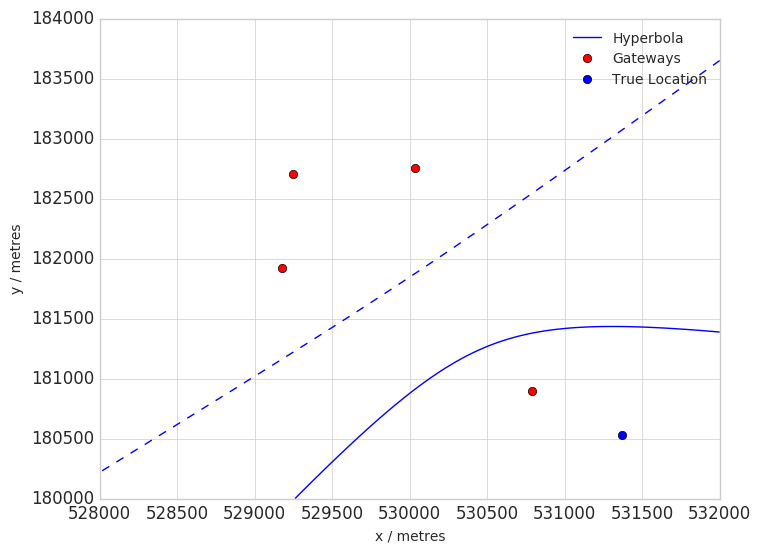

False
False
False


In [310]:
i = 608
#i = 2
for packet in data:
    D = TDOAs_2D_Offsets(packet['gateways'], offsets)
    print D
    if D is not False:
        A = convert_bng(packet['payload']['lon'], packet['payload']['lat'])
        plotTDOA(D,A)

In [338]:
range(1,4)

[1, 2, 3]

In [361]:
errors = []
for packet in data:
    D = TDOAs_2D_Offsets(packet['gateways'], offsets)
    if D is not False:
        n = len(D[:,0])
        res = []
        for i in range(1,n):
            for j in range(i,n):
                if i != j:       
                    res.append(Chan_for3(D[(0,i,j),:]))
        if res:
            A = convert_bng(packet['payload']['lon'], packet['payload']['lat'])
            errs = []
            for pos in res:
                if pos:
                    for bla in pos:
                        print bla[0]
                        errs.append(distance2D(bla[0][0],bla[0][1],A[0][0],A[1][0]))
                    errors.append(min(errs))
            #plotTDOA(D,A)

[ 529934.6424491   182362.38741073]
[ 529560.99924847  182769.48874342]
[ 529637.67849888  182749.78316619]
[ 529709.97359282  183138.11282115]
[ 529904.64385034  182542.20348723]
[ 530018.42397726  181998.09975353]
[ 527884.42092014  183415.61775711]
[ 529857.71547018  182402.12342049]
[ 529322.37651418  182036.10331327]
[ 529745.70139275  181060.66723999]
[ 529680.12227134  182131.49984456]
[ 529747.58510582  180973.66853468]
[ 529678.03844494  182133.19321337]
[ 529568.14938098  182672.11552315]
[ 529647.37693505  181697.55581117]
[ 529737.22373493  181215.33443993]
[ 529679.52664765  182137.81344751]
[ 529829.60171533  181706.63784065]
[ 530070.39907888  182001.2581383 ]
[ 529650.64585207  182128.84230081]
[ 529720.78492788  181101.44902687]
[ 529671.86568786  182139.40895281]
[ 529188.6965825   179884.42072486]
[ 521100.0444898  186109.0565735]
[ 529819.04760143  177374.96293107]
[ 910499.81056929  -24196.97563171]
[ 678218.98719835  586512.79784966]
[ 641990.75818196  487673.1201

In [362]:
errors

[1355.1494215432651,
 902.9102530971439,
 672.6292156393603,
 310.90057146570047,
 416.79685651541274,
 858.5866973167359,
 2024.6438452483312,
 232.77459560043476,
 232.77459560043476,
 464.9721886196775,
 299.96408816884826,
 934.0356314579166,
 253.89467019579263,
 433.4203371113684,
 162.10124116243404,
 611.3632206468642,
 594.5327945424,
 113.52009197856701,
 11370.643505248168,
 3509.9613811603185,
 430878.93378838367,
 324090.53366227826,
 324090.53366227826,
 940.9691727871559,
 940.9691727871559,
 940.9691727871559,
 14235.751816083226,
 2134.3610579502683,
 1440.150074163009]

In [363]:
print np.mean(errors)
print np.median(errors)
print np.std(errors)

38808.5774752
902.910253097
110236.893666


In [364]:
len(errors)/170.0

0.17058823529411765

In [365]:
len(errors)/float(len(data))

0.044753086419753084

In [366]:
errors_2 = []
for val in errors:
    if val < 5000:
        errors_2.append(val)
print np.mean(errors_2)
print np.median(errors_2)
print np.std(errors_2)
len(errors_2)/170.0

865.931264481
641.996218143
767.193520857


0.1411764705882353

# Oxo Tower - oversampling

In [37]:
## i=26520 -> data[495]
lat = 51.509
lon = -0.1084
realx, realy = convert_bng(lon, lat)
realx, realy = realx[0], realy[0]

oxoGateways = {}
for packet in data[495:]:
    for gw in packet['gateways']:
        x,y = convert_bng(gw['lon'], gw['lat'])
        oxoGateways[gw['addr']] = {
            'x': x[0],
            'y': y[0]
        }
        
for addr,gw in oxoGateways.iteritems():
    gw['real_distance'] = distance2D(realx,realy,gw['x'],gw['y'])

len(oxoGateways)

7

In [1039]:
oxoGateways

{u'70b3d54b109e0000': {'real_distance': 2566.352766780581,
  'x': 529173.271,
  'y': 181921.514},
 u'70b3d54b110f0000': {'real_distance': 2537.9644954233017,
  'x': 530034.325,
  'y': 182751.323},
 u'70b3d54b11440000': {'real_distance': 654.4255275590896,
  'x': 530789.339,
  'y': 180896.845},
 u'70b3d54b12330000': {'real_distance': 4849.60515838434,
  'x': 526676.922,
  'y': 179365.087},
 u'70b3d54b12600000': {'real_distance': 2991.9088747544215,
  'x': 529245.085,
  'y': 182700.028},
 u'70b3d54b13410000': {'real_distance': 1030.7694308937237,
  'x': 532014.377,
  'y': 181395.869},
 u'70b3d54b13830000': {'real_distance': 2279.3148377984685,
  'x': 529662.862,
  'y': 182104.233}}

In [202]:
timediffs = {}

for packet in data[495:]:
    
    for gw1 in packet['gateways']:
        if gw1['addr'] not in timediffs:
            timediffs[gw1['addr']] = {}
            
        for gw2 in packet['gateways']:
            if gw1 is gw2:
                continue
            
            if gw2['addr'] not in timediffs[gw1['addr']]:
                timediffs[gw1['addr']][gw2['addr']] = []
            
            diff = gw2['time'] - gw1['time']
            timediffs[gw1['addr']][gw2['addr']].append(diff)
            

In [203]:
timediffs

{u'70b3d54b109e0000': {u'70b3d54b110f0000': [4.0531158447265625e-06,
   -9.5367431640625e-07,
   9.5367431640625e-07,
   4.0531158447265625e-06,
   1.9073486328125e-06,
   0.0,
   -1.9073486328125e-06,
   -4.0531158447265625e-06,
   0.0,
   -9.5367431640625e-07],
  u'70b3d54b11440000': [-8.106231689453125e-06,
   -2.1457672119140625e-06,
   -5.0067901611328125e-06,
   -6.9141387939453125e-06,
   -3.0994415283203125e-06,
   -8.106231689453125e-06,
   -4.0531158447265625e-06,
   -5.0067901611328125e-06,
   -5.0067901611328125e-06,
   -2.86102294921875e-06,
   0.0,
   -5.9604644775390625e-06],
  u'70b3d54b12600000': [1.6927719116210938e-05,
   5.0067901611328125e-06,
   3.0994415283203125e-06,
   3.814697265625e-06,
   -2.86102294921875e-06],
  u'70b3d54b13410000': [-0.06191205978393555,
   -0.06362605094909668,
   -0.06157112121582031,
   -0.062007904052734375],
  u'70b3d54b13830000': [1.9073486328125e-06,
   1.1920928955078125e-06,
   8.821487426757812e-06]},
 u'70b3d54b110f0000': {u'70

In [18]:
def reject_outliers(data, m = 2.):
    if len(data) < 2:
        return data
    data2 = np.array(data)
    d = np.abs(data2 - np.median(data2))
    mdev = np.median(d)
    s = d/mdev if mdev else 0.
    return data2[s<m]

In [19]:
def timediff_stats_no(reject = False, m=2.):
    timediffs_no = {}
    for gw1,vals1 in timediffs.iteritems():
        if gw1 not in timediffs_no:
            timediffs_no[gw1] = {}

        for gw2,vals2 in vals1.iteritems():
            
            if len(vals2) < 10:
                continue
                
            if reject:
                vals2 = reject_outliers(vals2,m)

            if gw2 not in timediffs_no[gw1]:
                timediffs_no[gw1][gw2] = {}
                
            timediffs_no[gw1][gw2]['mean'] = np.mean(vals2)
            timediffs_no[gw1][gw2]['median'] = np.median(vals2)
            timediffs_no[gw1][gw2]['std'] = np.std(vals2)
            
    return timediffs_no

In [20]:
timediff_stats = timediff_stats_no(reject = True, m=2)
timediff_stats_no_list = []
for gw1,vals1 in timediff_stats.iteritems():
    for gw2,vals2 in vals1.iteritems():
        vals2['gw1'] = gw1
        vals2['gw2'] = gw2
        timediff_stats_no_list.append(vals2)
df = pd.DataFrame(timediff_stats_no_list)

In [16]:
df

,gw1,gw2,mean,median,std
0,70b3d54b12600000,70b3d54b13830000,2.418246e-06,0.000003,0.000003
1,70b3d54b12600000,70b3d54b11440000,1.241659e-05,0.000012,0.000004
2,70b3d54b12600000,70b3d54b13410000,6.031429e-02,0.060347,0.001684
3,70b3d54b12600000,70b3d54b110f0000,4.549821e-06,0.000005,0.000003
4,70b3d54b11440000,70b3d54b12600000,-1.241659e-05,-0.000012,0.000004
5,70b3d54b11440000,70b3d54b13830000,-7.619029e-06,-0.000008,0.000002
6,70b3d54b11440000,70b3d54b109e0000,-5.115162e-06,-0.000005,0.000002
7,70b3d54b11440000,70b3d54b13410000,6.010760e-02,0.059996,0.001512
8,70b3d54b11440000,70b3d54b110f0000,-7.643757e-06,-0.000008,0.000003
9,70b3d54b13410000,70b3d54b12600000,-6.031429e-02,-0.060347,0.001684


In [41]:
#dfpos = df[ df['mean'] > 0 ].sort_values('std')
dfpos = df
realdist = []
#offset = []

for i,row in dfpos.iterrows():
    realdiff = oxoGateways[row['gw2']]['real_distance'] - oxoGateways[row['gw1']]['real_distance']
    realdist.append(realdiff)
    
    #o = offsets[row['gw1']][row['gw2']]['mean']
    #offset.append(o)


dfpos['real_distance'] = realdist
#dfpos['mean'] += offset
dfpos['distance'] = dfpos['mean']*C
dfpos = dfpos[dfpos['distance'] > 0]

In [42]:
dfpos

,gw1,gw2,mean,median,std,real_distance,distance
4,70b3d54b11440000,70b3d54b12600000,1.241659e-05,0.000012,0.000004,2337.483347,3.722400e+03
5,70b3d54b11440000,70b3d54b13830000,7.619029e-06,0.000008,0.000002,1624.889310,2.284127e+03
6,70b3d54b11440000,70b3d54b109e0000,5.115162e-06,0.000005,0.000002,1911.927239,1.533487e+03
8,70b3d54b11440000,70b3d54b110f0000,7.643757e-06,0.000008,0.000003,1883.538968,2.291541e+03
9,70b3d54b13410000,70b3d54b12600000,6.031429e-02,0.060347,0.001684,1961.139444,1.808177e+07
10,70b3d54b13410000,70b3d54b11440000,6.010760e-02,0.059996,0.001512,-376.343903,1.801981e+07
11,70b3d54b13410000,70b3d54b110f0000,5.982150e-02,0.059694,0.001726,1507.195065,1.793404e+07
12,70b3d54b13410000,70b3d54b13830000,5.987948e-02,0.059517,0.001569,1248.545407,1.795142e+07
13,70b3d54b13830000,70b3d54b12600000,2.418246e-06,0.000003,0.000003,712.594037,7.249718e+02
16,70b3d54b13830000,70b3d54b110f0000,1.236796e-06,0.000002,0.000003,258.649658,3.707822e+02


<Container object of 3 artists>

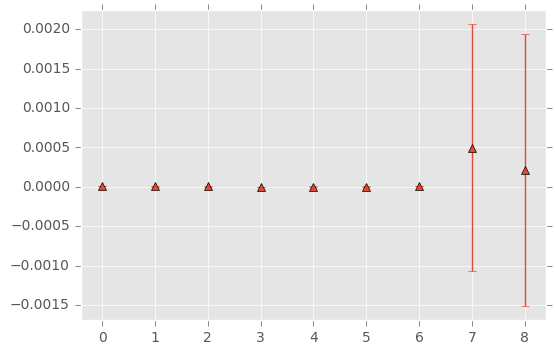

In [1478]:
plt.xticks(range(len(dfpos)), range(len(dfpos)), rotation='horizontal')
plt.margins(0.05)
plt.errorbar(range(len(dfpos)), dfpos['mean'], yerr=dfpos['std'], linestyle='None', marker='^')

<Container object of 3 artists>

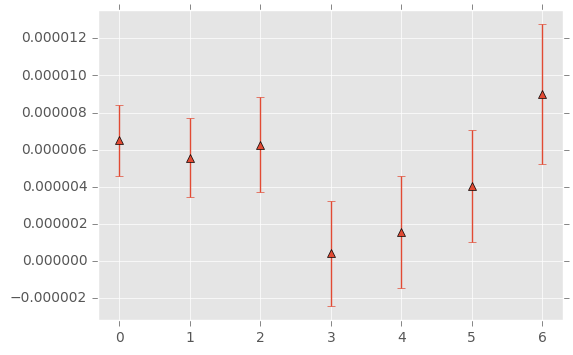

In [1479]:
dfpos_low = dfpos[ (dfpos['mean'] < 0.0001) & (dfpos['mean'] > -0.0001) ]
plt.xticks(range(len(dfpos_low)), range(len(dfpos_low)), rotation='horizontal')
plt.margins(0.05)
plt.errorbar(range(len(dfpos_low)), dfpos_low['mean'], yerr=dfpos_low['std'], linestyle='None', marker='^')

In [1509]:
#dfpos_low['x'] = oxoGateways[dfpos_low['gw1']]['x']

def first_two():
    dfgws = dfpos_low.iloc[0:3][['gw1','gw2','distance']]
    gw2 = dfgws.iloc[0]['gw2']
    dfgws = dfgws.append([{'gw1': gw2, 'gw2': gw2, 'distance': 0.}])
    xs = []
    ys = []
    for gw in dfgws['gw1']:
        xs.append(oxoGateways[gw]['x'])
        ys.append(oxoGateways[gw]['y'])
    dfgws['x'] = xs
    dfgws['y'] = ys
    print dfgws
    dfgws = dfgws[['x','y','distance']]
    D = scipy.matrix(dfgws.values)
    return D


def allD():
    dfgws = dfpos_low[['gw1','gw2','distance']]

    xs = []
    ys = []
    for gw in dfgws['gw1']:
        xs.append(oxoGateways[gw]['x'])
        ys.append(oxoGateways[gw]['y'])
    dfgws['x1'] = xs
    dfgws['y1'] = ys
    xs = []
    ys = []
    for gw in dfgws['gw2']:
        xs.append(oxoGateways[gw]['x'])
        ys.append(oxoGateways[gw]['y'])
    dfgws['x2'] = xs
    dfgws['y2'] = ys
    #dfgws = dfgws.sort_values('distance')
    dfgws = dfgws[['x1','y1','x2','y2','distance']]
    D = scipy.matrix(dfgws.values)
    return D

def realD():
    dfgws = dfpos_low[['gw1','gw2','real_distance']]

    xs = []
    ys = []
    for gw in dfgws['gw1']:
        xs.append(oxoGateways[gw]['x'])
        ys.append(oxoGateways[gw]['y'])
    dfgws['x1'] = xs
    dfgws['y1'] = ys
    xs = []
    ys = []
    for gw in dfgws['gw2']:
        xs.append(oxoGateways[gw]['x'])
        ys.append(oxoGateways[gw]['y'])
    dfgws['x2'] = xs
    dfgws['y2'] = ys
    #dfgws = dfgws.sort_values('real_distance')
    dfgws = dfgws[['x1','y1','x2','y2','real_distance']]
    D = scipy.matrix(dfgws.values)
    return D

In [1505]:
def plot_all(D):
    x = np.linspace(528000, 532000, 1000)
    y = np.linspace(180000, 184000, 1000)
    x, y = np.meshgrid(x, y)

    for i in range(len(D)):
        plt.contour(x, y, ( np.sqrt((x-D[i,0])**2 + (y-D[i,1])**2) - np.sqrt((x-D[i,2])**2 + (y-D[i,3])**2) ), [D[i,4]])

    plt.plot(D[:,0], D[:,1], 'or')
    plt.plot(D[:,2], D[:,3], 'or')
    plt.plot(realx, realy, 'ob')
    plt.show()

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-vers

[[  5.29173271e+05   1.81921514e+05   5.30789339e+05   1.80896845e+05
    1.91192724e+03]
 [  5.29662862e+05   1.82104233e+05   5.30789339e+05   1.80896845e+05
    1.62488931e+03]
 [  5.30034325e+05   1.82751323e+05   5.30789339e+05   1.80896845e+05
    1.88353897e+03]
 [  5.30034325e+05   1.82751323e+05   5.29662862e+05   1.82104233e+05
    2.58649658e+02]
 [  5.29245085e+05   1.82700028e+05   5.29662862e+05   1.82104233e+05
    7.12594037e+02]
 [  5.29245085e+05   1.82700028e+05   5.30034325e+05   1.82751323e+05
    4.53944379e+02]
 [  5.29245085e+05   1.82700028e+05   5.30789339e+05   1.80896845e+05
    2.33748335e+03]]


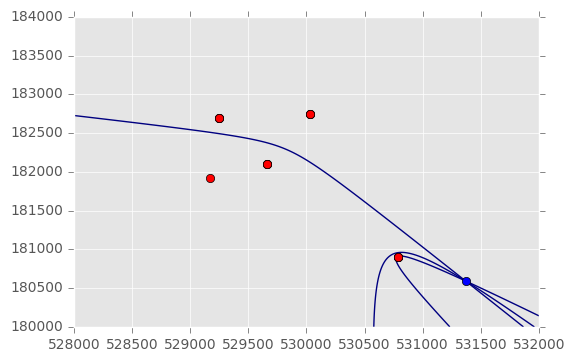

In [1482]:
D = realD()
print D
plot_all(D)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-vers

[[  5.29173271e+05   1.81921514e+05   5.30789339e+05   1.80896845e+05
    1.94690684e+03]
 [  5.29662862e+05   1.82104233e+05   5.30789339e+05   1.80896845e+05
    1.67136048e+03]
 [  5.30034325e+05   1.82751323e+05   5.30789339e+05   1.80896845e+05
    1.87645840e+03]
 [  5.30034325e+05   1.82751323e+05   5.29662862e+05   1.82104233e+05
    1.19842845e+02]
 [  5.29245085e+05   1.82700028e+05   5.29662862e+05   1.82104233e+05
    4.68394981e+02]
 [  5.29245085e+05   1.82700028e+05   5.30034325e+05   1.82751323e+05
    1.20971197e+03]
 [  5.29245085e+05   1.82700028e+05   5.30789339e+05   1.80896845e+05
    2.69945720e+03]]


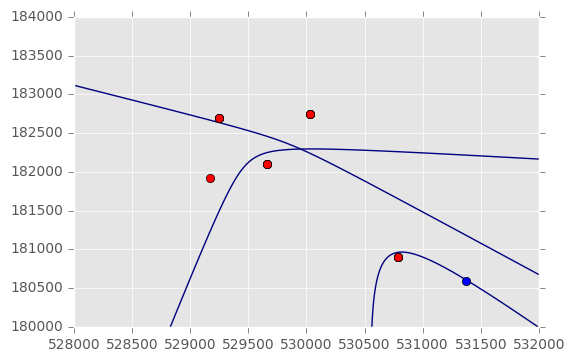

In [1508]:
D = allD()
print D
plot_all(D)

# Iterative method

## Least Squares - Gauss-Newton?

In [403]:
def mlat_iter(rel_stations, prange_obs, xguess = [0,0], limit = 20, maxrounds = 10000):
    xerr = [1e9, 1e9]
    rounds = 0
    if maxrounds is None:
        maxrounds=10000
    
    while numpy.linalg.norm(xerr) > limit:
        prange_est = [[numpy.linalg.norm(station - xguess)] for station in rel_stations]
        dphat = prange_obs - prange_est
        H = numpy.array([(numpy.array(-rel_stations[row,:])+xguess) / prange_est[row] for row in range(0,len(rel_stations))])
        #now we have H, the Jacobian, and can solve for residual error
        xerr = numpy.linalg.lstsq(H, dphat)[0].flatten()
        xguess += xerr
        #print xguess, xerr
        rounds += 1
        if rounds > maxrounds:
            raise Exception("Failed to converge!")
            break
    return xguess

In [406]:
def mlat(D, lmt, guess=None, maxr=None):
    R = [ ([D[x,0],D[x,1]], D[x,2]) for x in range(len(D))]
    
    sorted_R = sorted(R, key=lambda time: time[1])

    stations = [sorted_reply[0] for sorted_reply in sorted_R]
    timestamps = [sorted_reply[1] for sorted_reply in sorted_R]

    me = stations[0]
    
    #list of stations in XY relative to me
    rel_stations = [numpy.array(station) - numpy.array(me) for station in stations[1:]]
    rel_stations.append([0,0]-numpy.array(me))
    rel_stations = numpy.array(rel_stations) #convert list of arrays to 2d array

    #differentiate the timestamps to get TDOA, multiply by c to get pseudorange
    prange_obs = [[(stamp-timestamps[0])] for stamp in timestamps[1:]]
    prange_obs.append( [numpy.linalg.norm(me)] )
    prange_obs = numpy.array(prange_obs)

    #xguess = llh2ecef([37.617175,-122.400843, 8000])-numpy.array(me)
    #xguess = [1.8,1.6]
    #start our guess directly overhead, who cares
    if guess is None:
        xguess = numpy.array(me)# - numpy.array(me)
        #print xguess
    else:
        xguess = guess
    
    xypos = mlat_iter(rel_stations, prange_obs, xguess, limit=lmt, maxrounds=maxr)

    
    return xypos+me

In [382]:
def TDOAs_mlat(gateways, reject=False, m=10.):
    tmp = []
    for gw in gateways:
        x,y = convert_bng(gw['lon'], gw['lat'])
        tmp.append(x+y+[gw['time']])
    
    D = scipy.array(tmp)
    
    if reject:
        
        times = reject_outliers(D[:,2], m)
        if isinstance(times, float):
            return False
        todelete = []
        for i in range(len(D[:,2])):
            if D[i,2] not in times:
                todelete.append(i)
        D = numpy.delete(D, todelete, axis=0)
    
    if len(D[:,2]) < 3:
        return False

    D = D[D[:,2].argsort()]

    for i in reversed(range(len(D[:,2]))):
        D[i,2] -= D[0,2]
        D[i,2] *= C
    return scipy.matrix(D)

[[ 529248.695       182694.556            0.        ]
 [ 529666.501       182097.649         1215.09356165]
 [ 530036.901       182759.178         1500.9979291 ]]
[ 528899.83580026  183263.85373566]


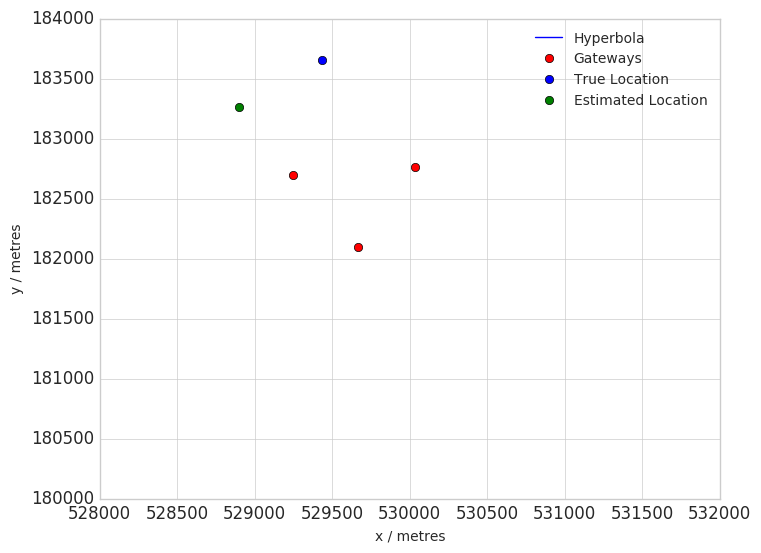

In [383]:
packet = data[2]
D = TDOAs_mlat(packet['gateways'],reject=True)
print D
if D is not False:
    result = mlat(D, 20, maxr=100000)
    print result
    A = convert_bng(packet['payload']['lon'], packet['payload']['lat'])
    plotTDOA(D,A,result)

## Run on Raw Data - no offset

In [399]:
def run_raw(use_last_pos=False, reject=False, m=10.):
    
    errors = []
    prev_result = None
    for i,packet in enumerate(data):
        if len(packet['gateways']) < 3:
            continue
            
        D = TDOAs_mlat(packet['gateways'], reject=reject, m=m)
        
        if D is not False:
            try:
                res = mlat(D, 20, guess=prev_result)
            except:
                continue
            
            A = convert_bng(packet['payload']['lon'], packet['payload']['lat'])

            x = res[0]
            y = res[1]
            error = distance2D(x,y,A[0][0],A[1][0])
            errors.append(error)
            
            if use_last_pos:
                prev_result = res
            
            #plotTDOA(D,A,res)
    
    return errors


In [1541]:
errors_raw = run_raw()
print "Mean Error: %.3f" % np.mean(errors_raw)
print "Median Error: %.3f" % np.median(errors_raw)
print "Standard Deviation: %.3f" % np.std(errors_raw)
print "Proportion of 3+ gateways: %.3f" % (len(errors_raw)/170.0)
print "Number calculated: %d" % len(errors_raw)

Mean Error: 971.724
Median Error: 850.064
Standard Deviation: 614.283
Proportion of 3+ gateways: 0.441
Number calculated: 75


In [492]:
errors_raw = run_raw()
print "Mean Error: %.3f" % np.mean(errors_raw)
print "Median Error: %.3f" % np.median(errors_raw)
print "Standard Deviation: %.3f" % np.std(errors_raw)
print "Proportion of 3+ gateways: %.3f" % (len(errors_raw)/170.0)
print "Number calculated: %d" % len(errors_raw)

Mean Error: 971.757
Median Error: 850.378
Standard Deviation: 614.861
Proportion of 3+ gateways: 0.441
Number calculated: 75


In [493]:
errors_raw_o = run_raw(reject=True, m=100.)
print "Mean Error: %.3f" % np.mean(errors_raw_o)
print "Median Error: %.3f" % np.median(errors_raw_o)
print "Standard Deviation: %.3f" % np.std(errors_raw_o)
print "Proportion of 3+ gateways: %.3f" % (len(errors_raw_o)/170.0)
print "Number calculated: %d" % len(errors_raw_o)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a boolean instead of an integer will result in an error in the future


Mean Error: 1079.903
Median Error: 928.788
Standard Deviation: 715.805
Proportion of 3+ gateways: 0.582
Number calculated: 99


## Run on Raw Data - no offset - using last position as xguess

In [1547]:
errors_raw_lastpos = run_raw(use_last_pos=True)
print "Mean Error: %.3f" % np.mean(errors_raw_lastpos)
print "Median Error: %.3f" % np.median(errors_raw_lastpos)
print "Standard Deviation: %.3f" % np.std(errors_raw_lastpos)
print "Proportion of 3+ gateways: %.3f" % (len(errors_raw_lastpos)/170.0)
print "Number calculated: %d" % len(errors_raw_lastpos)

Mean Error: 1446.603
Median Error: 976.296
Standard Deviation: 1492.073
Proportion of 3+ gateways: 0.447
Number calculated: 76


## Offsets

In [167]:
def TDOAs_mlat_Offsets(gateways, offsets, m=2.):
    tmp = []
    times = []
    for gw in gateways:
        x,y = convert_bng(gw['lon'], gw['lat'])
        tmp.append({
                'x': x[0],
                'y': y[0],
                'time': gw['time'],
                'addr': gw['addr']
            })
        times.append(gw['time'])
     
    G = pd.DataFrame(tmp)
    
    times = reject_outliers(times, m)
    if isinstance(times, float):
        return False
    
    D = G[G['time'].isin(times)]
    D = D.sort_values('time')

    if len(D) < 3:
        return False

    t = D.iloc[0]['time'].copy()

    D['time'] -= t
    for addr in D['addr']:
        if addr == D.iloc[0]['addr']: continue
        offset = offsets[addr][D.iloc[0]['addr']]['mean']
        D.ix[D['addr']==addr, 'time'] += offset

    D['distance'] = D['time']*C
    D = D[['x','y','distance']]
    
    return scipy.matrix(D.values)

In [415]:
def run_offsets(use_last_pos=False, m=2., om=1., acc=20, maxr=10000):
    
    errors = []
    results = []
    prev_result = (0,0)
    
    nums = 0
    fails = 0
    
    offsets = calculate_offsets(m=om)
    
    for i,packet in enumerate(data):
        if len(packet['gateways']) < 3:
            continue
        
        D = TDOAs_mlat_Offsets(packet['gateways'], offsets, m=m)
        
        if D is not False:
            nums += 1
            try:
                res = mlat(D, acc, guess=prev_result, maxr=maxr)
            except:
                fails += 1
                continue

            A = convert_bng(packet['payload']['lon'], packet['payload']['lat'])

            x = res[0]
            y = res[1]
            
            error = distance2D(x,y,A[0][0],A[1][0])
            if numpy.isnan(error):
                continue
            errors.append(error)
            
            results.append({'estx':x, 'esty':y, 'realx':A[0][0], 'realy':A[1][0], 'error': error})
            
            if use_last_pos:
                prev_result = res
            
            #plotTDOA(D,A,res)
    
    print nums
    print fails
    return errors, results

In [1585]:
errors_offsets, results = run_offsets(m=5.)
print "Mean Error: %.3f" % np.mean(errors_offsets)
print "Median Error: %.3f" % np.median(errors_offsets)
print "Standard Deviation: %.3f" % np.std(errors_offsets)
print "Proportion of 3+ gateways: %.3f" % (len(errors_offsets)/170.0)
print "Number calculated: %d" % len(errors_offsets)



/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a boolean instead of an integer will result in an error in the future


Mean Error: 967.054
Median Error: 855.117
Standard Deviation: 611.302
Proportion of 3+ gateways: 0.518
Number calculated: 88


In [416]:
errors_offsets, results = run_offsets(m=100., om=1.)
print "Mean Error: %.3f" % np.mean(errors_offsets)
print "Median Error: %.3f" % np.median(errors_offsets)
print "Standard Deviation: %.3f" % np.std(errors_offsets)
print "Proportion of 3+ gateways: %.3f" % (len(errors_offsets)/170.0)
print "Number calculated: %d" % len(errors_offsets)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a boolean instead of an integer will result in an error in the future


104
9
Mean Error: 938.146
Median Error: 862.639
Standard Deviation: 557.019
Proportion of 3+ gateways: 0.553
Number calculated: 94


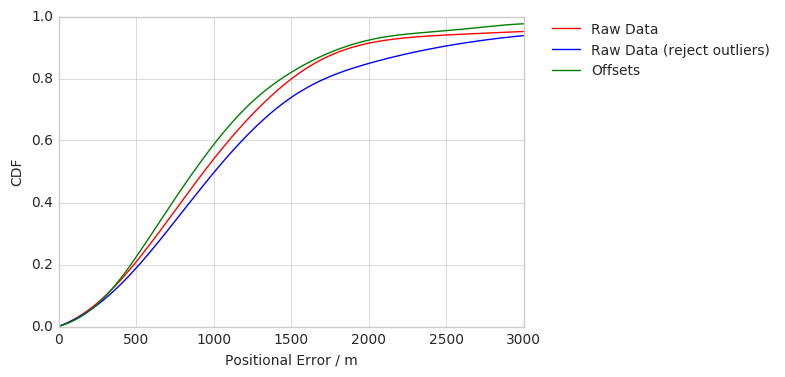

0.505209206489


In [499]:
#plt.hist(errors_offsets, bins=500, normed=True, cumulative=False, histtype='step')

from scipy.stats.kde import gaussian_kde
from numpy import linspace

dist_space = linspace( 0, 3000, 1000 )

kde_raw = gaussian_kde( errors_raw )
vals_raw = [kde_raw.integrate_box_1d(0,x) for x in dist_space]

kde_rawo = gaussian_kde( errors_raw_o )
vals_rawo = [kde_rawo.integrate_box_1d(0,x) for x in dist_space]

kde_offsets = gaussian_kde( errors_offsets )
vals_offsets = [kde_offsets.integrate_box_1d(0,x) for x in dist_space]

r = plt.plot(dist_space, vals_raw, 'r', label='Raw Data')
b = plt.plot(dist_space, vals_rawo, 'b', label='Raw Data (reject outliers)')
g = plt.plot(dist_space, vals_offsets, 'g', label='Offsets')

plt.legend(fontsize=10, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlabel("Positional Error / m")
plt.ylabel("CDF")
plt.show()

print kde.integrate_box_1d(0,880)

In [525]:
print kde_raw.integrate_box_1d(0,940)
print kde_rawo.integrate_box_1d(0,1010)
print kde_offsets.integrate_box_1d(0,870)
print ""
print kde_raw.integrate_box_1d(0,1510)
print kde_rawo.integrate_box_1d(0,1720)
print kde_offsets.integrate_box_1d(0,1440)

0.500697311986
0.501250282284
0.498185231615

0.80158165708
0.799656446608
0.800181768787


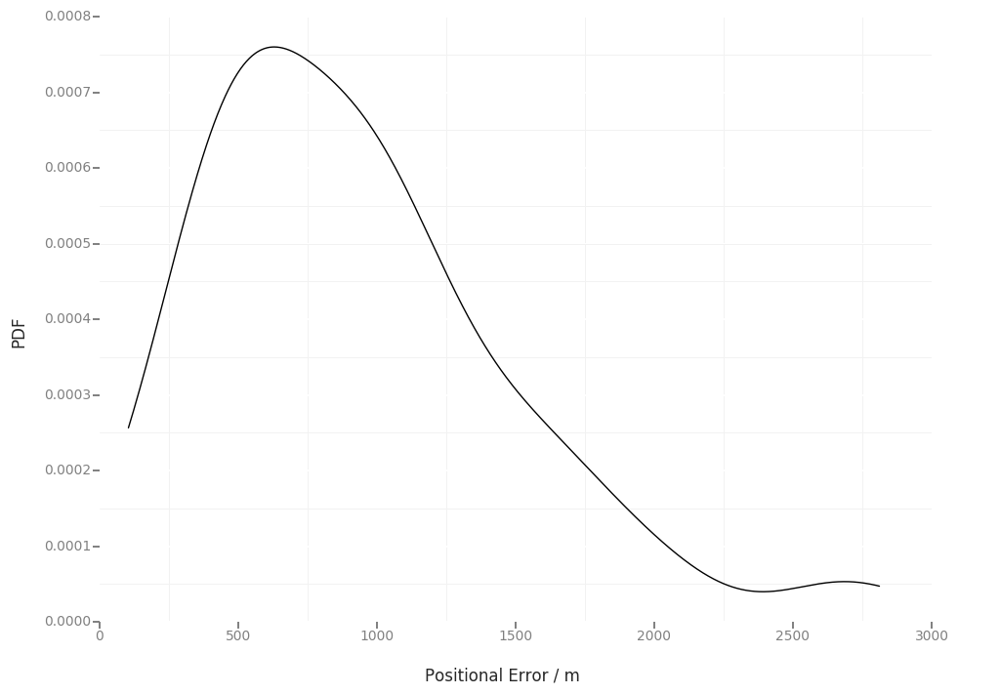

<ggplot: (281204577)>

In [421]:
df = pd.DataFrame(errors_offsets)
ggplot(aes(x='errors_offsets'), data=df) + stat_density() + xlab("Positional Error / m") + ylab("PDF")  + theme_bw()

In [1592]:
errors_offsets, results = run_offsets(use_last_pos=True,m=100.)
print "Mean Error: %.3f" % np.mean(errors_offsets)
print "Median Error: %.3f" % np.median(errors_offsets)
print "Standard Deviation: %.3f" % np.std(errors_offsets)
print "Proportion of 3+ gateways: %.3f" % (len(errors_offsets)/170.0)
print "Number calculated: %d" % len(errors_offsets)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a boolean instead of an integer will result in an error in the future


Mean Error: 990.857
Median Error: 965.537
Standard Deviation: 548.169
Proportion of 3+ gateways: 0.276
Number calculated: 47


In [411]:
errors_offsets, results = run_offsets(m=100., acc=100)
#print errors_offsets
print "Mean Error: %.3f" % np.mean(errors_offsets)
print "Median Error: %.3f" % np.median(errors_offsets)
print "Standard Deviation: %.3f" % np.std(errors_offsets)
print "Proportion of 3+ gateways: %.3f" % (len(errors_offsets)/170.0)
print "Number calculated: %d" % len(errors_offsets)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a boolean instead of an integer will result in an error in the future


104
6
Mean Error: 995.716
Median Error: 907.518
Standard Deviation: 622.699
Proportion of 3+ gateways: 0.571
Number calculated: 97


## Oversampling Oxotower

In [424]:
## i=26520 -> data[495]
lat = 51.509
lon = -0.1084
realx, realy = convert_bng(lon, lat)
realx, realy = realx[0], realy[0]


def run_raw_oxo(reject=False, m=10., guess=False, offsets=False, maxr=10000):
    
    errors = []
    results = []
    
    os = calculate_offsets(m=1.)

    for packet in data[495:]:
        if len(packet['gateways']) < 3:
            continue
            
        if offsets:
            D = TDOAs_mlat_Offsets(packet['gateways'], os, m=m)  
        else:
            D = TDOAs_mlat(packet['gateways'], reject=reject, m=m)
        
        if D is not False:
            
            xguess = (0,0)
            if len(results) > 2 and guess:
                avgx,avgy,stdx,stdy = average_results_oxo(results)
                xguess = [avgx,avgy]
            
            try:
                res = mlat(D, 20, guess=xguess, maxr=maxr)
            except:
                continue

            x = res[0]
            y = res[1]
            error = distance2D(x,y,realx,realy)
            errors.append(error)
            
            results.append(res)
            
            #plotTDOA(D,A,res)
    
    return errors, results

In [59]:
def average_results_oxo(results, reject=False, m=10.):
    
    results = np.array(results)
    
    if reject:
        for i in [0,1]:
            remain = reject_outliers(results[:,i], m)
            if isinstance(remain, float):
                remain = [remain]
            todelete = []
            for j in range(len(results[:,i])):
                if results[j,i] not in remain:
                    todelete.append(j)
            results = numpy.delete(results, todelete, axis=0)    
    
    mean_x = np.mean(results[:,0])
    std_x = np.std(results[:,0])
    mean_y = np.mean(results[:,1])
    std_y = np.std(results[:,1])
    
    return mean_x, mean_y, std_x, std_y

In [1605]:
errs, res = run_raw_oxo()
print "Mean Error: %.3f" % np.mean(errs)
print "Standard Deviation: %.3f" % np.std(errs)
print "Number calculated: %d" % len(errs)
print ""
x,y,stdx,stdy = average_results_oxo(res)
error = distance2D(x,y,realx,realy)
print "Result: %.3f, %.3f" % (x,y)
print "Standard deviation: %.3f, %.3f" % (stdx,stdy)
print "Final Error: %.3f" % error

Mean Error: 1195.552
Standard Deviation: 838.491
Number calculated: 22

Result: 530925.828, 180740.732
Standard deviation: 474.386, 1299.724
Final Error: 466.997


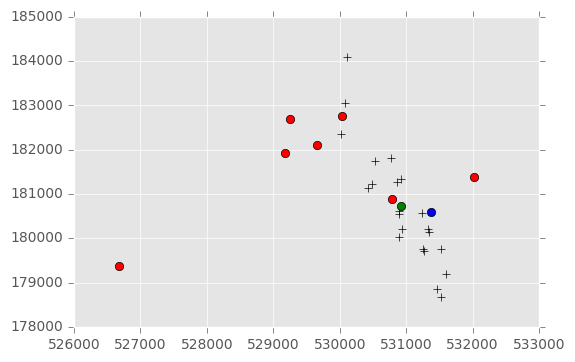

In [1613]:
r = np.array(res)
plt.plot(r[:,0], r[:,1], '+k')    

for gw in oxoGateways.values():
    plt.plot(gw['x'], gw['y'], 'or')
plt.plot(realx, realy, 'ob')
plt.plot(530925.828, 180740.732, 'og')
plt.show()

In [448]:
errs, res = run_raw_oxo(offsets=False, reject=True, m=5.)
print "Mean Error: %.3f" % np.mean(errs)
print "Standard Deviation: %.3f" % np.std(errs)
print "Number calculated: %d" % len(errs)
print ""
x,y,stdx,stdy = average_results_oxo(res, reject=True, m=20.)
error = distance2D(x,y,realx,realy)
print "Result: %.3f, %.3f" % (x,y)
print "Standard deviation: %.3f, %.3f" % (stdx,stdy)
print "Final Error: %.3f" % error

Mean Error: 1197.685
Standard Deviation: 835.759
Number calculated: 49

Result: 531010.563, 180433.799
Standard deviation: 516.901, 1308.575
Final Error: 391.648


/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a boolean instead of an integer will result in an error in the future


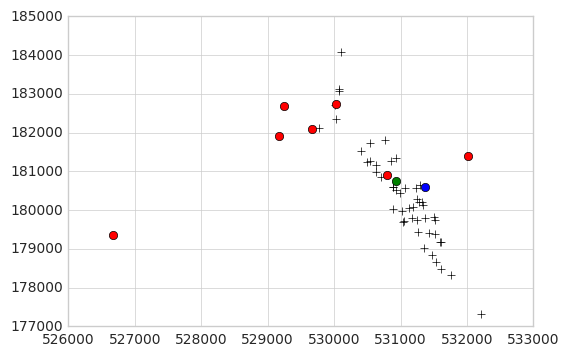

In [449]:
r = np.array(res)
plt.plot(r[:,0], r[:,1], '+k')    

for gw in oxoGateways.values():
    plt.plot(gw['x'], gw['y'], 'or')
plt.plot(realx, realy, 'ob')
plt.plot(530925.828, 180740.732, 'og')
plt.show()

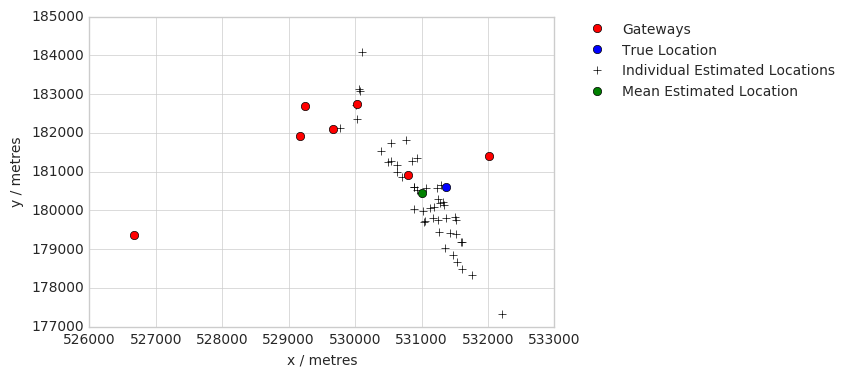

In [450]:
r = np.array(res)
plt.plot(r[:,0], r[:,1], '+k')    

for gw in oxoGateways.values():
    plt.plot(gw['x'], gw['y'], 'or')
plt.plot(realx, realy, 'ob')
plt.plot(x, y, 'og')


legend = []
legend.append(mlines.Line2D(range(1), range(1), label='Gateways', color="none", marker='o', markerfacecolor="red"))
legend.append(mlines.Line2D(range(1), range(1), label='True Location', color="none", marker='o', markerfacecolor="blue"))
legend.append(mlines.Line2D(range(1), range(1), label='Individual Estimated Locations', color="none", marker='+', markeredgecolor="black"))
legend.append(mlines.Line2D(range(1), range(1), label='Mean Estimated Location', color="none", marker='o', markerfacecolor="green"))
    
plt.legend(handles=legend, numpoints=1, fontsize=10, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.ylabel('y / metres', fontsize=10)
plt.xlabel('x / metres', fontsize=10)

plt.show()

In [1695]:
map_2 = folium.Map(location=[51.523668, -0.117931], tiles='Stamen Toner', zoom_start=12)

for gw in oxoGateways.values():
    gwlon, gwlat = convert_lonlat(gw['x'], gw['y'])
    folium.CircleMarker([gwlat[0], gwlon[0]],
                    radius=7,
                    color='#db3a00',
                    fill_color='#db3a00',
                    fill_opacity=1
                   ).add_to(map_2)       
    
for point in res:
    plon, plat = convert_lonlat(point[0], point[1])
    folium.CircleMarker([plat[0], plon[0]],
                    radius=2,
                    color='#d80be2',
                    fill_color='#d80be2',
                    fill_opacity=1
                   ).add_to(map_2)    
    

rlon, rlat = convert_lonlat(realx, realy)
folium.CircleMarker([rlat[0], rlon[0]],
                radius=7,
                color='#0059ff',
                fill_color='#0059ff',
                fill_opacity=1
               ).add_to(map_2) 

elon, elat = convert_lonlat(x, y)
folium.CircleMarker([elat[0], elon[0]],
                radius=7,
                color='#3bd100',
                fill_color='#3bd100',
                fill_opacity=1
               ).add_to(map_2) 
  
    
map_2

In [443]:
cnt=0
for packet in data[495:]:
    if len(packet['gateways']) < 3:
        continue
    cnt+=1
cnt

76

In [451]:
22./76.

0.2894736842105263